# Scaling tests

This notebook can be understood as a continuation of previous two in which we just tried out if using curriculum learning was beneficial or not and due to the fact that.

Since we know maximum values are way too large, we'll try min-max scaling the data but instead of using the maximum we'll use the 90 percentile. Also, since minimums might be too low as well we'll use 2 percentile.

**Standardization**
- Simple architecture (2 layers deep both)
  - Not curriculum
  - Curriculum
- Simple architecture (3 layers deep discriminator)
  - Not curriculum
  - Curriculum
- Simple architecture (3 layers deep both)
  - Not curriculum
  - Curriculum
- Complex Discriminator (2 layers deep both)
  - Not curriculum
  - Curriculum
- Complex Discriminator (3 layers deep gen)
  - Not curriculum
  - Curriculum
- Complex Discriminator (3 layers deep discr)
  - Not curriculum
  - Curriculum
- Complex Discriminator (3 layers deep both)
  - Not curriculum
  - Curriculum
- Complex Generator (2 layers deep both)
  - Not curriculum
  - Curriculum
- Complex Generator (3 layers deep gen)
  - Not curriculum
  - Curriculum
- Complex Generator (3 layers deep discr)
  - Not curriculum
  - Curriculum
- Complex Generator (3 layers deep both)
  - Not curriculum
  - Curriculum
- Both Complex (2 layers deep both)
  - Not curriculum
  - Curriculum
- Both Complex (3 layers deep gen)
  - Not curriculum
  - Curriculum
- Both Complex (3 layers deep discr)
  - Not curriculum
  - Curriculum
- Both Complex (3 layers deep both)
  - Not curriculum
  - Curriculum

In [0]:
# Connect to google drive where we store out scripts and our generated songs.
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).




Setup steps needed to be able to use music_data_utils. Basically, installing from source python3-midi, which music_data_utils uses. In order to install python3-midi a module called swig is needed and therefore we install it using the usual linux installer (apt-get).

Finally, to load the music_data_utils script and all the functionalities related to out implementation of C-RNN_GAN, we use the standard python importer.

In [0]:
!git clone https://github.com/louisabraham/python3-midi.git

Cloning into 'python3-midi'...
remote: Enumerating objects: 553, done.
remote: Total 553 (delta 0), reused 0 (delta 0), pack-reused 553
Receiving objects: 100% (553/553), 210.57 KiB | 7.26 MiB/s, done.
Resolving deltas: 100% (313/313), done.


In [0]:
!apt-get install swig -y

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  swig3.0
Suggested packages:
  swig-doc swig-examples swig3.0-examples swig3.0-doc
The following NEW packages will be installed:
  swig swig3.0
0 upgraded, 2 newly installed, 0 to remove and 25 not upgraded.
Need to get 1,100 kB of archives.
After this operation, 5,822 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 swig3.0 amd64 3.0.12-1 [1,094 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 swig amd64 3.0.12-1 [6,460 B]
Fetched 1,100 kB in 1s (751 kB/s)
Selecting previously unselected package swig3.0.
(Reading database ... 144568 files and directories currently installed.)
Preparing to unpack .../swig3.0_3.0.12-1_amd64.deb ...
Unpacking swig3.0 (3.0.12-1) ...
Selecting previously unselected package swig.
Preparing to unpack .../swig_3.0.12-1_amd64.deb ...
Unpacking 

In [0]:
!cd python3-midi && python setup.py install

/usr/local/lib/python3.6/dist-packages/setuptools/dist.py:454: UserWarning: Normalizing 'v0.2.3' to '0.2.3'
  warnings.warn(tmpl.format(**locals()))
running install
running build_ext
building '_sequencer_alsa' extension
swigging src/sequencer_alsa/sequencer_alsa.i to src/sequencer_alsa/sequencer_alsa_wrap.c
swig -python -I/usr/include -o src/sequencer_alsa/sequencer_alsa_wrap.c src/sequencer_alsa/sequencer_alsa.i
creating build
creating build/temp.linux-x86_64-3.6
creating build/temp.linux-x86_64-3.6/src
creating build/temp.linux-x86_64-3.6/src/sequencer_alsa
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/include/python3.6m -c src/sequencer_alsa/sequencer_alsa_wrap.c -o build/temp.linux-x86_64-3.6/src/sequencer_alsa/sequencer_alsa_wrap.o
creating build/lib.linux-x86_64-3.6
creating build/lib.linux-x86_64-3.6/midi
creating build/lib.linux-x86_64-3.6/midi/sequencer
x86_6

In [0]:
import importlib.util

In [0]:
## Import Music Utils
spec = importlib.util.spec_from_file_location("MusicDataLoader", "./drive/My Drive/TFM/music_data_utils.py")
musicDataLoad = importlib.util.module_from_spec(spec)
spec.loader.exec_module(musicDataLoad)

In [0]:
## Import C-RNN-GAN
spec = importlib.util.spec_from_file_location("*", "./drive/My Drive/TFM/crnngan.py")
crnngan = importlib.util.module_from_spec(spec)
spec.loader.exec_module(crnngan)

In [0]:
import torch
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
# Instantiate the data loader
drive_path_to_music = './drive/My Drive/TFM/music_data'
musicDataLoader = musicDataLoad.MusicDataLoader(drive_path_to_music, 0, 0)

Data loader: datadir: ./drive/My Drive/TFM/music_data
num genres:1
num composers: 154
limit works per composer: None
Reading files classical/adam: 3
Reading files classical/aguado: 5
Reading files classical/albenizisaac: 20
Reading files classical/albenizmateo: 2
Reading files classical/albinoni: 1
Reading files classical/alford: 2
Reading files classical/alkan: 11
Reading files classical/anderson: 8
Reading files classical/ansell: 1
Reading files classical/arensky: 5
Reading files classical/arriaga: 2
Reading files classical/bach: 100
Reading files classical/bach: 200
Reading files classical/bach: 300
Reading files classical/bach: 360
Reading files classical/barber: 8
Path does not exist: ./drive/My Drive/TFM/music_data/classical/barbieri
Reading files classical/bartok: 99
Reading files classical/bax: 2
Error reading ./drive/My Drive/TFM/music_data/classical/beethoven/14715thSympnmov1.mid
Reading files classical/beethoven: 68
Reading files classical/bellini: 4
Reading files classical/

In [0]:
import pickle

f = open('./drive/My Drive/TFM/dataLoader', 'wb')
pickle.dump(musicDataLoader, f)
f.close()

PicklingError: ignored

In [0]:
import random
# Set random seeds for REPRODUCIBILITY
manualSeed = 0
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  0


## Mean and standard deviation

In [0]:
means, stds = crnngan.compute_mean_and_std(musicDataLoader)

### Simple architecture (2 layers deep both)

#### No curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
# Curriculum learning
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]


crnngan_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs, 
                 scale=scale, scale_values=scale_values)

cuda


In [0]:
crnngan_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2134	Loss_G: 5.1650	D(x): -4.5937	D(G(z)): -4.6046 / -0.0006
 Time since epoch started: 0.42
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 0.2826	Loss_G: 5.8519	D(x): -0.0609	D(G(z)): -0.0652 / -0.0471
 Time since epoch started: 2.47
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.2513	Loss_G: 4.6744	D(x): -0.1141	D(G(z)): -0.1028 / -0.0715
 Time since epoch started: 4.51
There are a total of 10 fake songs saved already
Epoch time: 5.54
[1/50][30]	Loss_D: 0.0219	Loss_G: 5.7811	D(x): -0.0073	D(G(z)): -0.0146 / -0.0051
 Time since epoch started: 1.02
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.1324	Loss_G: 6.6356	D(x): -0.0101	D(G(z)): -0.0074 / -0.0225
 Time since epoch started: 3.07
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.1321	Loss_G: 3.9501	D(x): -0.0470	D(G(z)): -0.0168 / -0.0720
 Time since epoch started: 5.12
There are a total of 25 fake

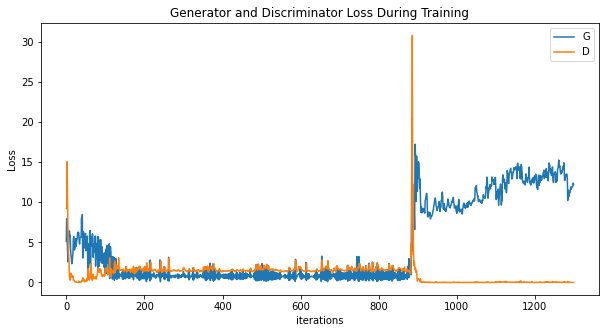

In [0]:
crnngan_std.plot_losses()

TODO: Comment on convergence

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

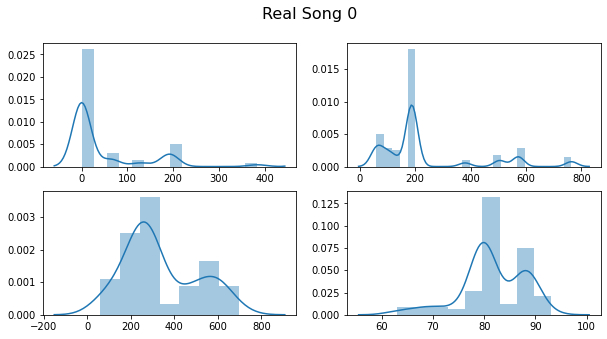

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


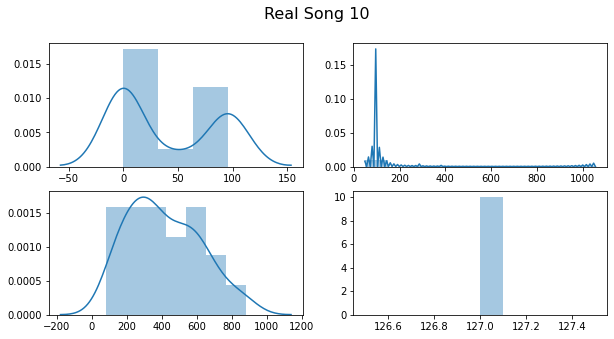

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

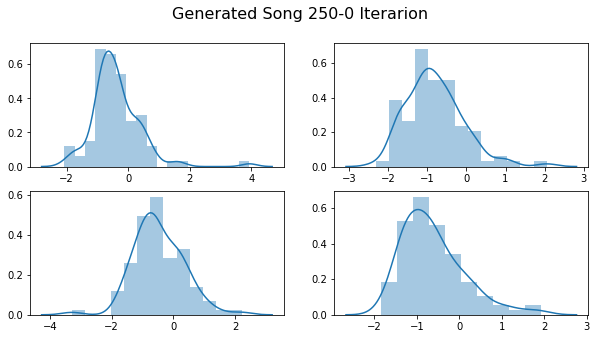

In [0]:
gen_song_250 = crnngan_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250[:,3], ax=axs[1, 1])

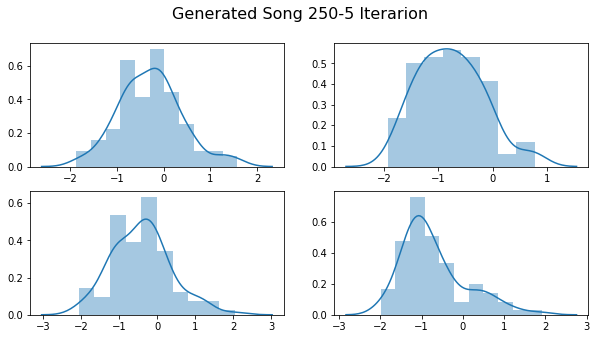

In [0]:
gen_song_250_5 = crnngan_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5[:,3], ax=axs[1, 1])

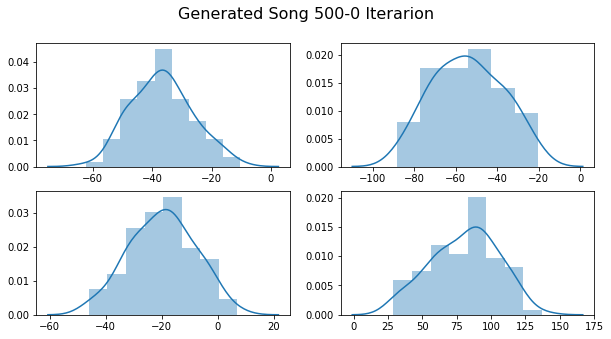

In [0]:
gen_song_500 = crnngan_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500[:,3], ax=axs[1, 1])

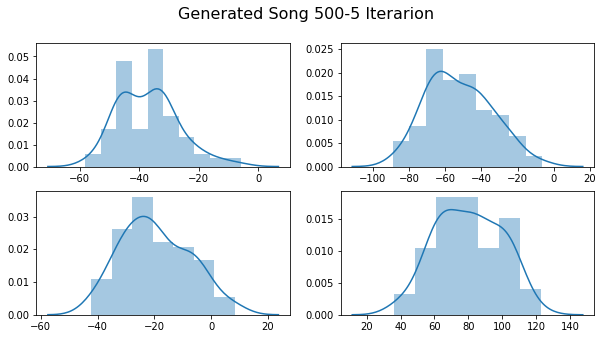

In [0]:
gen_song_500_5 = crnngan_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5[:,3], ax=axs[1, 1])

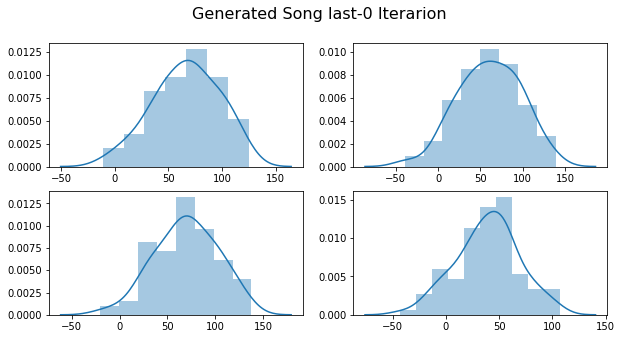

In [0]:
gen_song_last = crnngan_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last[:,3], ax=axs[1, 1])

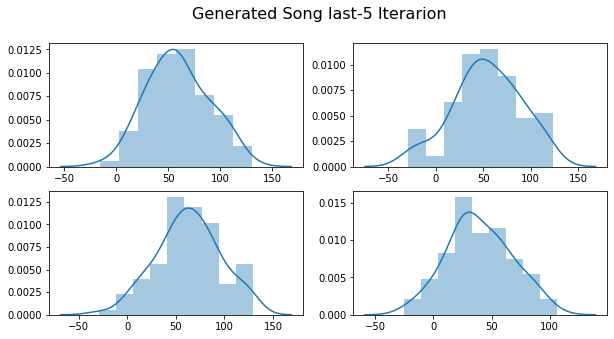

In [0]:
gen_song_last_5 = crnngan_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5[:,3], ax=axs[1, 1])

We didn't get a very good convergence. Also, we haven't got good distributions...

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
# Curriculum learning
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]


crnngan_curriculum_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs, 
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length)

cuda


In [0]:
crnngan_curriculum_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9968	Loss_G: 5.6060	D(x): -2.9921	D(G(z)): -2.9930 / -0.0000
 Time since epoch started: 0.06
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 1.4198	Loss_G: 4.2838	D(x): -0.0891	D(G(z)): -0.2343 / -0.1227
 Time since epoch started: 0.58
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.3698	Loss_G: 4.6809	D(x): -0.0590	D(G(z)): -0.1153 / -0.0935
 Time since epoch started: 1.07
There are a total of 10 fake songs saved already
Epoch time: 1.31
[1/80][30]	Loss_D: 0.1455	Loss_G: 4.9702	D(x): -0.0640	D(G(z)): -0.0693 / -0.0554
 Time since epoch started: 0.25
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.0695	Loss_G: 5.9132	D(x): -0.0076	D(G(z)): -0.0481 / -0.0115
 Time since epoch started: 0.74
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.1364	Loss_G: 5.6463	D(x): -0.0074	D(G(z)): -0.0414 / -0.0275
 Time since epoch started: 1.22
There are a total of 25 fake

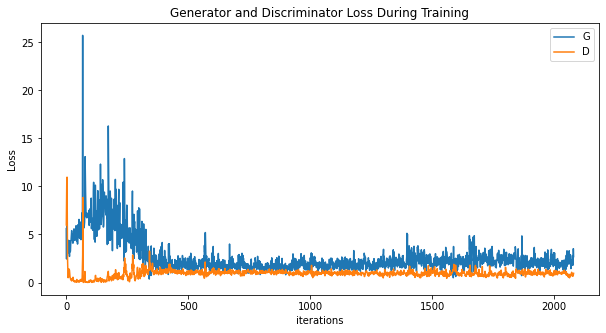

In [0]:
crnngan_curriculum_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

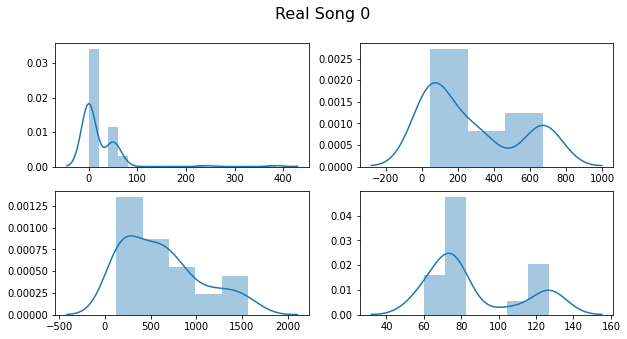

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


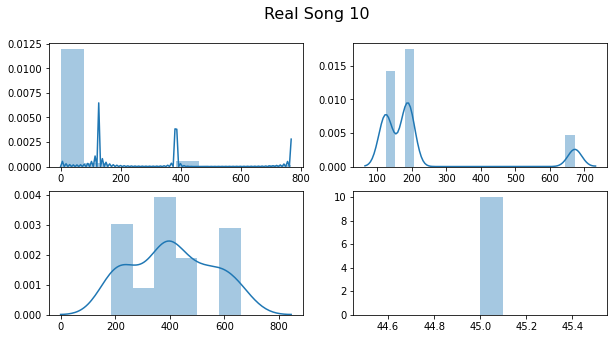

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

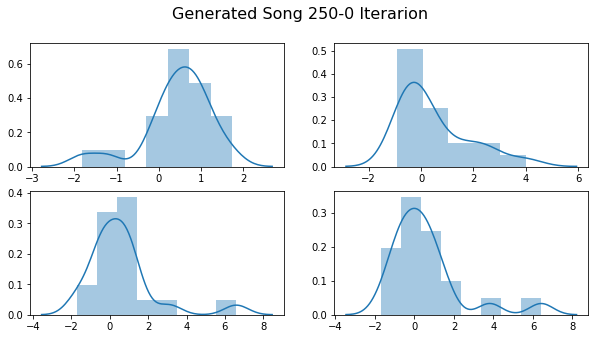

In [0]:
gen_song_250_curriculum = crnngan_curriculum_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum[:,3], ax=axs[1, 1])

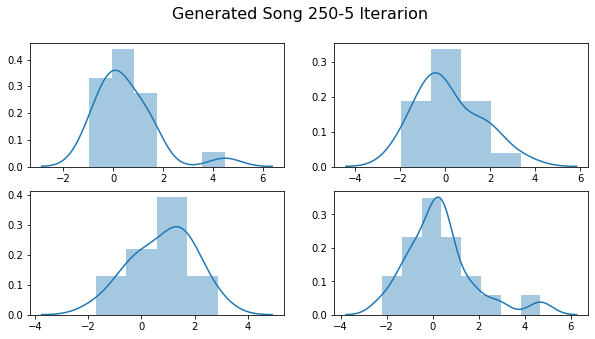

In [0]:
gen_song_250_5_curriculum = crnngan_curriculum_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum[:,3], ax=axs[1, 1])

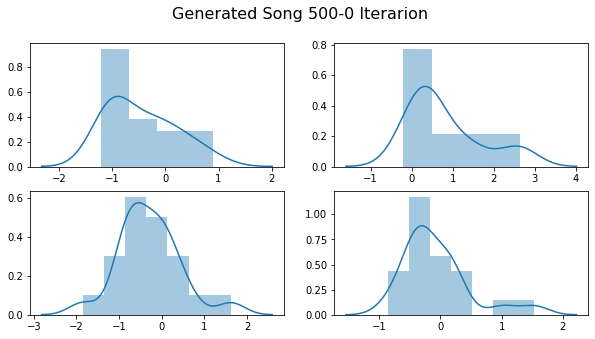

In [0]:
gen_song_500_curriculum = crnngan_curriculum_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum[:,3], ax=axs[1, 1])

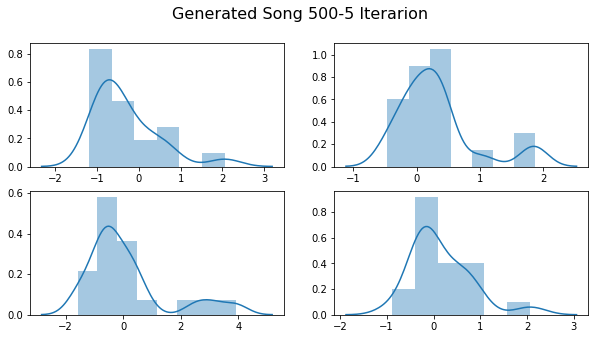

In [0]:
gen_song_500_5_curriculum = crnngan_curriculum_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum[:,3], ax=axs[1, 1])

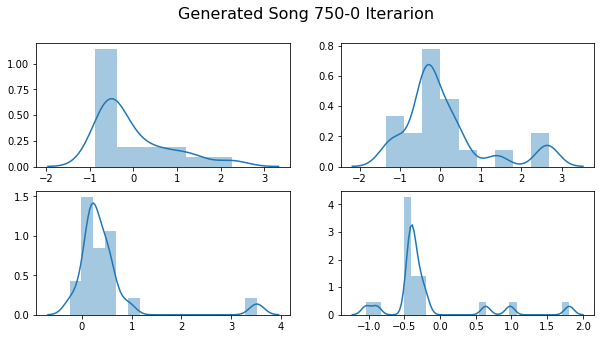

In [0]:
gen_song_750_curriculum = crnngan_curriculum_std.generated_songs[750][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 750-0 Iterarion', fontsize=16)
sns.distplot(gen_song_750_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_750_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_750_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_750_curriculum[:,3], ax=axs[1, 1])

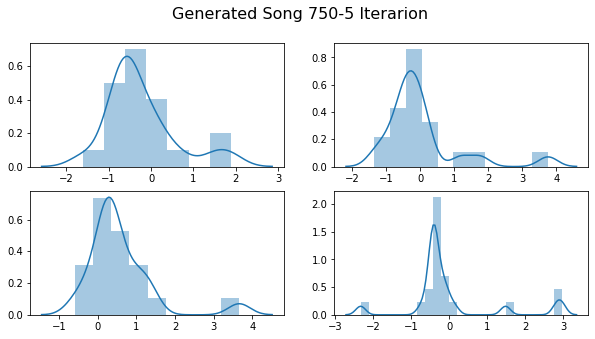

In [0]:
gen_song_750_5_curriculum = crnngan_curriculum_std.generated_songs[750][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 750-5 Iterarion', fontsize=16)
sns.distplot(gen_song_750_5_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_750_5_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_750_5_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_750_5_curriculum[:,3], ax=axs[1, 1])

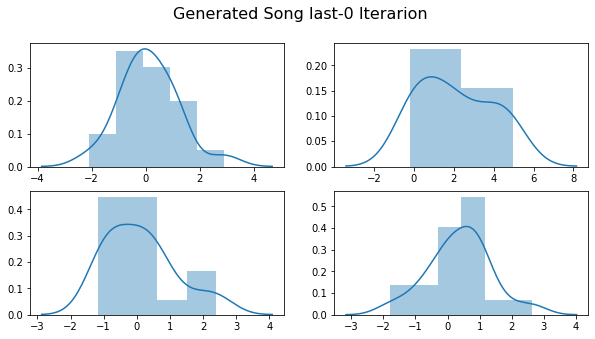

In [0]:
gen_song_last_curriculum = crnngan_curriculum_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum[:,3], ax=axs[1, 1])

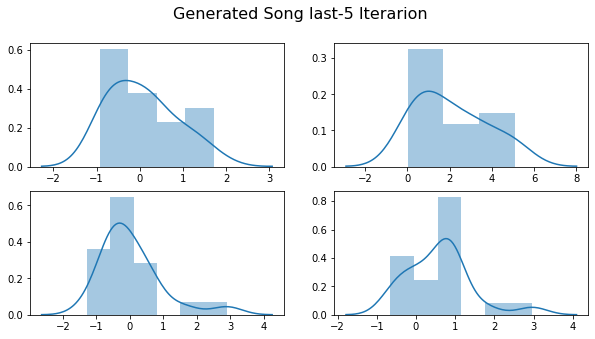

In [0]:
gen_song_last_5_curriculum = crnngan_curriculum_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum[:,3], ax=axs[1, 1])

Even though convergence and distributions don't look too bad, it's important to note that we are using curriculum learning and we haven't been able to increase the sequence length...

Either way we'll save the songs so that we can listen to them and assess if they are any good.




In [0]:
gen_song_250_curriculum_unstd = crnngan.unstandardize(gen_song_250_curriculum, means, stds)
gen_song_250_5_curriculum_unstd = crnngan.unstandardize(gen_song_250_5_curriculum, means, stds)

gen_song_500_curriculum_unstd = crnngan.unstandardize(gen_song_500_curriculum, means, stds)
gen_song_500_5_curriculum_unstd = crnngan.unstandardize(gen_song_500_5_curriculum, means, stds)

gen_song_750_curriculum_unstd = crnngan.unstandardize(gen_song_750_curriculum, means, stds)
gen_song_750_5_curriculum_unstd = crnngan.unstandardize(gen_song_750_5_curriculum, means, stds)

gen_song_last_curriculum_unstd = crnngan.unstandardize(gen_song_last_curriculum, means, stds)
gen_song_last_5_curriculum_unstd = crnngan.unstandardize(gen_song_last_5_curriculum, means, stds)


In [0]:
save_path = './drive/My Drive/TFM/gen_songs_curriculum_stds'
musicDataLoader.save_data(save_path+'/gen_song_250_curriculum_unstd.midi', gen_song_250_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_250_5_curriculum_unstd.midi', gen_song_250_5_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_curriculum_unstd.midi', gen_song_500_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_5_curriculum_unstd.midi', gen_song_500_5_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_750_curriculum_unstd.midi', gen_song_750_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_750_5_curriculum_unstd.midi', gen_song_750_5_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_curriculum_unstd.midi', gen_song_last_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_5_curriculum_unstd.midi', gen_song_last_5_curriculum_unstd)

midi.Pattern(format=1, resolution=384, tracks=\
[midi.Track(\
  [midi.SetTempoEvent(tick=0, data=[20, 88, 85]),
   midi.NoteOnEvent(tick=-18, channel=0, data=[67, 99]),
   midi.NoteOnEvent(tick=12, channel=0, data=[60, 62]),
   midi.NoteOnEvent(tick=15, channel=0, data=[73, 112]),
   midi.NoteOnEvent(tick=13, channel=0, data=[57, 88]),
   midi.NoteOnEvent(tick=9, channel=0, data=[60, 105]),
   midi.NoteOnEvent(tick=62, channel=0, data=[51, 68]),
   midi.NoteOnEvent(tick=32, channel=0, data=[67, 98]),
   midi.NoteOnEvent(tick=192, channel=0, data=[57, 102]),
   midi.NoteOffEvent(tick=23, channel=0, data=[60, 0]),
   midi.NoteOnEvent(tick=109, channel=0, data=[73, 110]),
   midi.NoteOnEvent(tick=124, channel=0, data=[64, 66]),
   midi.NoteOnEvent(tick=0, channel=0, data=[56, 107]),
   midi.NoteOnEvent(tick=94, channel=0, data=[87, 127]),
   midi.NoteOnEvent(tick=15, channel=0, data=[71, 88]),
   midi.NoteOffEvent(tick=2, channel=0, data=[67, 0]),
   midi.NoteOffEvent(tick=28, channel=0, 

### Simple architecture (3 layers deep discriminator)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]


crnngan_deep_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values)

cuda


In [0]:
crnngan_deep_discr_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2218	Loss_G: 2.7365	D(x): -4.6038	D(G(z)): -4.6050 / -0.9097
 Time since epoch started: 0.29
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 1.7021	Loss_G: 2.8395	D(x): -0.1624	D(G(z)): -0.7798 / -0.7730
 Time since epoch started: 2.97
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.9330	Loss_G: 2.6837	D(x): -0.1224	D(G(z)): -0.1199 / -0.1728
 Time since epoch started: 5.65
There are a total of 10 fake songs saved already
Epoch time: 6.99
[1/50][30]	Loss_D: 0.6188	Loss_G: 3.3304	D(x): -0.1030	D(G(z)): -0.1460 / -0.1774
 Time since epoch started: 1.35
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.5191	Loss_G: 2.4250	D(x): -0.1384	D(G(z)): -0.1170 / -0.2202
 Time since epoch started: 4.05
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 1.3681	Loss_G: 5.0003	D(x): -0.0352	D(G(z)): -0.2988 / -0.0349
 Time since epoch started: 6.76
There are a total of 25 fake

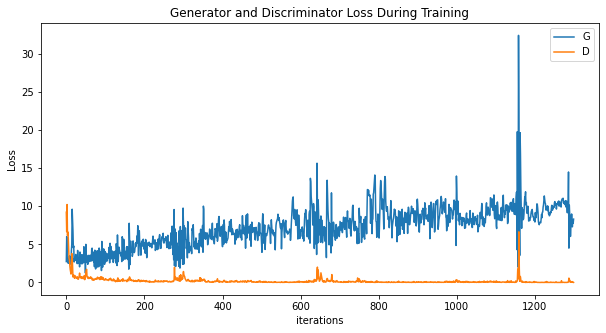

In [0]:
crnngan_deep_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

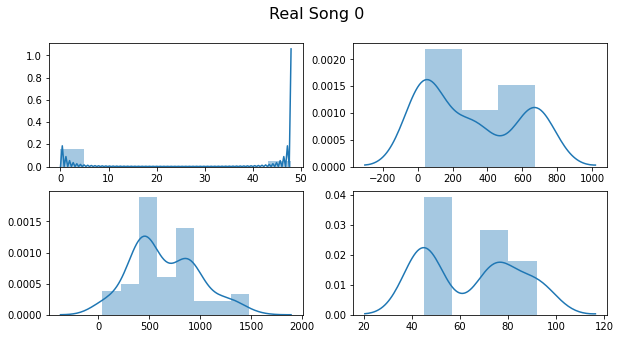

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

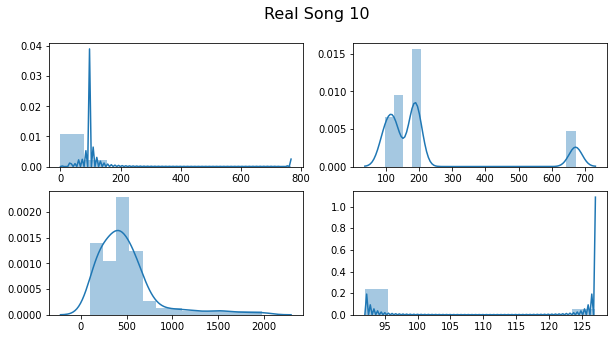

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

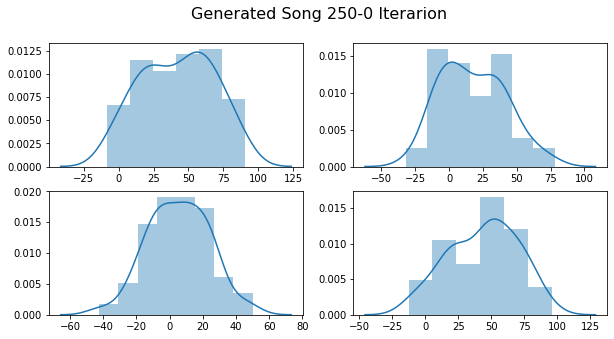

In [0]:
gen_song_250_deep_disc_std = crnngan_deep_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_disc_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_disc_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_disc_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_disc_std[:,3], ax=axs[1, 1])

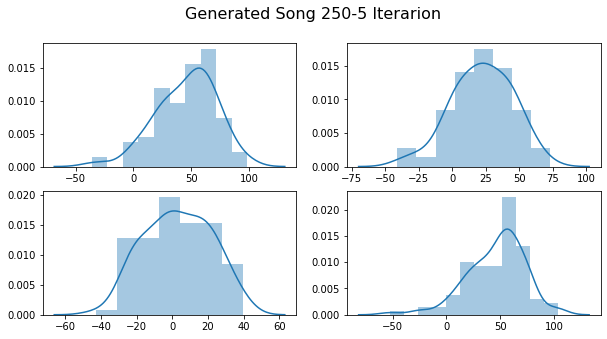

In [0]:
gen_song_250_5_deep_discr_std = crnngan_deep_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_discr_std[:,3], ax=axs[1, 1])

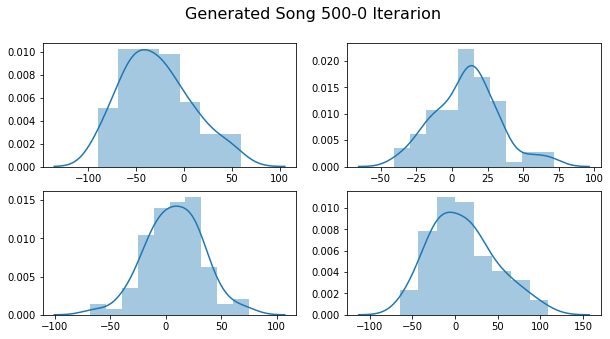

In [0]:
gen_song_500_deep_discr_std = crnngan_deep_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_discr_std[:,3], ax=axs[1, 1])

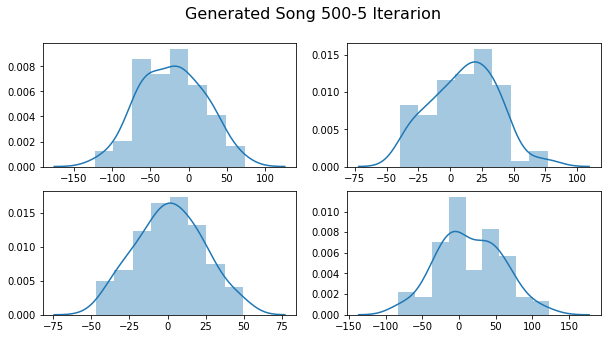

In [0]:
gen_song_500_5_deep_discr_std = crnngan_deep_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_discr_std[:,3], ax=axs[1, 1])

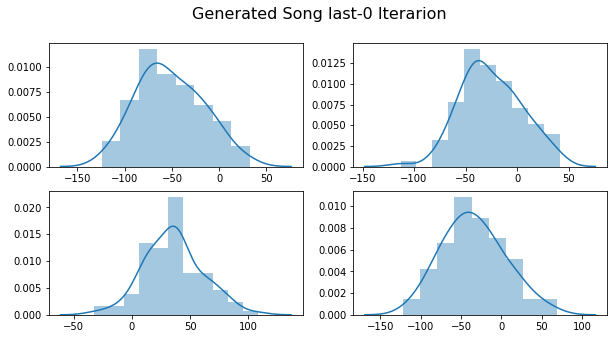

In [0]:
gen_song_last_deep_discr_std = crnngan_deep_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_discr_std[:,3], ax=axs[1, 1])

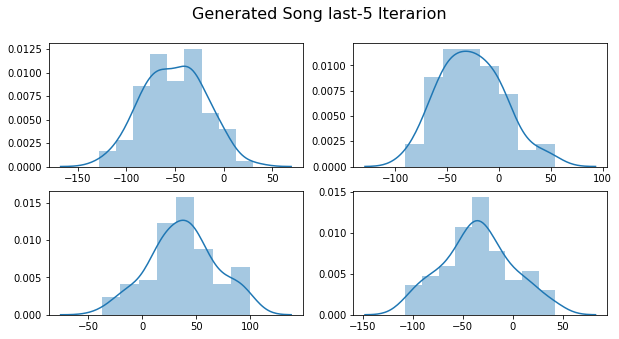

In [0]:
gen_song_last_5_deep_discr_std = crnngan_deep_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_discr_std[:,3], ax=axs[1, 1])

Maybe we could take a look at generated songs around iteration 250.

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]


crnngan_deep_discr_curriculum_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length)

cuda


In [0]:
crnngan_deep_discr_curriculum_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9738	Loss_G: 2.0739	D(x): -2.9843	D(G(z)): -2.9843 / -0.2374
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 3.7289	Loss_G: 1.9405	D(x): -0.5027	D(G(z)): -0.5027 / -0.5550
 Time since epoch started: 0.45
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 3.4137	Loss_G: 1.4247	D(x): -0.7689	D(G(z)): -0.7689 / -0.4429
 Time since epoch started: 0.85
There are a total of 10 fake songs saved already
Epoch time: 1.06
[1/80][30]	Loss_D: 3.1354	Loss_G: 1.1749	D(x): -0.6721	D(G(z)): -0.6721 / -0.6106
 Time since epoch started: 0.20
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 2.8299	Loss_G: 1.6307	D(x): -0.5505	D(G(z)): -0.5505 / -0.6938
 Time since epoch started: 0.60
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 2.6471	Loss_G: 1.6506	D(x): -0.6901	D(G(z)): -0.6901 / -0.6516
 Time since epoch started: 1.01
There are a total of 25 fake

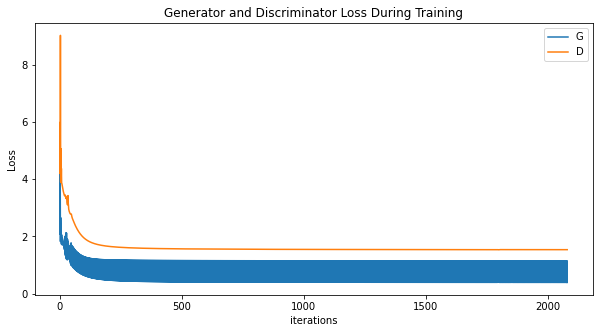

In [0]:
crnngan_deep_discr_curriculum_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


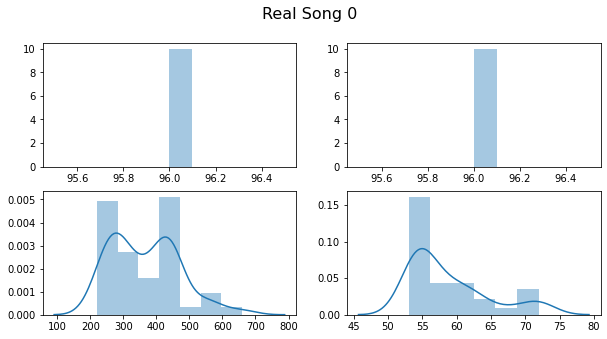

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

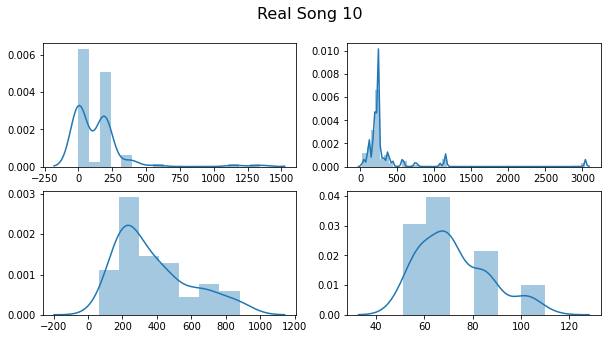

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

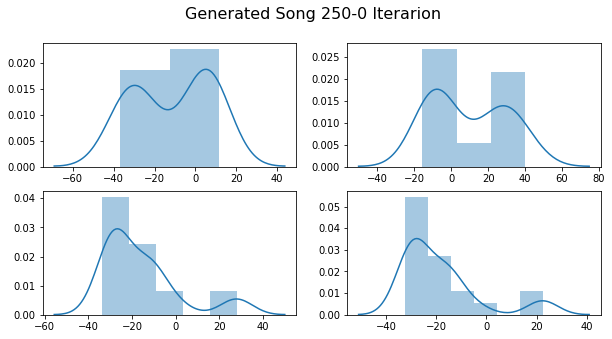

In [0]:
gen_song_250_deep_disc_curriculum_std = crnngan_deep_discr_curriculum_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_disc_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_disc_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_disc_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_disc_curriculum_std[:,3], ax=axs[1, 1])

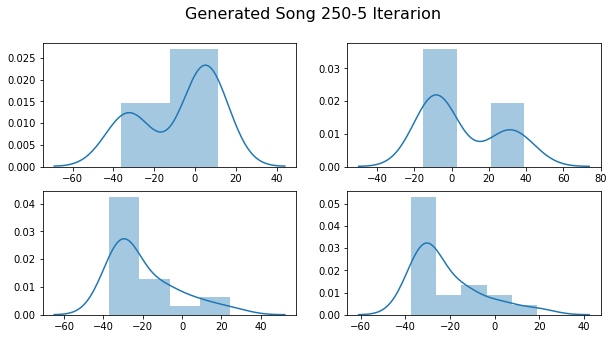

In [0]:
gen_song_250_5_deep_discr_curriculum_std = crnngan_deep_discr_curriculum_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_discr_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_discr_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_discr_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_discr_curriculum_std[:,3], ax=axs[1, 1])

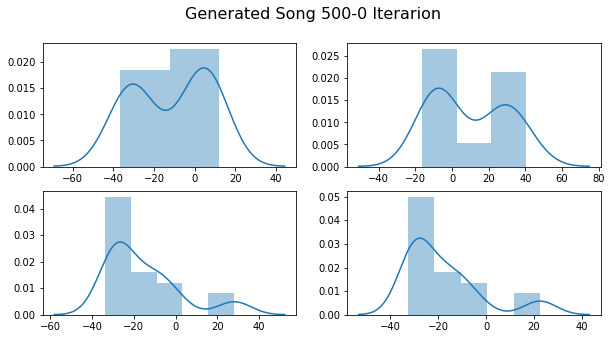

In [0]:
gen_song_500_deep_discr_curriculum_std = crnngan_deep_discr_curriculum_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_discr_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_discr_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_discr_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_discr_curriculum_std[:,3], ax=axs[1, 1])

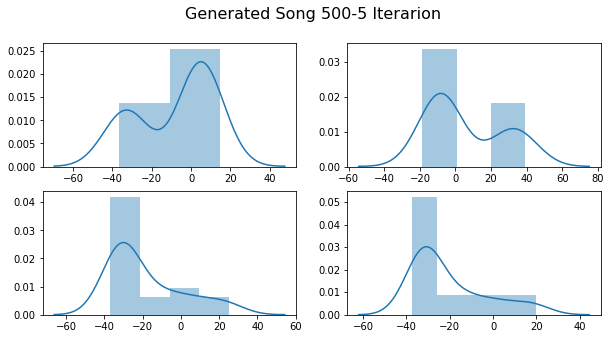

In [0]:
gen_song_500_5_deep_discr_curriculum_std = crnngan_deep_discr_curriculum_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_discr_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_discr_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_discr_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_discr_curriculum_std[:,3], ax=axs[1, 1])

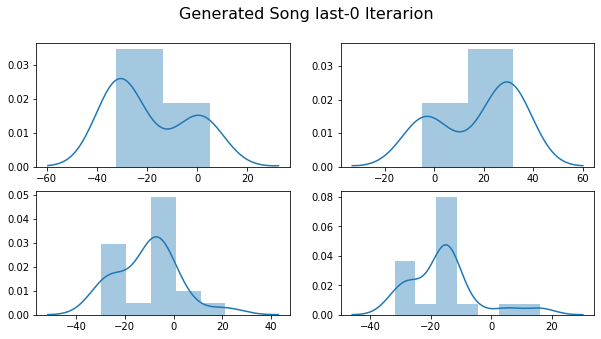

In [0]:
gen_song_last_deep_discr_curriculum_std = crnngan_deep_discr_curriculum_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_discr_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_discr_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_discr_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_discr_curriculum_std[:,3], ax=axs[1, 1])

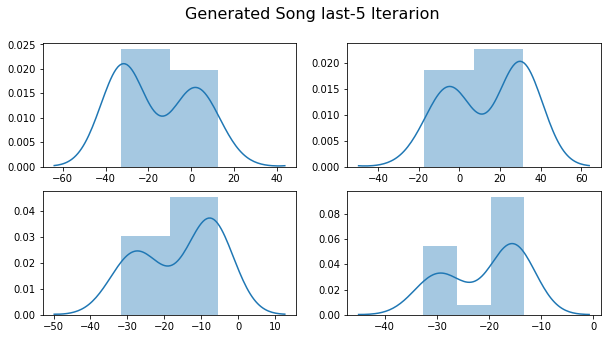

In [0]:
gen_song_last_5_deep_discr_curriculum_std = crnngan_deep_discr_curriculum_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_discr_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_discr_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_discr_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_discr_curriculum_std[:,3], ax=axs[1, 1])

These distributions look a bit weird, either way, we could save them and take a listen given the fact that convergence is good.

In [0]:
gen_song_250_deep_discr_curriculum_unstd = crnngan.unstandardize(gen_song_250_deep_disc_curriculum_std, means, stds)
gen_song_250_5_deep_discr_curriculum_unstd = crnngan.unstandardize(gen_song_250_5_deep_discr_curriculum_std, means, stds)

gen_song_500_deep_discr_curriculum_unstd = crnngan.unstandardize(gen_song_500_deep_discr_curriculum_std, means, stds)
gen_song_500_5_deep_discr_curriculum_unstd = crnngan.unstandardize(gen_song_500_5_deep_discr_curriculum_std, means, stds)

gen_song_last_deep_discr_curriculum_unstd = crnngan.unstandardize(gen_song_last_deep_discr_curriculum_std, means, stds)
gen_song_last_5_deep_discr_curriculum_unstd = crnngan.unstandardize(gen_song_last_5_deep_discr_curriculum_std, means, stds)


In [0]:
save_path = './drive/My Drive/TFM/gen_songs_deep_discr_curriculum_std'
musicDataLoader.save_data(save_path+'/gen_song_250_deep_discr_curriculum_unstd.midi', gen_song_250_deep_discr_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_250_5_deep_discr_curriculum_unstd.midi', gen_song_250_5_deep_discr_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_deep_discr_curriculum_unstd.midi', gen_song_500_deep_discr_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_5_deep_discr_curriculum_unstd.midi', gen_song_500_5_deep_discr_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_deep_discr_curriculum_unstd.midi', gen_song_last_deep_discr_curriculum_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_5_deep_discr_curriculum_unstd.midi', gen_song_last_5_deep_discr_curriculum_unstd)


midi.Pattern(format=1, resolution=384, tracks=\
[midi.Track(\
  [midi.SetTempoEvent(tick=0, data=[20, 88, 85]),
   midi.EndOfTrackEvent(tick=384, data=[])])])

Just by looking at the trace we can see that the songs generated as not very good, probably due to the fact that the values obtained in the standardized songs are too negative translating into negative values in the unstandardized songs which is not an option...

### Simple architecture (3 layers deep both)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]


crnngan_deep_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values)

cuda


In [0]:
crnngan_deep_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2122	Loss_G: 2.9051	D(x): -4.5991	D(G(z)): -4.5998 / -0.1899
 Time since epoch started: 0.20
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 0.4318	Loss_G: 3.5796	D(x): -0.1430	D(G(z)): -0.0863 / -0.0848
 Time since epoch started: 2.00
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0791	Loss_G: 4.6633	D(x): -0.0257	D(G(z)): -0.0359 / -0.0383
 Time since epoch started: 3.80
There are a total of 10 fake songs saved already
Epoch time: 4.69
[1/50][30]	Loss_D: 0.0377	Loss_G: 5.8976	D(x): -0.0136	D(G(z)): -0.0146 / -0.0117
 Time since epoch started: 0.90
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0432	Loss_G: 6.6525	D(x): -0.0391	D(G(z)): -0.0042 / -0.0043
 Time since epoch started: 2.69
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0127	Loss_G: 6.1503	D(x): -0.0086	D(G(z)): -0.0041 / -0.0041
 Time since epoch started: 4.49
There are a total of 25 fake

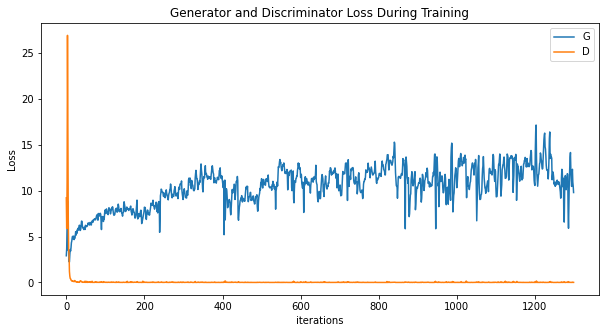

In [0]:
crnngan_deep_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


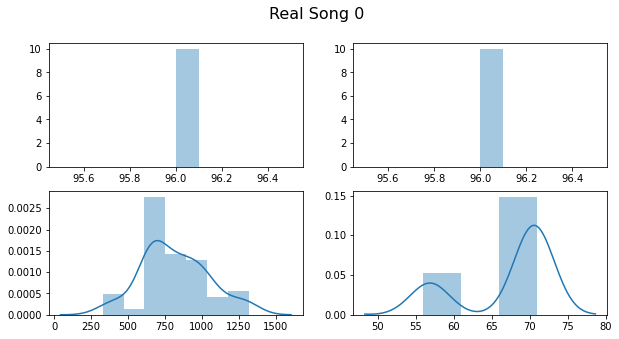

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

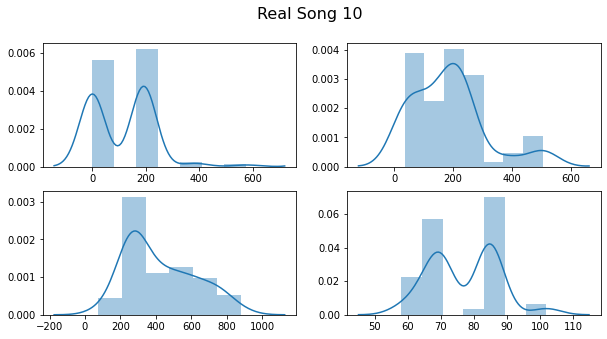

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

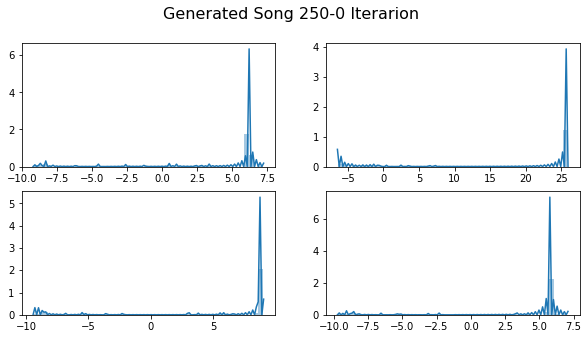

In [0]:
gen_song_250_deep_std = crnngan_deep_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_std[:,3], ax=axs[1, 1])

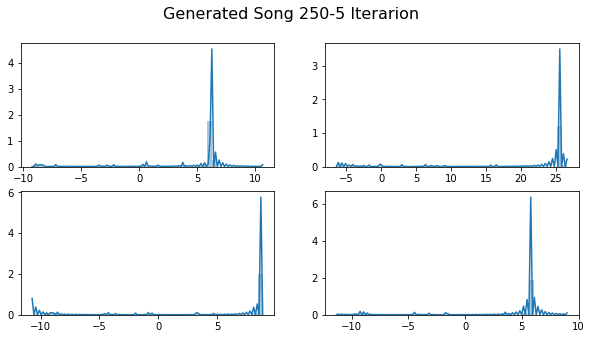

In [0]:
gen_song_250_5_deep_std = crnngan_deep_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_std[:,3], ax=axs[1, 1])

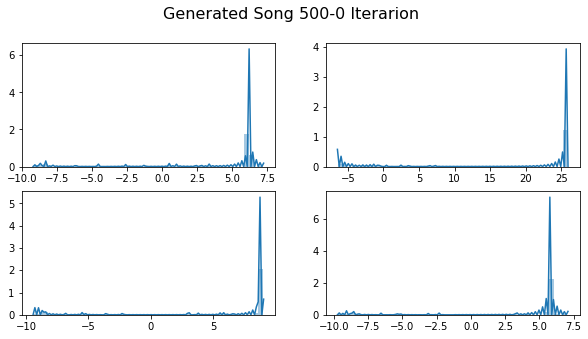

In [0]:
gen_song_500_deep_std = crnngan_deep_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_std[:,3], ax=axs[1, 1])

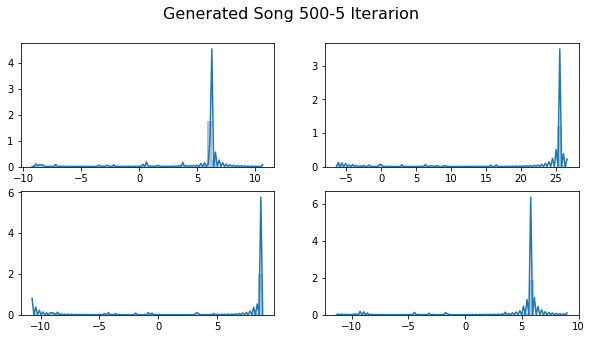

In [0]:
gen_song_500_5_deep_std = crnngan_deep_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_std[:,3], ax=axs[1, 1])

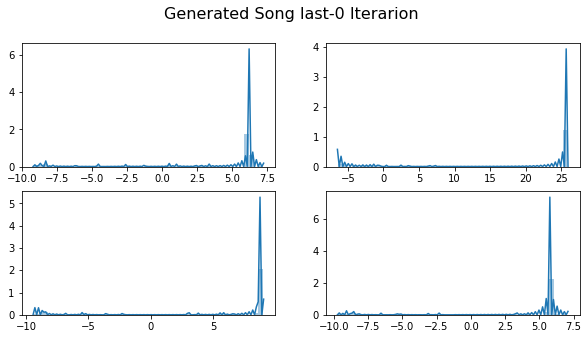

In [0]:
gen_song_last_deep_std = crnngan_deep_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_std[:,3], ax=axs[1, 1])

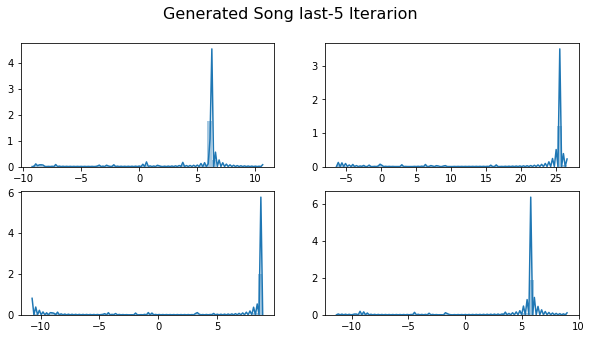

In [0]:
gen_song_last_5_deep_std = crnngan_deep_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_std[:,3], ax=axs[1, 1])

Bad convergence and bad looking distributions

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]


crnngan_deep_curriculum_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length)

cuda


In [0]:
crnngan_deep_curriculum_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9851	Loss_G: 2.5768	D(x): -2.9860	D(G(z)): -2.9863 / -0.0861
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 2.0487	Loss_G: 8.1118	D(x): -0.6448	D(G(z)): -0.3478 / -0.0472
 Time since epoch started: 0.51
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 1.8086	Loss_G: 8.3895	D(x): -0.7644	D(G(z)): -0.0475 / -0.0504
 Time since epoch started: 0.96
There are a total of 10 fake songs saved already
Epoch time: 1.18
[1/80][30]	Loss_D: 0.8543	Loss_G: 8.4152	D(x): -0.4750	D(G(z)): -0.1538 / -0.0534
 Time since epoch started: 0.22
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.5324	Loss_G: 6.3205	D(x): -0.0432	D(G(z)): -0.0055 / -0.0139
 Time since epoch started: 0.68
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.1752	Loss_G: 8.0977	D(x): -0.0972	D(G(z)): -0.0040 / -0.0096
 Time since epoch started: 1.12
There are a total of 25 fake

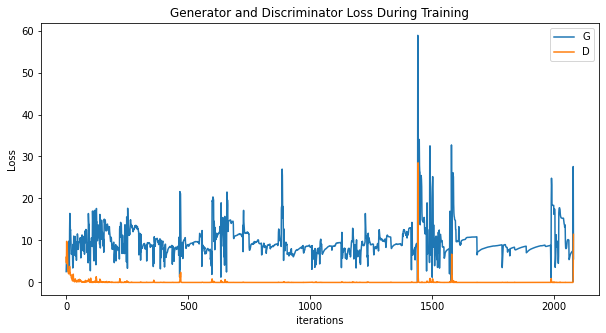

In [0]:
crnngan_deep_curriculum_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


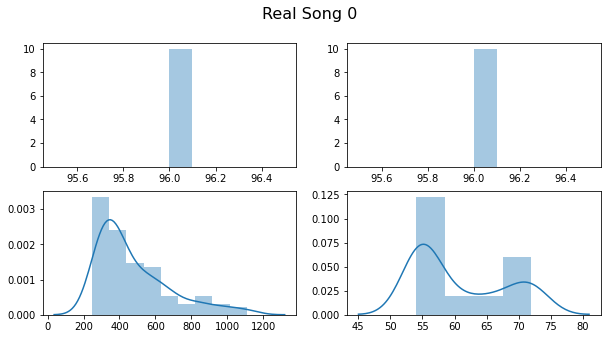

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

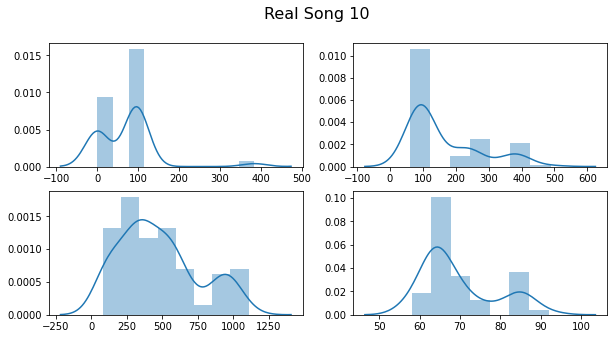

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

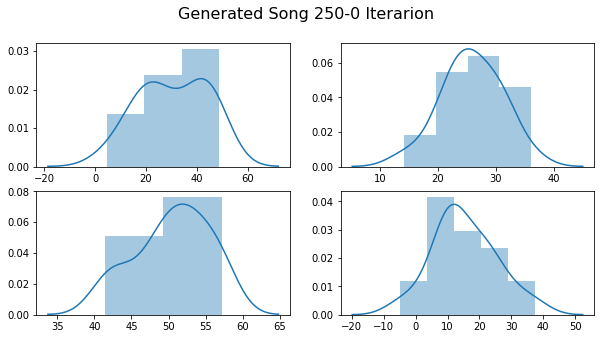

In [0]:
gen_song_250_deep_curriculum_std = crnngan_deep_curriculum_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_curriculum_std[:,3], ax=axs[1, 1])

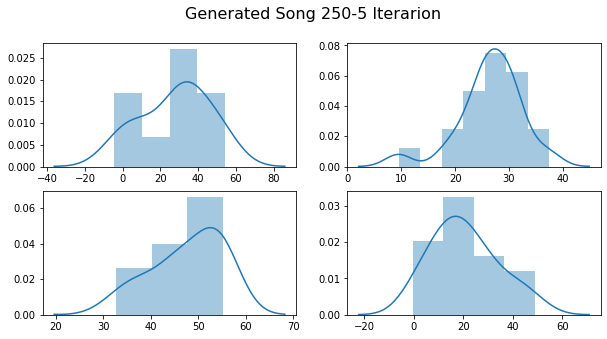

In [0]:
gen_song_250_5_deep_curriculum_std = crnngan_deep_curriculum_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_curriculum_std[:,3], ax=axs[1, 1])

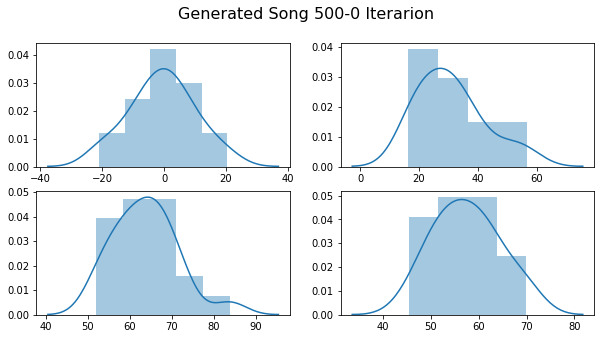

In [0]:
gen_song_500_deep_curriculum_std = crnngan_deep_curriculum_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_curriculum_std[:,3], ax=axs[1, 1])

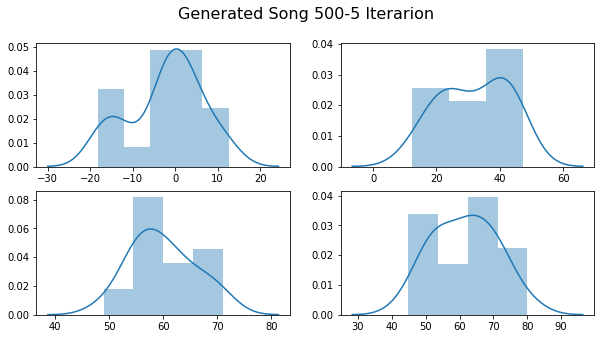

In [0]:
gen_song_500_5_deep_curriculum_std = crnngan_deep_curriculum_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_curriculum_std[:,3], ax=axs[1, 1])

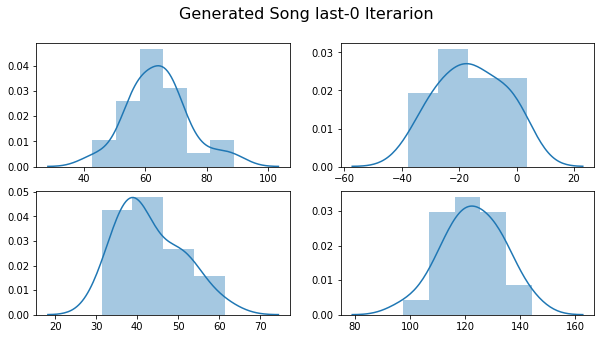

In [0]:
gen_song_last_deep_curriculum_std = crnngan_deep_curriculum_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_curriculum_std[:,3], ax=axs[1, 1])

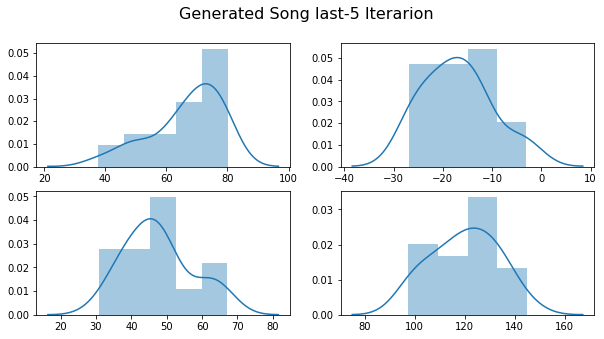

In [0]:
gen_song_last_5_deep_curriculum_std = crnngan_deep_curriculum_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_curriculum_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_curriculum_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_curriculum_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_curriculum_std[:,3], ax=axs[1, 1])

Horrible convergence and distributions.

### Complex Discriminator (2 layers deep both)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True


crnngan_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_complex_discr_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2139	Loss_G: 24.7456	D(x): -4.6031	D(G(z)): -4.6050 / 0.0000
 Time since epoch started: 0.15
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 2.0514	Loss_G: 112.7496	D(x): -0.0378	D(G(z)): -0.0965 / -0.0318
 Time since epoch started: 1.55
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0777	Loss_G: 140.0840	D(x): -0.0025	D(G(z)): -0.0032 / -0.0089
 Time since epoch started: 2.94
There are a total of 10 fake songs saved already
Epoch time: 3.64
[1/50][30]	Loss_D: 0.0361	Loss_G: 136.5815	D(x): -0.0072	D(G(z)): -0.0055 / -0.0019
 Time since epoch started: 0.69
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0638	Loss_G: 121.4402	D(x): -0.0008	D(G(z)): -0.0092 / -0.0073
 Time since epoch started: 2.08
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0059	Loss_G: 115.7150	D(x): -0.0014	D(G(z)): -0.0045 / -0.0006
 Time since epoch started: 3.47
There are a total 

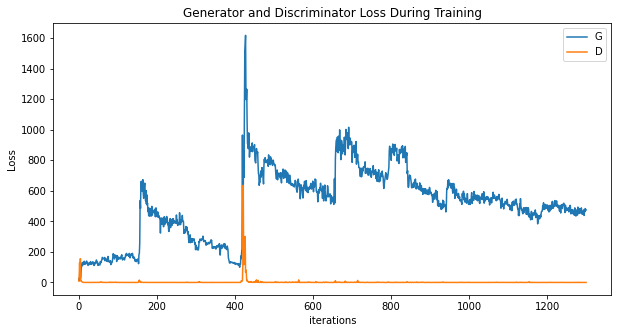

In [0]:
crnngan_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


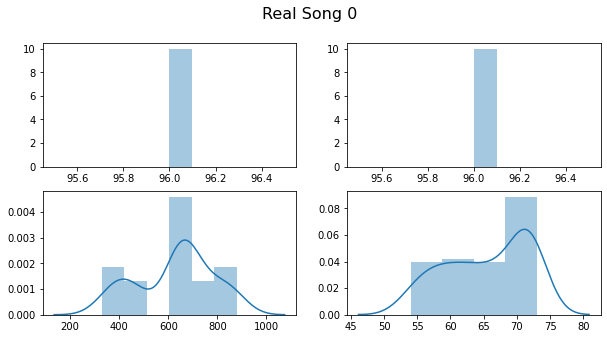

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

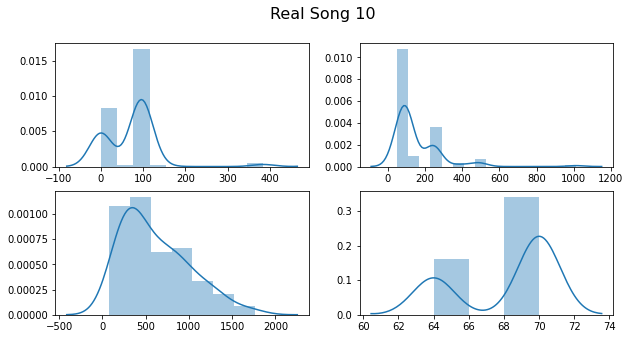

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

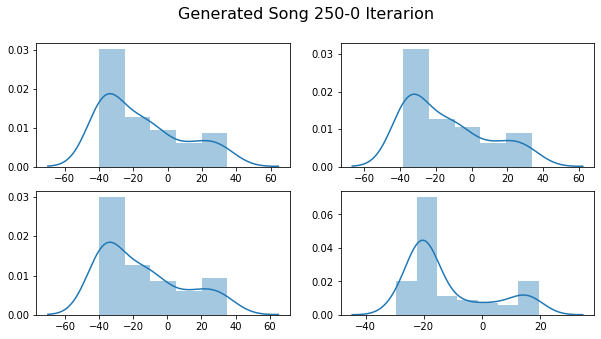

In [0]:
gen_song_250_complex_discr_std = crnngan_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_complex_discr_std[:,3], ax=axs[1, 1])

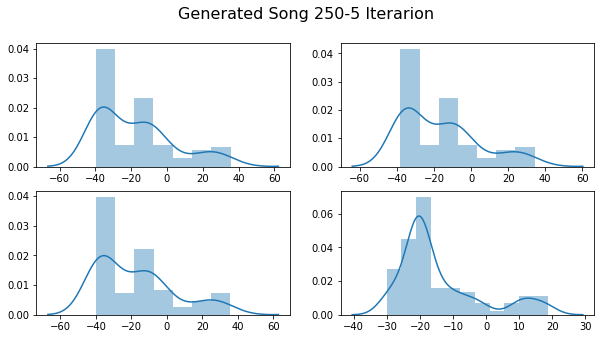

In [0]:
gen_song_250_5_complex_discr_std = crnngan_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_complex_discr_std[:,3], ax=axs[1, 1])

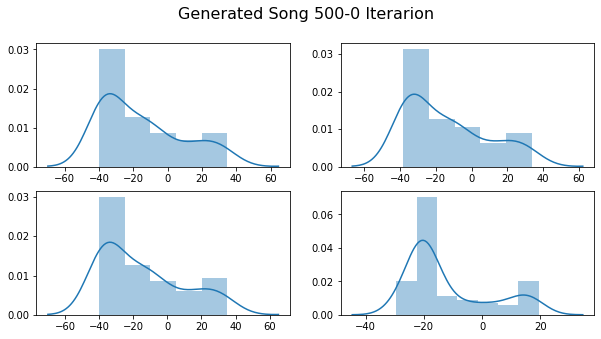

In [0]:
gen_song_500_complex_discr_std = crnngan_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_complex_discr_std[:,3], ax=axs[1, 1])

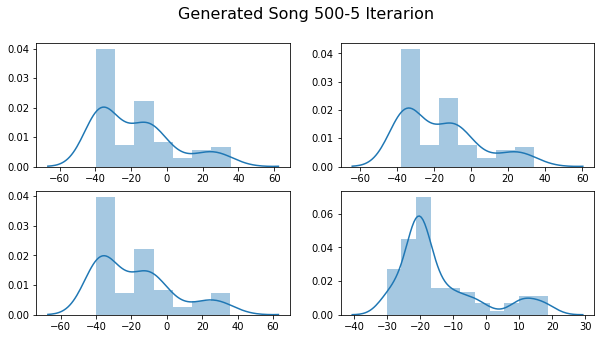

In [0]:
gen_song_500_5_complex_discr_std = crnngan_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_complex_discr_std[:,3], ax=axs[1, 1])

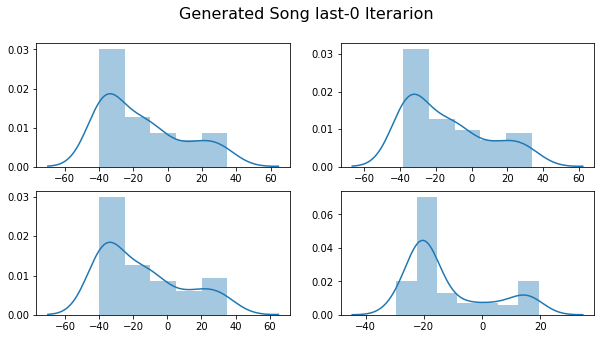

In [0]:
gen_song_last_complex_discr_std = crnngan_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_complex_discr_std[:,3], ax=axs[1, 1])

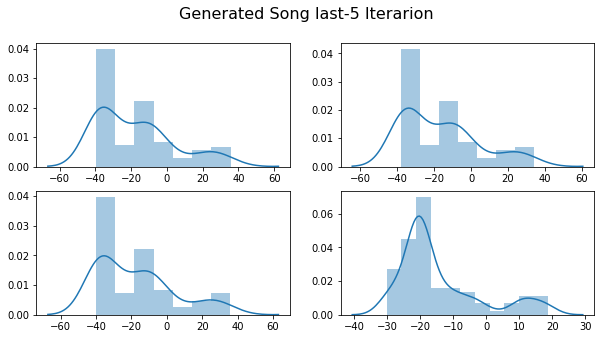

In [0]:
gen_song_last_5_complex_discr_std = crnngan_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_complex_discr_std[:,3], ax=axs[1, 1])

Bad convergence and distributions

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True

crnngan_curriculum_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_curriculum_complex_discr_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9908	Loss_G: 21.8891	D(x): -2.9933	D(G(z)): -2.9936 / 0.0000
 Time since epoch started: 0.04
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 1.5787	Loss_G: 5.1074	D(x): -0.1464	D(G(z)): -0.9633 / -0.8439
 Time since epoch started: 0.40
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.3920	Loss_G: 4.8452	D(x): -0.1648	D(G(z)): -0.0868 / -0.0647
 Time since epoch started: 0.75
There are a total of 10 fake songs saved already
Epoch time: 0.92
[1/80][30]	Loss_D: 1.9357	Loss_G: 2.0353	D(x): -0.1068	D(G(z)): -0.0996 / -0.2247
 Time since epoch started: 0.17
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 1.2417	Loss_G: 0.9799	D(x): -0.4653	D(G(z)): -0.3950 / -0.3519
 Time since epoch started: 0.52
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 1.3237	Loss_G: 0.7827	D(x): -0.5602	D(G(z)): -0.5882 / -0.5867
 Time since epoch started: 0.86
There are a total of 25 fake

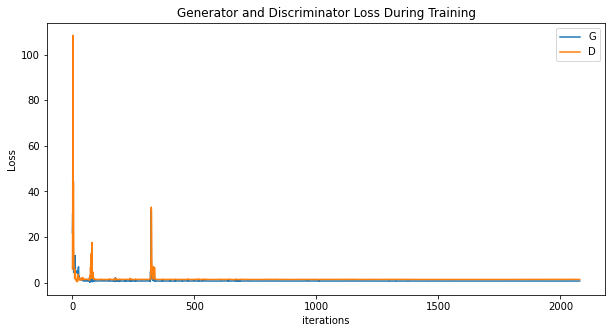

In [0]:
crnngan_curriculum_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


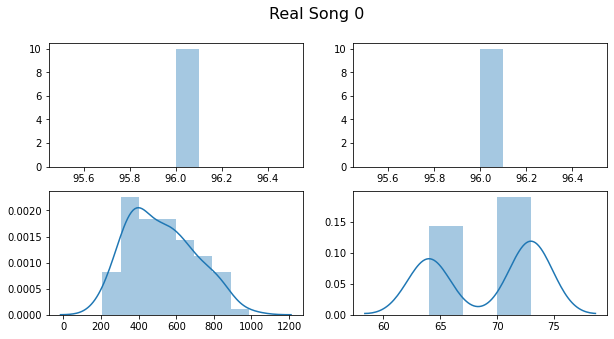

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

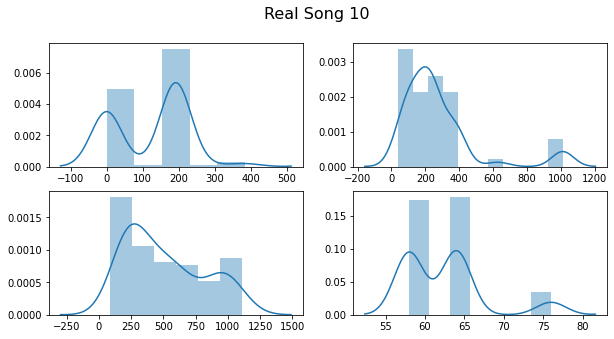

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

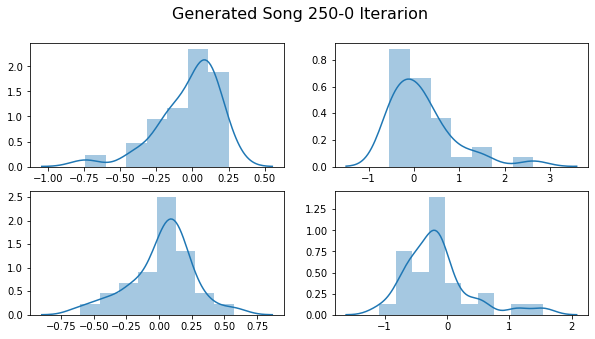

In [0]:
gen_song_250_curriculum_complex_discr_std = crnngan_curriculum_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

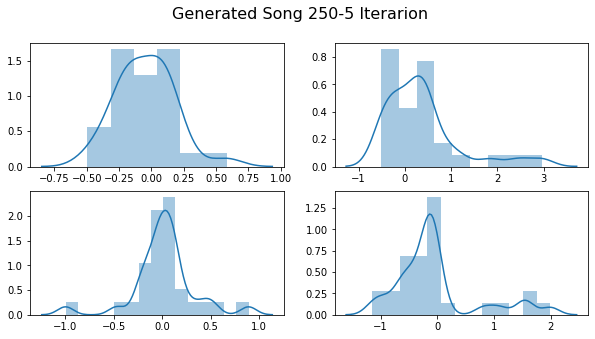

In [0]:
gen_song_250_5_curriculum_complex_discr_std = crnngan_curriculum_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

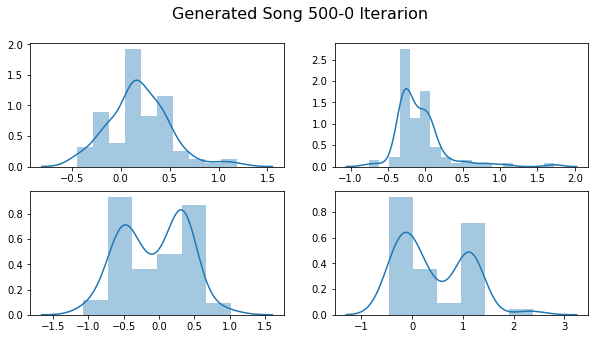

In [0]:
gen_song_500_curriculum_complex_discr_std = crnngan_curriculum_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

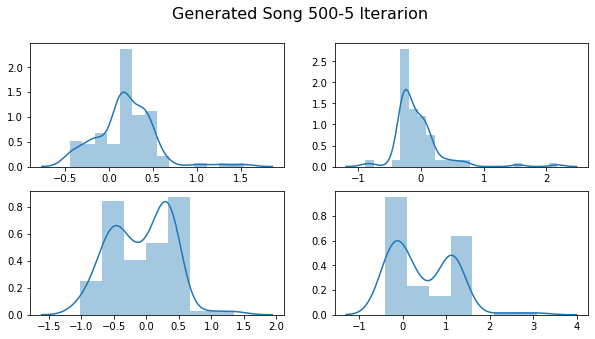

In [0]:
gen_song_500_5_curriculum_complex_discr_std = crnngan_curriculum_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

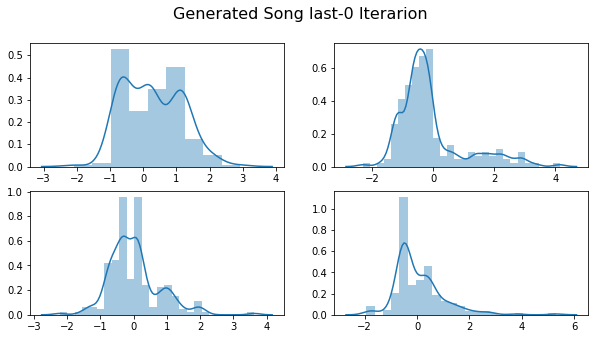

In [0]:
gen_song_last_curriculum_complex_discr_std = crnngan_curriculum_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

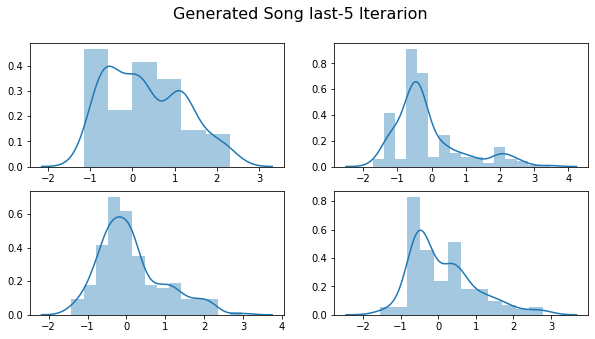

In [0]:
gen_song_last_5_curriculum_complex_discr_std = crnngan_curriculum_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

These ones don't look bad, we should probably save them.

In [0]:
gen_song_250_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_250_curriculum_complex_discr_std, means, stds)
gen_song_250_5_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_250_5_curriculum_complex_discr_std, means, stds)

gen_song_500_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_500_curriculum_complex_discr_std, means, stds)
gen_song_500_5_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_500_5_curriculum_complex_discr_std, means, stds)

gen_song_last_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_last_curriculum_complex_discr_std, means, stds)
gen_song_last_5_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_last_5_curriculum_complex_discr_std, means, stds)


In [0]:
save_path = './drive/My Drive/TFM/gen_songs_complex_discr_curriculum_std'
musicDataLoader.save_data(save_path+'/gen_song_250_curriculum_complex_discr_unstd.midi', gen_song_250_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_250_5_curriculum_complex_discr_unstd.midi', gen_song_250_5_curriculum_complex_discr_unstd)

musicDataLoader.save_data(save_path+'/gen_song_500_curriculum_complex_discr_unstd.midi', gen_song_500_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_5_curriculum_complex_discr_unstd.midi', gen_song_500_5_curriculum_complex_discr_unstd)

musicDataLoader.save_data(save_path+'/gen_song_last_curriculum_complex_discr_unstd.midi', gen_song_last_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_5_curriculum_complex_discr_unstd.midi', gen_song_last_5_curriculum_complex_discr_unstd)


midi.Pattern(format=1, resolution=384, tracks=\
[midi.Track(\
  [midi.SetTempoEvent(tick=0, data=[20, 88, 85]),
   midi.NoteOnEvent(tick=92, channel=0, data=[63, 69]),
   midi.NoteOnEvent(tick=110, channel=0, data=[61, 61]),
   midi.NoteOffEvent(tick=76, channel=0, data=[63, 0]),
   midi.NoteOffEvent(tick=27, channel=0, data=[61, 0]),
   midi.NoteOnEvent(tick=245, channel=0, data=[83, 114]),
   midi.NoteOnEvent(tick=179, channel=0, data=[72, 72]),
   midi.NoteOffEvent(tick=154, channel=0, data=[72, 0]),
   midi.NoteOnEvent(tick=45, channel=0, data=[67, 66]),
   midi.NoteOffEvent(tick=5, channel=0, data=[67, 0]),
   midi.NoteOnEvent(tick=295, channel=0, data=[66, 96]),
   midi.NoteOffEvent(tick=199, channel=0, data=[83, 0]),
   midi.NoteOnEvent(tick=179, channel=0, data=[83, 119]),
   midi.NoteOnEvent(tick=105, channel=0, data=[64, 71]),
   midi.NoteOffEvent(tick=167, channel=0, data=[64, 0]),
   midi.NoteOnEvent(tick=46, channel=0, data=[68, 66]),
   midi.NoteOnEvent(tick=16, channel=0

### Complex Discriminator (3 layers deep generator)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True


crnngan_deep_gen_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_deep_gen_complex_discr_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2087	Loss_G: 27.8994	D(x): -4.6028	D(G(z)): -4.6042 / 0.0000
 Time since epoch started: 0.18
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 4.5517	Loss_G: 8.4726	D(x): -1.7168	D(G(z)): -1.8272 / -1.9159
 Time since epoch started: 1.76
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 4.2230	Loss_G: 9.4146	D(x): -0.2589	D(G(z)): -0.3414 / -0.0863
 Time since epoch started: 3.34
There are a total of 10 fake songs saved already
Epoch time: 4.14
[1/50][30]	Loss_D: 5.7534	Loss_G: 5.3639	D(x): -1.9277	D(G(z)): -1.8713 / -0.0002
 Time since epoch started: 0.78
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.2043	Loss_G: 7.8484	D(x): -0.0367	D(G(z)): -0.0007 / -0.0263
 Time since epoch started: 2.35
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.7818	Loss_G: 6.8300	D(x): -0.1343	D(G(z)): -0.1430 / -0.1343
 Time since epoch started: 3.93
There are a total of 25 fake

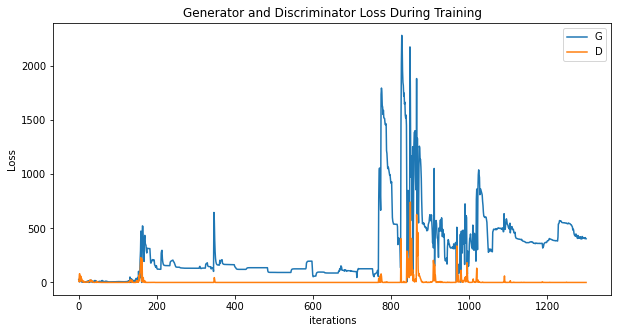

In [0]:
crnngan_deep_gen_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


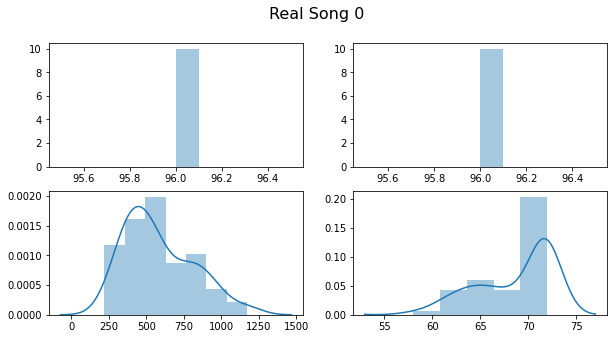

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

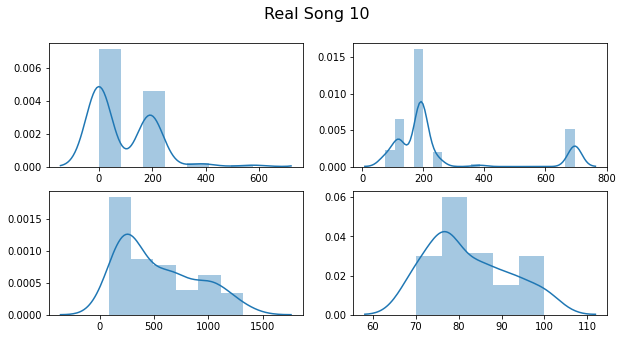

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

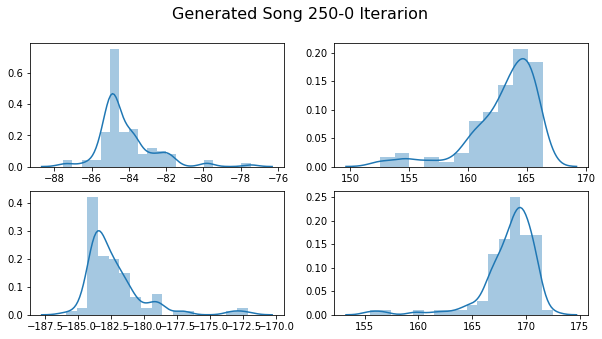

In [0]:
gen_song_250_deep_gen_complex_discr_std = crnngan_deep_gen_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_gen_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_gen_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_gen_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_gen_complex_discr_std[:,3], ax=axs[1, 1])

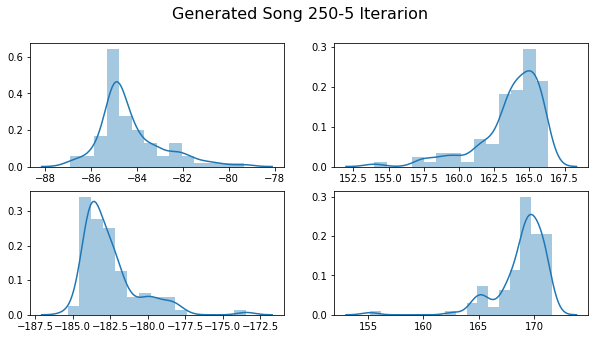

In [0]:
gen_song_250_5_deep_gen_complex_discr_std = crnngan_deep_gen_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_gen_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_gen_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_gen_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_gen_complex_discr_std[:,3], ax=axs[1, 1])

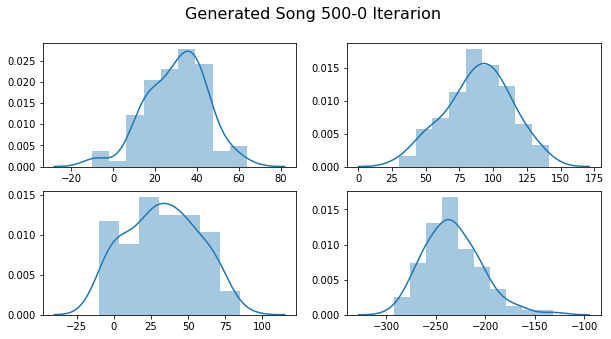

In [0]:
gen_song_500_deep_gen_complex_discr_std = crnngan_deep_gen_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_gen_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_gen_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_gen_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_gen_complex_discr_std[:,3], ax=axs[1, 1])

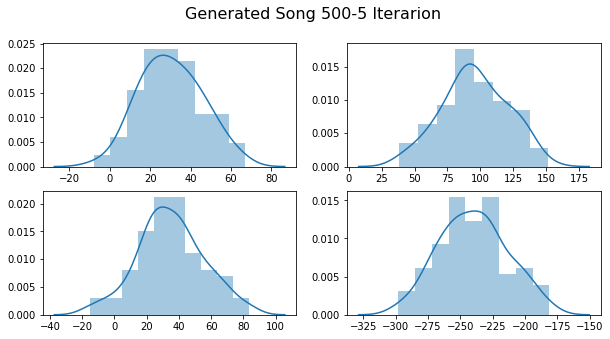

In [0]:
gen_song_500_5_deep_gen_complex_discr_std = crnngan_deep_gen_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_gen_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_gen_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_gen_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_gen_complex_discr_std[:,3], ax=axs[1, 1])

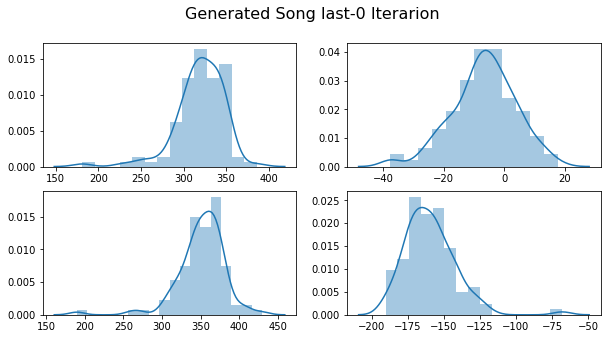

In [0]:
gen_song_last_deep_gen_complex_discr_std = crnngan_deep_gen_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_gen_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_gen_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_gen_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_gen_complex_discr_std[:,3], ax=axs[1, 1])

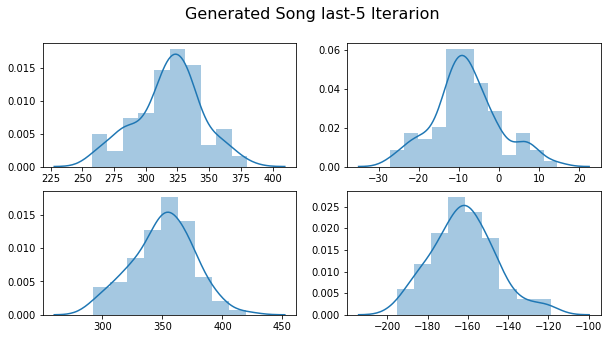

In [0]:
gen_song_last_5_deep_gen_complex_discr_std = crnngan_deep_gen_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_gen_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_gen_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_gen_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_gen_complex_discr_std[:,3], ax=axs[1, 1])

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True

crnngan_deep_gen_curriculum_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_deep_gen_curriculum_complex_discr_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9918	Loss_G: 19.6591	D(x): -2.9932	D(G(z)): -2.9942 / 0.0000
 Time since epoch started: 0.04
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 6.7350	Loss_G: 44.8299	D(x): -0.0690	D(G(z)): -0.2366 / -0.0519
 Time since epoch started: 0.43
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.5241	Loss_G: 8.6676	D(x): -0.0188	D(G(z)): -0.0111 / -0.0210
 Time since epoch started: 0.84
There are a total of 10 fake songs saved already
Epoch time: 1.04
[1/80][30]	Loss_D: 1.8053	Loss_G: 11.7859	D(x): -0.0149	D(G(z)): -0.0591 / -0.5798
 Time since epoch started: 0.19
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 3.2481	Loss_G: 3.2218	D(x): -0.1649	D(G(z)): -0.2813 / -1.3519
 Time since epoch started: 0.58
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 23.3202	Loss_G: 20.9636	D(x): -0.2837	D(G(z)): -0.8160 / -0.2108
 Time since epoch started: 0.96
There are a total of 25 

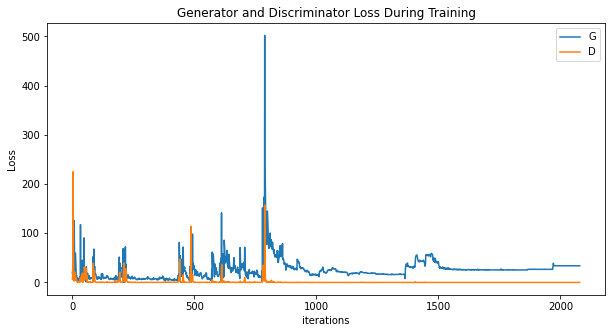

In [0]:
crnngan_deep_gen_curriculum_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


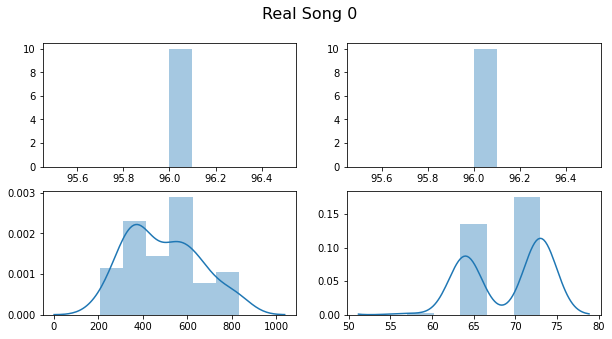

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

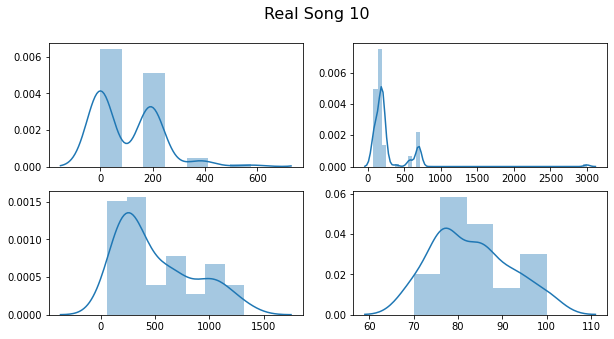

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

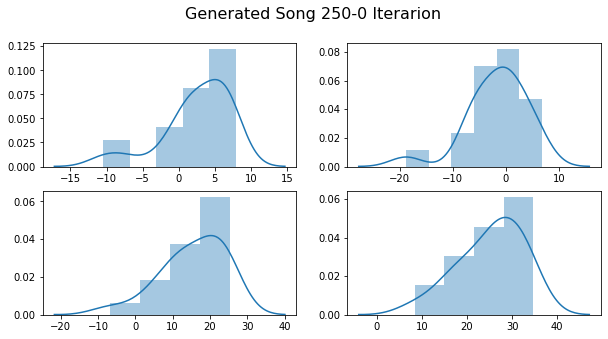

In [0]:
gen_song_250_deep_gen_curriculum_complex_discr_std = crnngan_deep_gen_curriculum_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_gen_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_gen_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_gen_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_gen_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

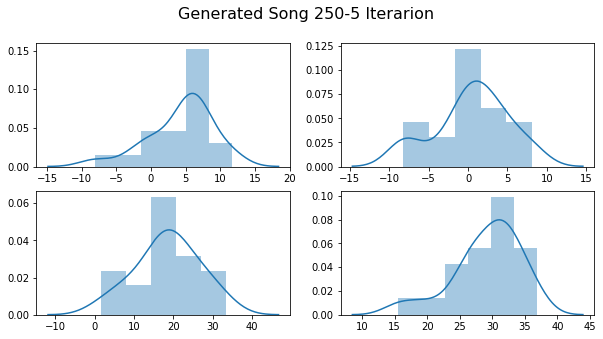

In [0]:
gen_song_250_5_deep_gen_curriculum_complex_discr_std = crnngan_deep_gen_curriculum_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_gen_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_gen_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_gen_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_gen_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

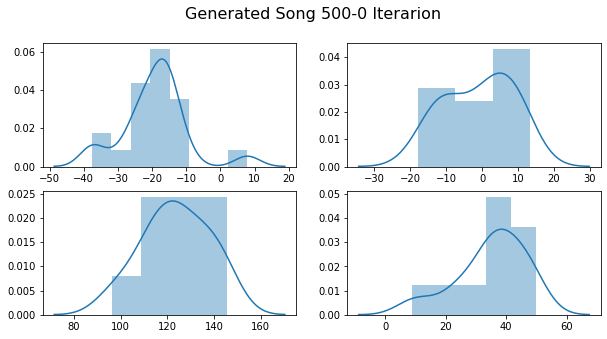

In [0]:
gen_song_500_deep_gen_curriculum_complex_discr_std = crnngan_deep_gen_curriculum_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_gen_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_gen_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_gen_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_gen_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

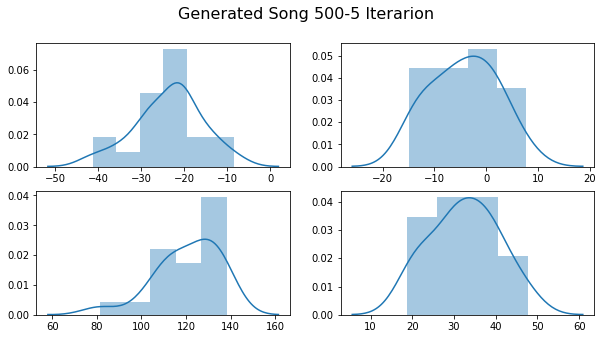

In [0]:
gen_song_500_5_deep_gen_curriculum_complex_discr_std = crnngan_deep_gen_curriculum_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_gen_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_gen_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_gen_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_gen_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

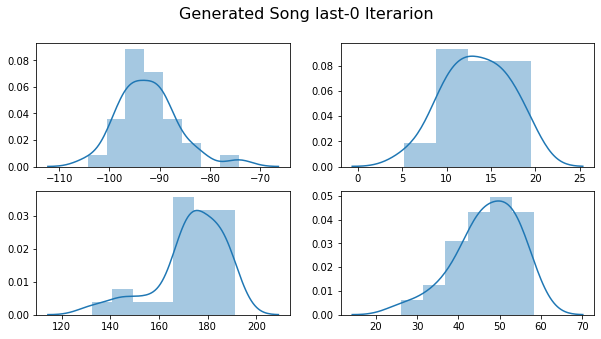

In [0]:
gen_song_last_deep_gen_curriculum_complex_discr_std = crnngan_deep_gen_curriculum_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_gen_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_gen_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_gen_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_gen_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

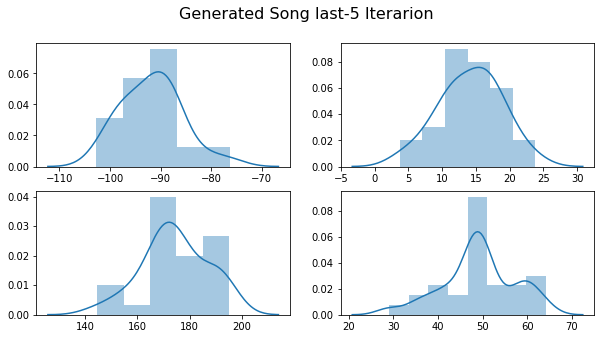

In [0]:
gen_song_last_5_deep_gen_curriculum_complex_discr_std = crnngan_deep_gen_curriculum_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_gen_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_gen_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_gen_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_gen_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

Horrible values



### Complex Discriminator (3 layers deep discriminator)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True


crnngan_deep_discr_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_deep_discr_complex_discr_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2064	Loss_G: 6.6915	D(x): -4.6025	D(G(z)): -4.6026 / -0.0000
 Time since epoch started: 0.20
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 4.6981	Loss_G: 12.1628	D(x): -0.4114	D(G(z)): -0.2780 / -2.3992
 Time since epoch started: 1.89
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.3242	Loss_G: 26.8611	D(x): -0.1277	D(G(z)): -0.0155 / -0.0125
 Time since epoch started: 3.58
There are a total of 10 fake songs saved already
Epoch time: 4.43
[1/50][30]	Loss_D: 0.1232	Loss_G: 22.7183	D(x): -0.0376	D(G(z)): -0.0242 / -0.0078
 Time since epoch started: 0.85
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.7878	Loss_G: 11.5002	D(x): -0.0854	D(G(z)): -0.1019 / -0.0207
 Time since epoch started: 2.53
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.3889	Loss_G: 10.2510	D(x): -0.0380	D(G(z)): -0.0395 / -0.0325
 Time since epoch started: 4.21
There are a total of 25

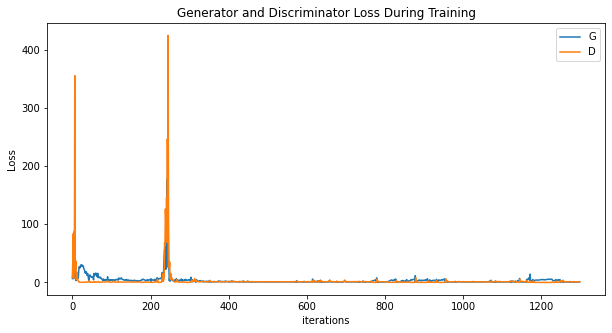

In [0]:
crnngan_deep_discr_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


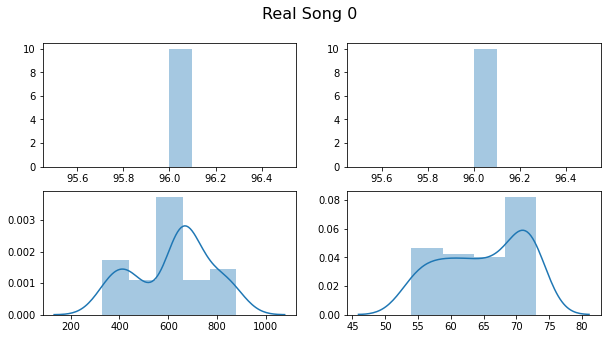

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

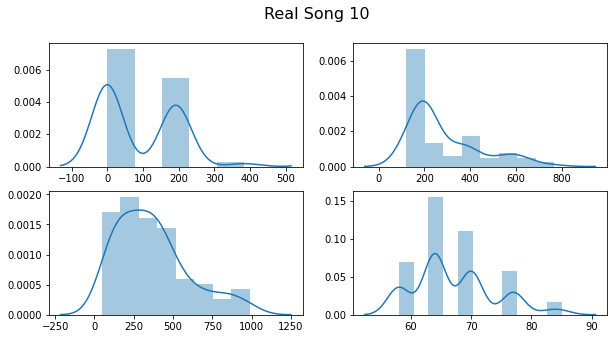

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

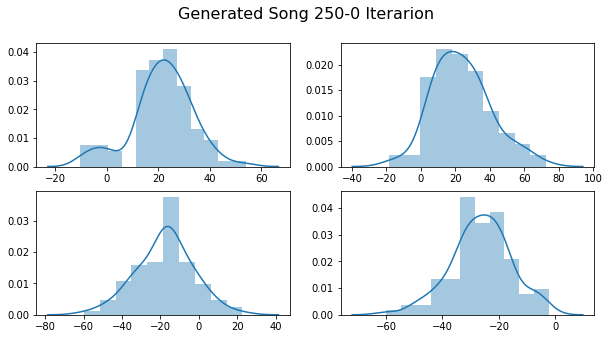

In [0]:
gen_song_250_deep_discr_complex_discr_std = crnngan_deep_discr_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_discr_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_discr_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_discr_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_discr_complex_discr_std[:,3], ax=axs[1, 1])

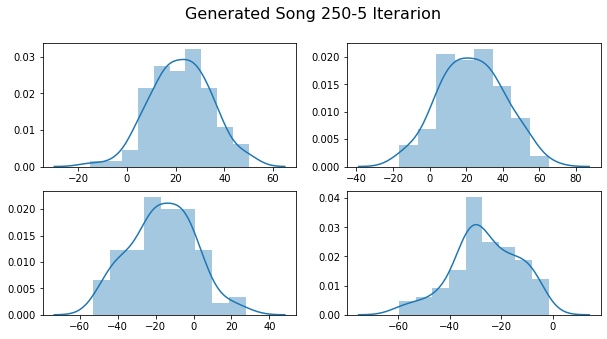

In [0]:
gen_song_250_5_deep_discr_complex_discr_std = crnngan_deep_discr_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_discr_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_discr_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_discr_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_discr_complex_discr_std[:,3], ax=axs[1, 1])

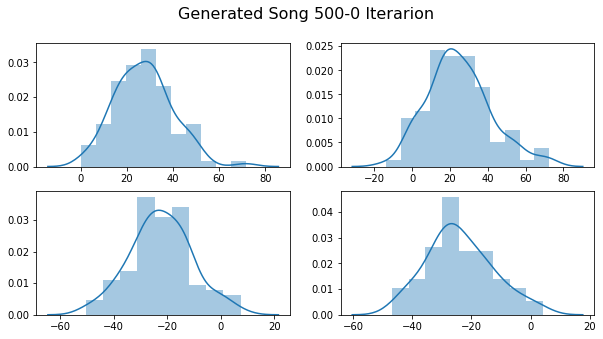

In [0]:
gen_song_500_deep_discr_complex_discr_std = crnngan_deep_discr_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_discr_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_discr_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_discr_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_discr_complex_discr_std[:,3], ax=axs[1, 1])

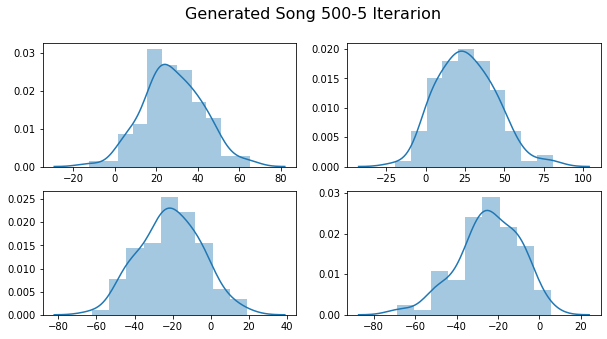

In [0]:
gen_song_500_5_deep_discr_complex_discr_std = crnngan_deep_discr_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_discr_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_discr_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_discr_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_discr_complex_discr_std[:,3], ax=axs[1, 1])

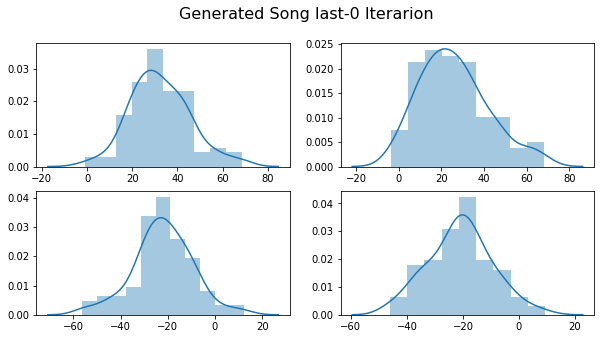

In [0]:
gen_song_last_deep_discr_complex_discr_std = crnngan_deep_discr_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_discr_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_discr_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_discr_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_discr_complex_discr_std[:,3], ax=axs[1, 1])

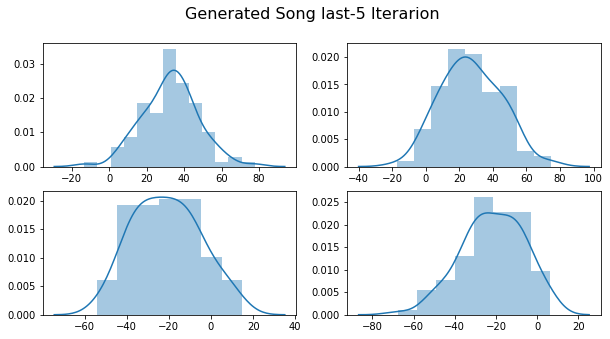

In [0]:
gen_song_last_5_deep_discr_complex_discr_std = crnngan_deep_discr_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_discr_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_discr_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_discr_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_discr_complex_discr_std[:,3], ax=axs[1, 1])

These ones might be good as the convergence doesn't look too bad.

In [0]:
gen_song_250_deep_discr_complex_discr_unstd = crnngan.unstandardize(gen_song_250_deep_discr_complex_discr_std, means, stds)
gen_song_250_5_deep_discr_complex_discr_unstd = crnngan.unstandardize(gen_song_250_5_deep_discr_complex_discr_std, means, stds)

gen_song_500_deep_discr_complex_discr_unstd = crnngan.unstandardize(gen_song_500_deep_discr_complex_discr_std, means, stds)
gen_song_500_5_deep_discr_complex_discr_unstd = crnngan.unstandardize(gen_song_500_5_deep_discr_complex_discr_std, means, stds)

gen_song_last_deep_discr_complex_discr_unstd = crnngan.unstandardize(gen_song_last_deep_discr_complex_discr_std, means, stds)
gen_song_last_5_deep_discr_complex_discr_unstd = crnngan.unstandardize(gen_song_last_5_deep_discr_complex_discr_std, means, stds)


In [0]:
save_path = './drive/My Drive/TFM/gen_songs_deep_discr_complex_discr_std'
musicDataLoader.save_data(save_path+'/gen_song_250_deep_discr_complex_discr_unstd.midi', gen_song_250_deep_discr_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_250_5_deep_discr_complex_discr_unstd.midi', gen_song_250_5_deep_discr_complex_discr_unstd)

musicDataLoader.save_data(save_path+'/gen_song_500_deep_discr_complex_discr_unstd.midi', gen_song_500_deep_discr_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_5_deep_discr_complex_discr_unstd.midi', gen_song_500_5_deep_discr_complex_discr_unstd)

musicDataLoader.save_data(save_path+'/gen_song_last_deep_discr_complex_discr_unstd.midi', gen_song_last_deep_discr_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_5_deep_discr_complex_discr_unstd.midi', gen_song_last_5_deep_discr_complex_discr_unstd)


midi.Pattern(format=1, resolution=384, tracks=\
[midi.Track(\
  [midi.SetTempoEvent(tick=0, data=[20, 88, 85]),
   midi.NoteOnEvent(tick=177333, channel=0, data=[100, 127]),
   midi.NoteOffEvent(tick=4699, channel=0, data=[100, 0]),
   midi.NoteOnEvent(tick=129326, channel=0, data=[102, 127]),
   midi.NoteOffEvent(tick=13097, channel=0, data=[102, 0]),
   midi.EndOfTrackEvent(tick=384, data=[])])])

As could be suspected by looking at the distributions, these songs don't look right.

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True

crnngan_deep_discr_curriculum_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_deep_discr_curriculum_complex_discr_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9986	Loss_G: 4.0186	D(x): -2.9948	D(G(z)): -2.9951 / -0.0058
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 3.8702	Loss_G: 1.8115	D(x): -0.2099	D(G(z)): -0.2027 / -1.0810
 Time since epoch started: 0.48
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 2.9203	Loss_G: 1.6237	D(x): -0.8211	D(G(z)): -0.8186 / -0.4494
 Time since epoch started: 0.89
There are a total of 10 fake songs saved already
Epoch time: 1.10
[1/80][30]	Loss_D: 3.5259	Loss_G: 1.5023	D(x): -0.1359	D(G(z)): -0.0878 / -0.8046
 Time since epoch started: 0.21
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 12.2428	Loss_G: 2.3103	D(x): -0.4474	D(G(z)): -0.4474 / -0.0304
 Time since epoch started: 0.63
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 2.4021	Loss_G: 1.9514	D(x): -0.1627	D(G(z)): -0.1626 / -0.5842
 Time since epoch started: 1.05
There are a total of 25 fak

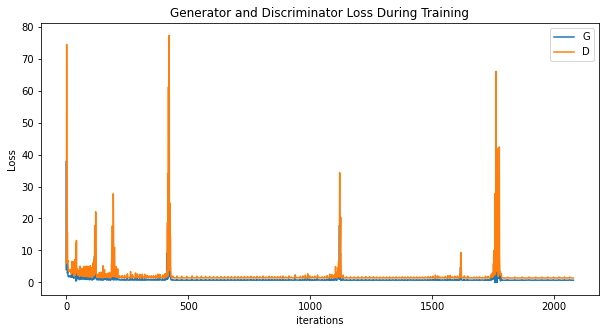

In [0]:
crnngan_deep_discr_curriculum_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


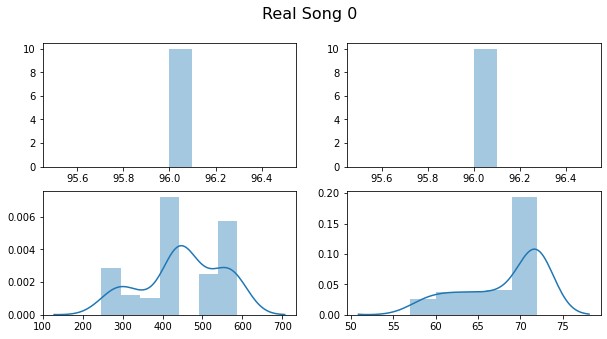

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

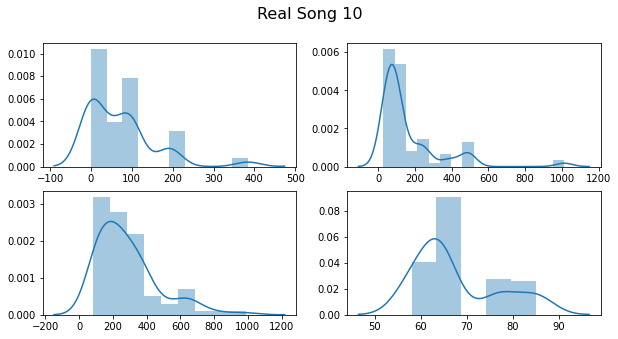

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

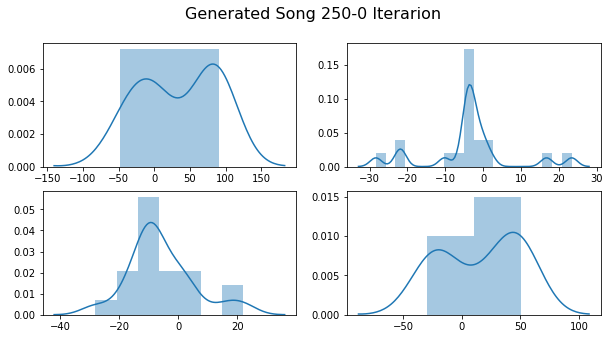

In [0]:
gen_song_250_deep_discr_curriculum_complex_discr_std = crnngan_deep_discr_curriculum_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_discr_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_discr_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_discr_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_discr_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

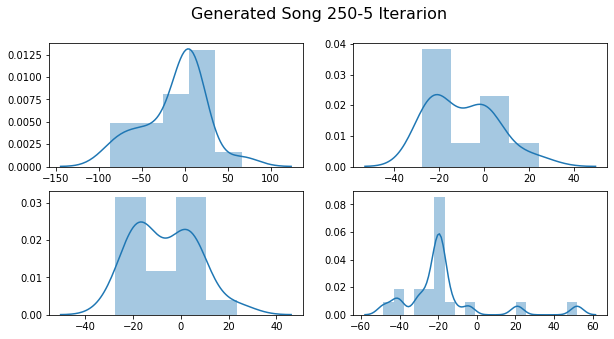

In [0]:
gen_song_250_5_deep_discr_curriculum_complex_discr_std = crnngan_deep_discr_curriculum_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_discr_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_discr_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_discr_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_discr_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

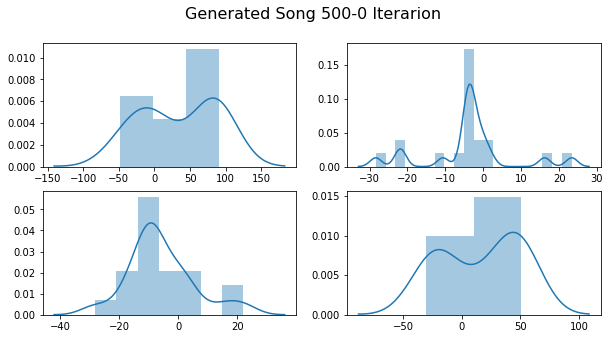

In [0]:
gen_song_500_deep_discr_curriculum_complex_discr_std = crnngan_deep_discr_curriculum_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_discr_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_discr_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_discr_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_discr_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

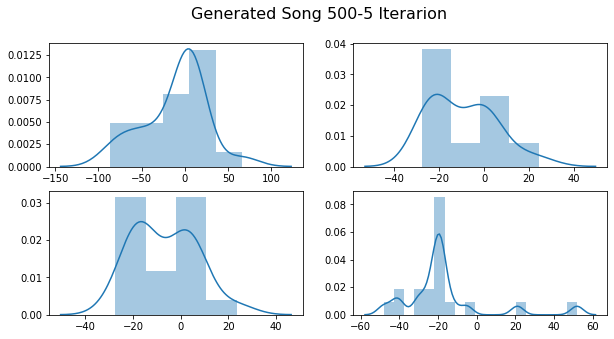

In [0]:
gen_song_500_5_deep_discr_curriculum_complex_discr_std = crnngan_deep_discr_curriculum_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_discr_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_discr_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_discr_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_discr_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

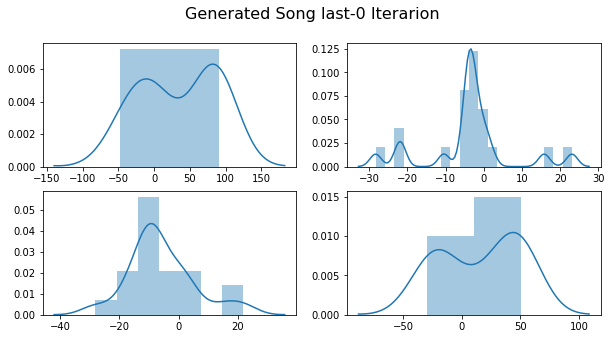

In [0]:
gen_song_last_deep_discr_curriculum_complex_discr_std = crnngan_deep_discr_curriculum_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_discr_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_discr_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_discr_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_discr_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

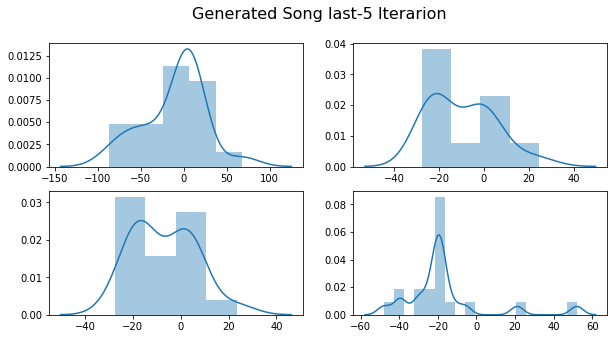

In [0]:
gen_song_last_5_deep_discr_curriculum_complex_discr_std = crnngan_deep_discr_curriculum_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_discr_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_discr_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_discr_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_discr_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

In [0]:
gen_song_250_deep_discr_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_250_deep_discr_curriculum_complex_discr_std, means, stds)
gen_song_250_5_deep_discr_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_250_5_deep_discr_curriculum_complex_discr_std, means, stds)

gen_song_500_deep_discr_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_500_deep_discr_curriculum_complex_discr_std, means, stds)
gen_song_500_5_deep_discr_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_500_5_deep_discr_curriculum_complex_discr_std, means, stds)

gen_song_last_deep_discr_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_last_deep_discr_curriculum_complex_discr_std, means, stds)
gen_song_last_5_deep_discr_curriculum_complex_discr_unstd = crnngan.unstandardize(gen_song_last_5_deep_discr_curriculum_complex_discr_std, means, stds)

In [0]:
save_path = './drive/My Drive/TFM/complex_discr_deep_discr_curriculum_std'
musicDataLoader.save_data(save_path+'/gen_song_250_deep_discr_curriculum_complex_discr_unstd.midi', gen_song_250_deep_discr_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_250_5_deep_discr_curriculum_complex_discr_unstd.midi', gen_song_250_5_deep_discr_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_deep_discr_curriculum_complex_discr_unstd.midi', gen_song_500_deep_discr_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_500_5_deep_discr_curriculum_complex_discr_unstd.midi', gen_song_500_5_deep_discr_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_deep_discr_curriculum_complex_discr_unstd.midi', gen_song_last_deep_discr_curriculum_complex_discr_unstd)
musicDataLoader.save_data(save_path+'/gen_song_last_5_deep_discr_curriculum_complex_discr_unstd.midi', gen_song_last_5_deep_discr_curriculum_complex_discr_unstd)

midi.Pattern(format=1, resolution=384, tracks=\
[midi.Track(\
  [midi.SetTempoEvent(tick=0, data=[20, 88, 85]),
   midi.NoteOnEvent(tick=-36916, channel=0, data=[117, 127]),
   midi.NoteOnEvent(tick=8183, channel=0, data=[97, 127]),
   midi.NoteOffEvent(tick=456, channel=0, data=[117, 0]),
   midi.NoteOffEvent(tick=4114, channel=0, data=[97, 0]),
   midi.EndOfTrackEvent(tick=384, data=[])])])

As it's been happening, it seems like too many negative values...

### Complex Discriminator (3 layers deep both)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True


crnngan_deep_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_deep_complex_discr_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2077	Loss_G: 6.2375	D(x): -4.6020	D(G(z)): -4.6024 / -0.0001
 Time since epoch started: 0.20
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 5.7602	Loss_G: 2.8787	D(x): -0.1241	D(G(z)): -0.1977 / -2.3105
 Time since epoch started: 2.06
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 4.9620	Loss_G: 2.8817	D(x): -0.2147	D(G(z)): -0.2416 / -0.7588
 Time since epoch started: 3.90
There are a total of 10 fake songs saved already
Epoch time: 4.83
[1/50][30]	Loss_D: 6.9343	Loss_G: 3.1078	D(x): -2.6433	D(G(z)): -2.5548 / -0.0571
 Time since epoch started: 0.92
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 4.2775	Loss_G: 2.0674	D(x): -0.7734	D(G(z)): -0.7739 / -0.9772
 Time since epoch started: 2.77
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 4.5011	Loss_G: 2.1162	D(x): -0.0803	D(G(z)): -0.0805 / -1.9618
 Time since epoch started: 4.63
There are a total of 25 fake

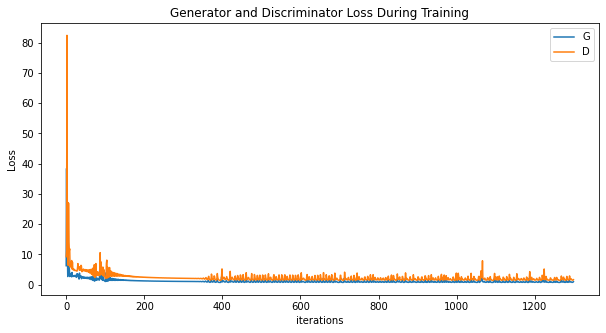

In [0]:
crnngan_deep_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


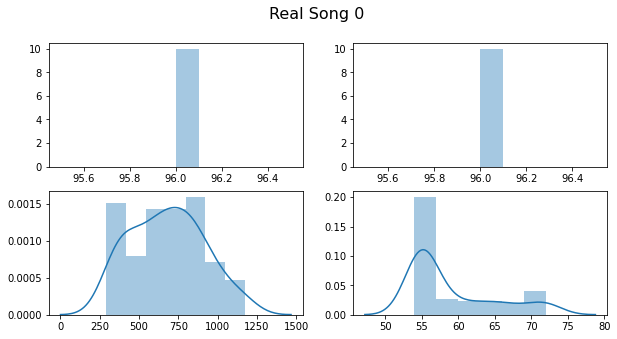

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

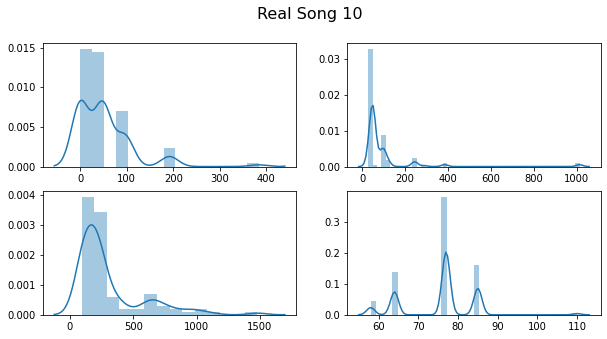

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

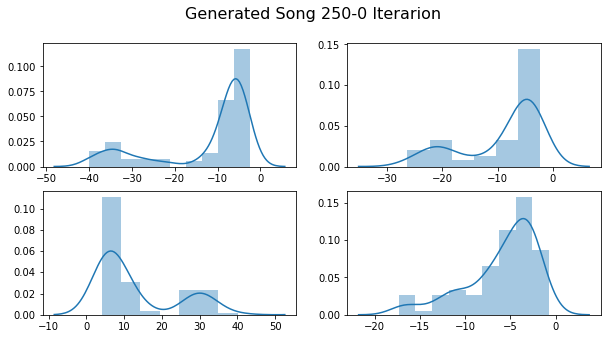

In [0]:
gen_song_250_deep_complex_discr_std = crnngan_deep_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_complex_discr_std[:,3], ax=axs[1, 1])

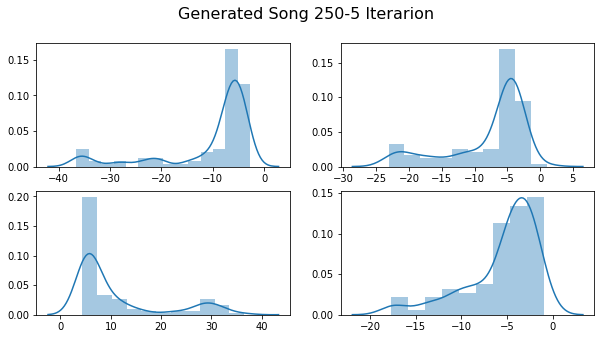

In [0]:
gen_song_250_5_deep_complex_discr_std = crnngan_deep_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_complex_discr_std[:,3], ax=axs[1, 1])

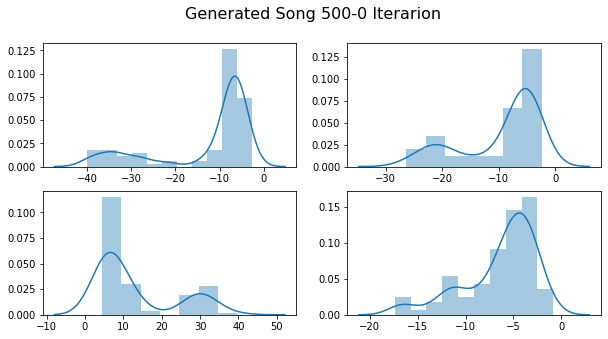

In [0]:
gen_song_500_deep_complex_discr_std = crnngan_deep_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_complex_discr_std[:,3], ax=axs[1, 1])

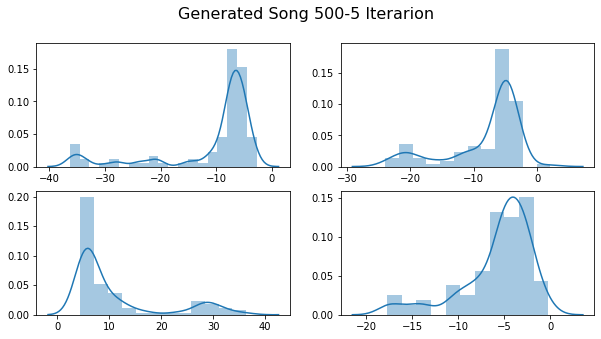

In [0]:
gen_song_500_5_deep_complex_discr_std = crnngan_deep_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_complex_discr_std[:,3], ax=axs[1, 1])

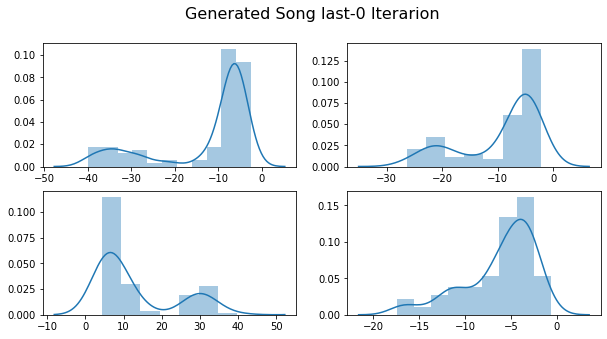

In [0]:
gen_song_last_deep_complex_discr_std = crnngan_deep_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_complex_discr_std[:,3], ax=axs[1, 1])

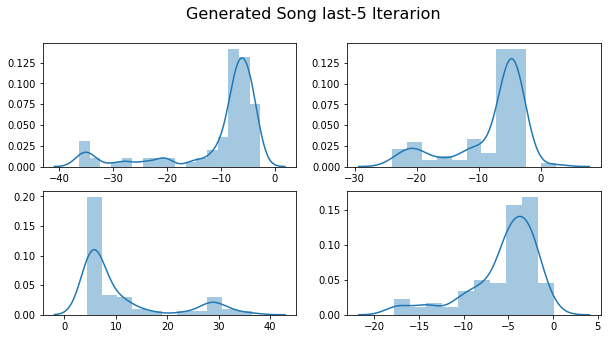

In [0]:
gen_song_last_5_deep_complex_discr_std = crnngan_deep_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_complex_discr_std[:,3], ax=axs[1, 1])

Somewhat good convergence but it doesn't seem like very good valueswhen looking at the distributions...

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexDiscriminator = True

crnngan_deep_curriculum_complex_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexDiscriminator=complexDiscriminator)

cuda
Complex Discriminator


In [0]:
crnngan_deep_curriculum_complex_discr_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9892	Loss_G: 3.9471	D(x): -2.9938	D(G(z)): -2.9939 / -0.0085
 Time since epoch started: 0.06
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 4.6910	Loss_G: 10.5964	D(x): -2.0581	D(G(z)): -1.4341 / -0.0575
 Time since epoch started: 0.54
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 3.4303	Loss_G: 4.3510	D(x): -0.1432	D(G(z)): -0.2176 / -1.1295
 Time since epoch started: 1.00
There are a total of 10 fake songs saved already
Epoch time: 1.23
[1/80][30]	Loss_D: 4.0958	Loss_G: 2.1644	D(x): -0.0717	D(G(z)): -0.0235 / -0.6917
 Time since epoch started: 0.23
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 2.1732	Loss_G: 4.6807	D(x): -0.1905	D(G(z)): -0.1514 / -0.0002
 Time since epoch started: 0.70
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 21.5202	Loss_G: 27.7689	D(x): -2.8598	D(G(z)): -2.6887 / 0.0000
 Time since epoch started: 1.16
There are a total of 25 fa

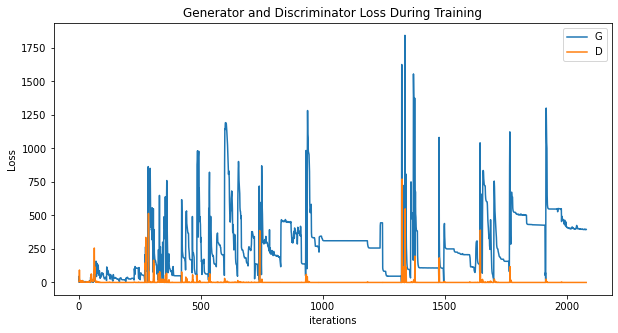

In [0]:
crnngan_deep_curriculum_complex_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


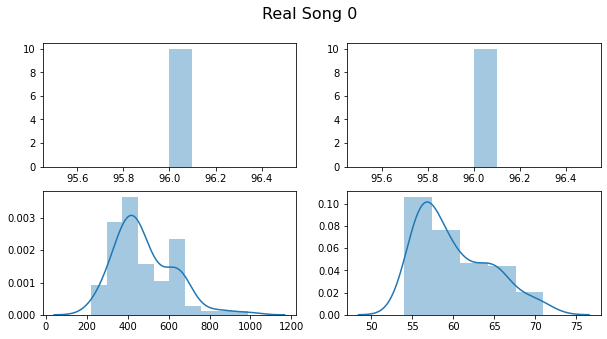

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

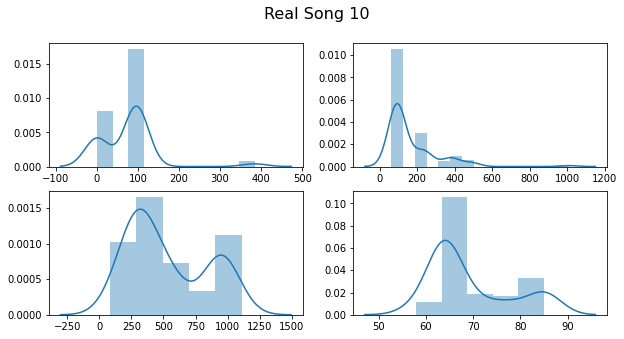

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

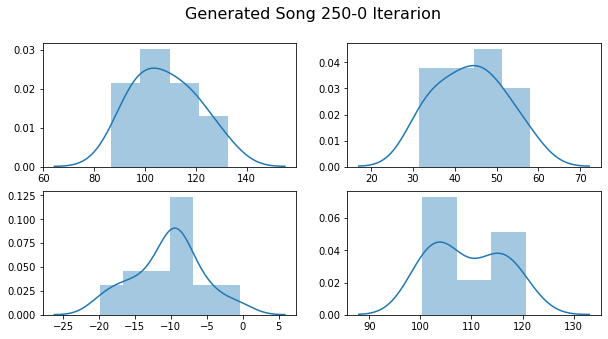

In [0]:
gen_song_250_deep_curriculum_complex_discr_std = crnngan_deep_curriculum_complex_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

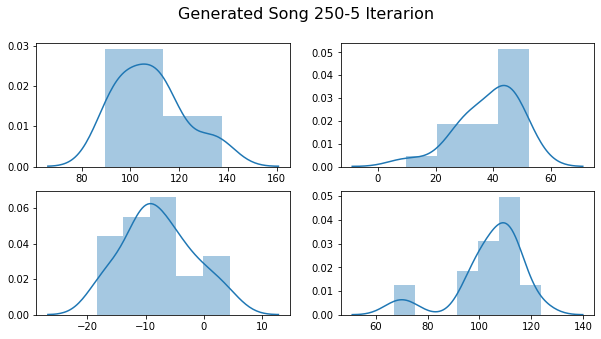

In [0]:
gen_song_250_5_deep_curriculum_complex_discr_std = crnngan_deep_curriculum_complex_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

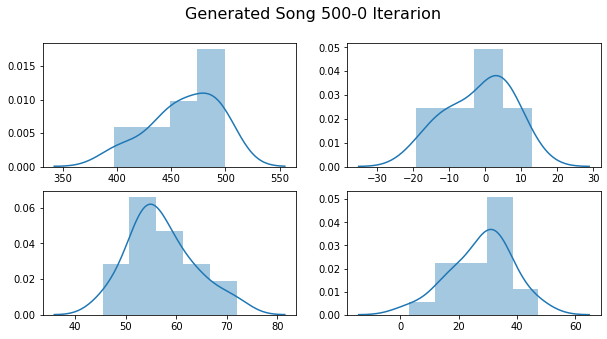

In [0]:
gen_song_500_deep_curriculum_complex_discr_std = crnngan_deep_curriculum_complex_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

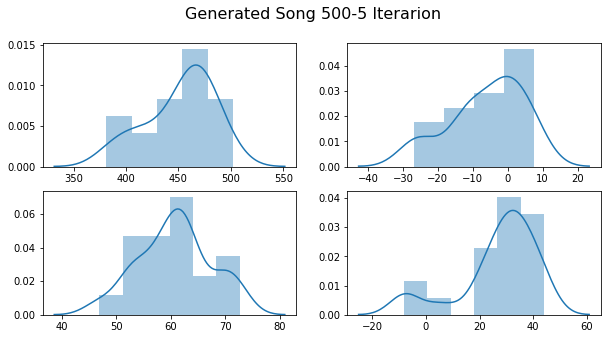

In [0]:
gen_song_500_5_deep_curriculum_complex_discr_std = crnngan_deep_curriculum_complex_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

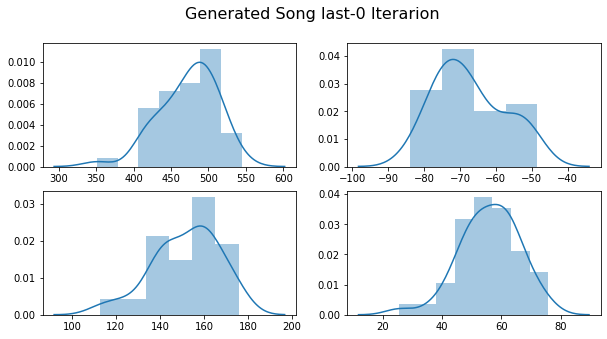

In [0]:
gen_song_last_deep_curriculum_complex_discr_std = crnngan_deep_curriculum_complex_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

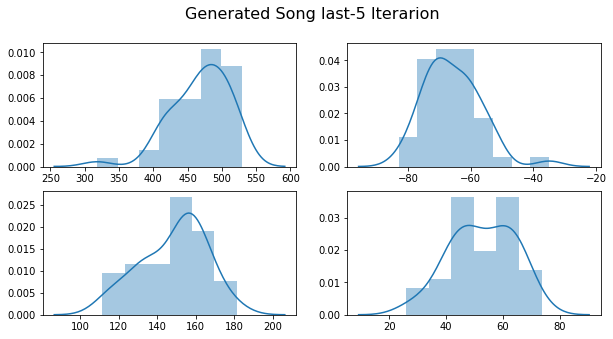

In [0]:
gen_song_last_5_deep_curriculum_complex_discr_std = crnngan_deep_curriculum_complex_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_curriculum_complex_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_curriculum_complex_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_curriculum_complex_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_curriculum_complex_discr_std[:,3], ax=axs[1, 1])

Neither good convergence nor good distributions...

### Complex Generator (2 layers deep both)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True


crnngan_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_complex_gen_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2130	Loss_G: 4.8797	D(x): -4.6011	D(G(z)): -4.6045 / -0.0009
 Time since epoch started: 0.15
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 2.3548	Loss_G: 4.0991	D(x): -0.0551	D(G(z)): -2.2434 / -0.5700
 Time since epoch started: 1.53
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0675	Loss_G: 5.8746	D(x): -0.0298	D(G(z)): -0.0377 / -0.0129
 Time since epoch started: 2.90
There are a total of 10 fake songs saved already
Epoch time: 3.58
[1/50][30]	Loss_D: 0.0056	Loss_G: 6.5598	D(x): -0.0022	D(G(z)): -0.0035 / -0.0033
 Time since epoch started: 0.69
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0041	Loss_G: 7.0962	D(x): -0.0012	D(G(z)): -0.0029 / -0.0022
 Time since epoch started: 2.07
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0020	Loss_G: 7.8870	D(x): -0.0010	D(G(z)): -0.0010 / -0.0010
 Time since epoch started: 3.44
There are a total of 25 fake

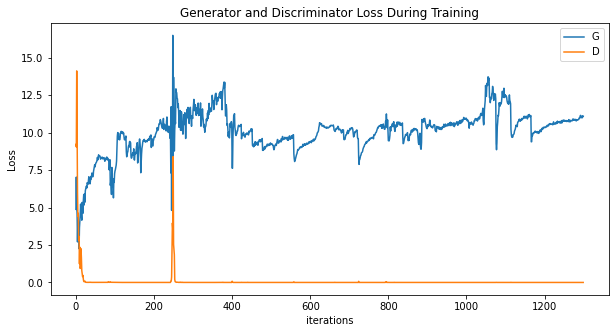

In [0]:
crnngan_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


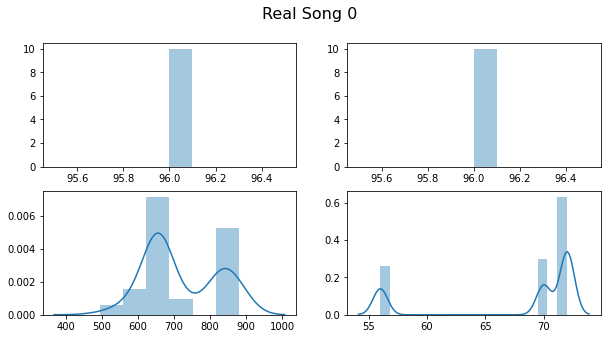

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

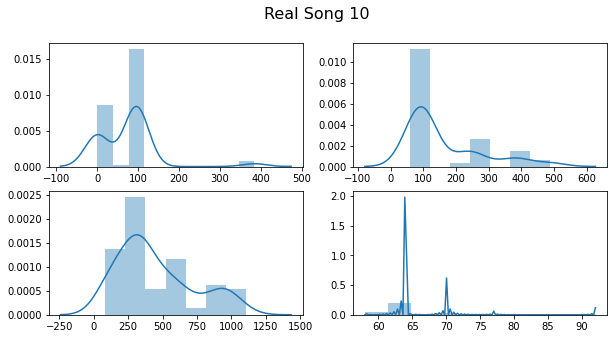

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

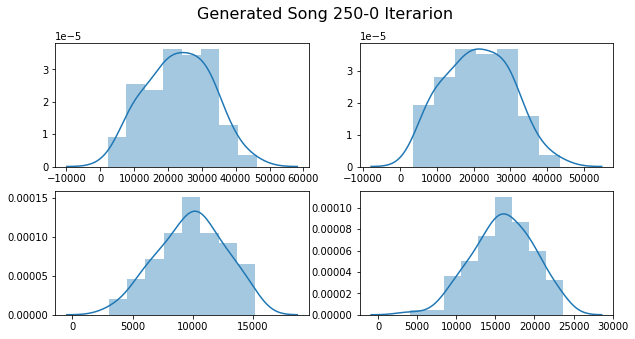

In [0]:
gen_song_250_complex_gen_std = crnngan_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_complex_gen_std[:,3], ax=axs[1, 1])

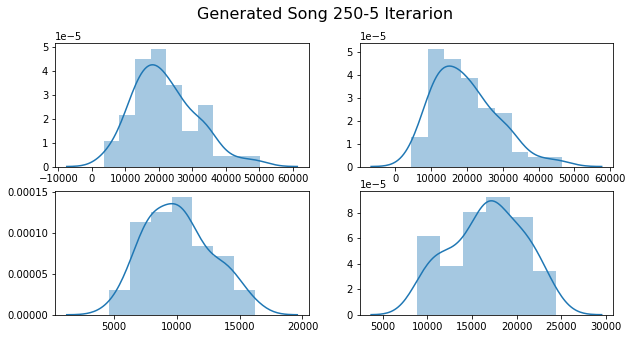

In [0]:
gen_song_250_5_complex_gen_std = crnngan_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_complex_gen_std[:,3], ax=axs[1, 1])

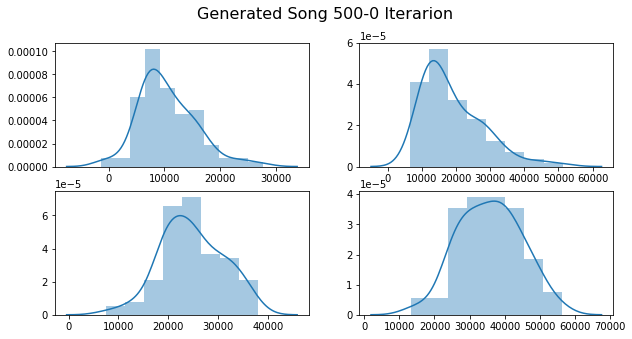

In [0]:
gen_song_500_complex_gen_std = crnngan_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_complex_gen_std[:,3], ax=axs[1, 1])

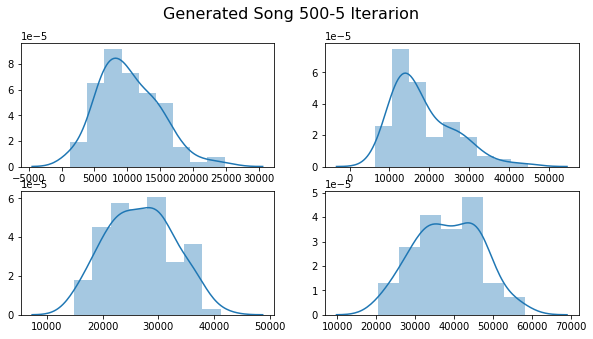

In [0]:
gen_song_500_5_complex_gen_std = crnngan_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_complex_gen_std[:,3], ax=axs[1, 1])

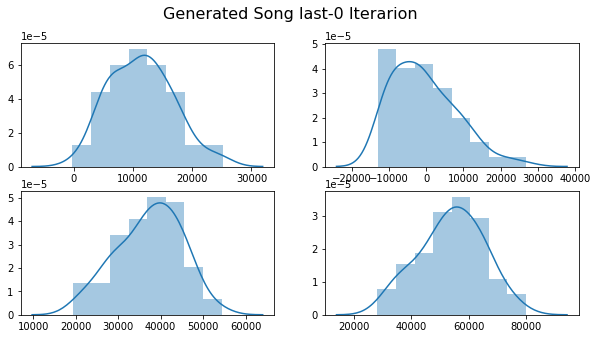

In [0]:
gen_song_last_gen_std = crnngan_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_gen_std[:,3], ax=axs[1, 1])

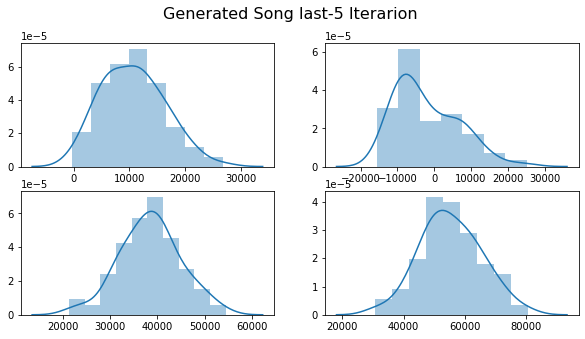

In [0]:
gen_song_last_5_complex_gen_std = crnngan_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_complex_gen_std[:,3], ax=axs[1, 1])

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True

crnngan_curriculum_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_curriculum_complex_gen_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9859	Loss_G: 5.8875	D(x): -2.9908	D(G(z)): -2.9916 / -0.0000
 Time since epoch started: 0.04
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 0.2980	Loss_G: 4.1750	D(x): -0.0141	D(G(z)): -0.2839 / -0.2477
 Time since epoch started: 0.38
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.0256	Loss_G: 6.3358	D(x): -0.0011	D(G(z)): -0.0205 / -0.0121
 Time since epoch started: 0.72
There are a total of 10 fake songs saved already
Epoch time: 0.89
[1/80][30]	Loss_D: 0.0207	Loss_G: 6.3399	D(x): -0.0038	D(G(z)): -0.0150 / -0.0070
 Time since epoch started: 0.17
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.0045	Loss_G: 6.5832	D(x): -0.0012	D(G(z)): -0.0034 / -0.0031
 Time since epoch started: 0.51
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.0038	Loss_G: 6.8296	D(x): -0.0003	D(G(z)): -0.0036 / -0.0027
 Time since epoch started: 0.86
There are a total of 25 fake

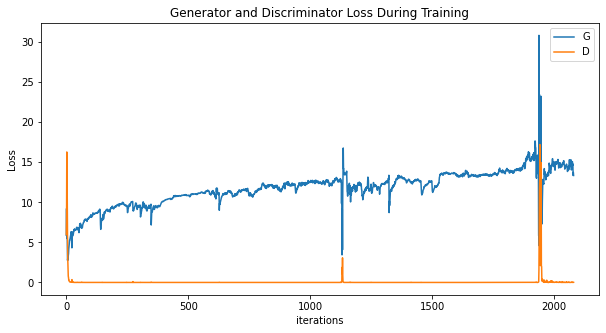

In [0]:
crnngan_curriculum_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


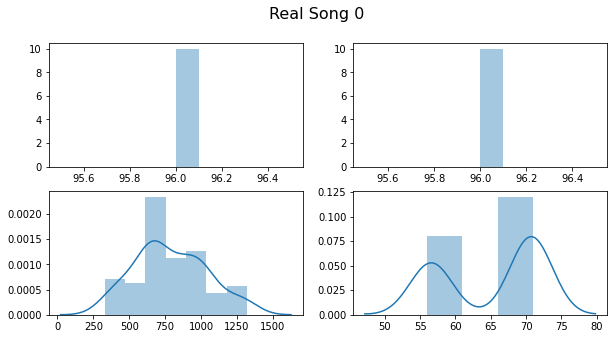

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

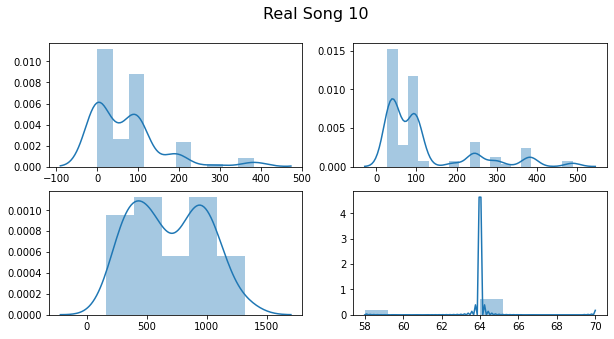

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

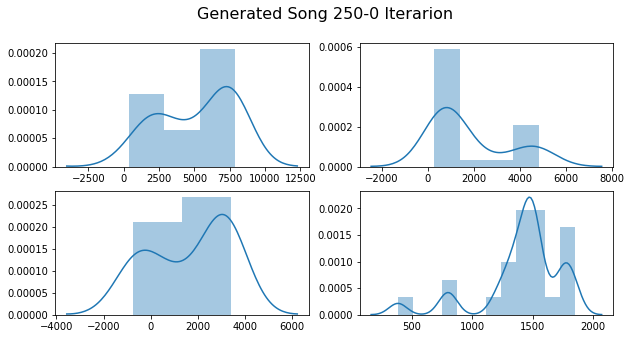

In [0]:
gen_song_250_curriculum_complex_gen_std = crnngan_curriculum_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_complex_gen_std[:,3], ax=axs[1, 1])

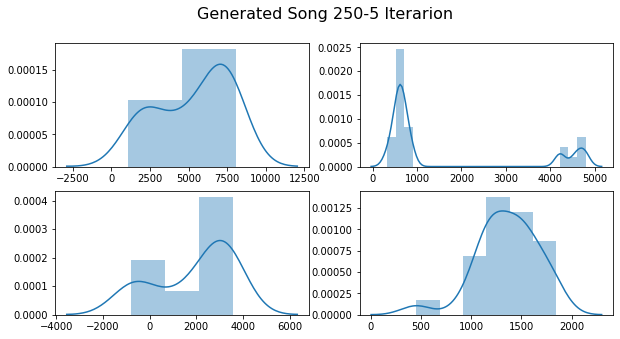

In [0]:
gen_song_250_5_curriculum_complex_gen_std = crnngan_curriculum_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_complex_gen_std[:,3], ax=axs[1, 1])

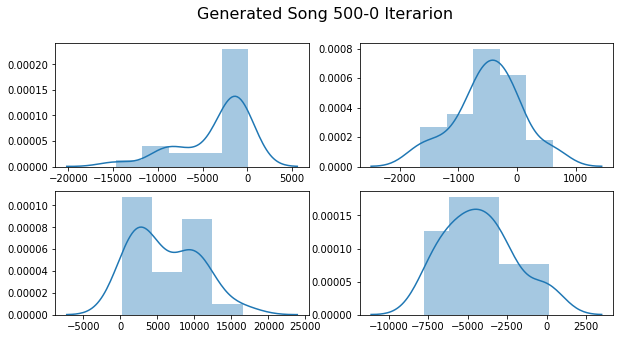

In [0]:
gen_song_500_curriculum_complex_gen_std = crnngan_curriculum_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_complex_gen_std[:,3], ax=axs[1, 1])

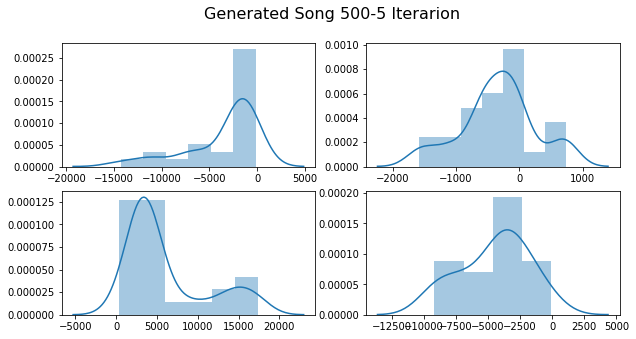

In [0]:
gen_song_500_5_curriculum_complex_gen_std = crnngan_curriculum_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_complex_gen_std[:,3], ax=axs[1, 1])

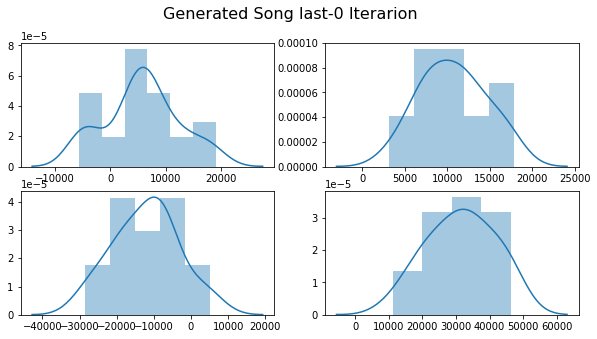

In [0]:
gen_song_last_curriculum_complex_gen_std = crnngan_curriculum_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_complex_gen_std[:,3], ax=axs[1, 1])

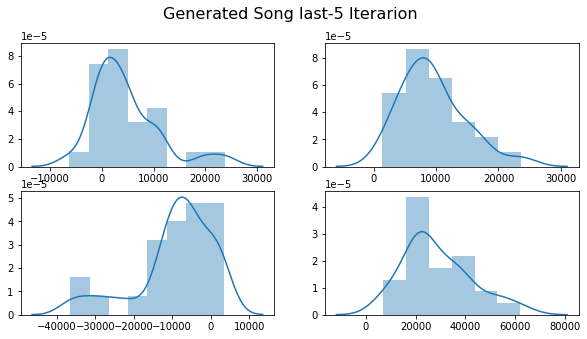

In [0]:
gen_song_last_5_curriculum_complex_gen_std = crnngan_curriculum_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_complex_gen_std[:,3], ax=axs[1, 1])

### Complex Generator (3 layers deep discriminator)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True


crnngan_deep_discr_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_deep_discr_complex_gen_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2276	Loss_G: 2.5558	D(x): -4.6034	D(G(z)): -4.6041 / -1.1608
 Time since epoch started: 0.19
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 0.7248	Loss_G: 2.9327	D(x): -0.1608	D(G(z)): -0.2305 / -0.1469
 Time since epoch started: 1.86
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.3480	Loss_G: 3.4716	D(x): -0.0352	D(G(z)): -0.1358 / -0.1236
 Time since epoch started: 3.50
There are a total of 10 fake songs saved already
Epoch time: 4.33
[1/50][30]	Loss_D: 0.1378	Loss_G: 3.7847	D(x): -0.0217	D(G(z)): -0.0681 / -0.0581
 Time since epoch started: 0.83
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.1618	Loss_G: 4.3371	D(x): -0.0216	D(G(z)): -0.0242 / -0.0228
 Time since epoch started: 2.49
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.1731	Loss_G: 4.2106	D(x): -0.0205	D(G(z)): -0.0593 / -0.0560
 Time since epoch started: 4.17
There are a total of 25 fake

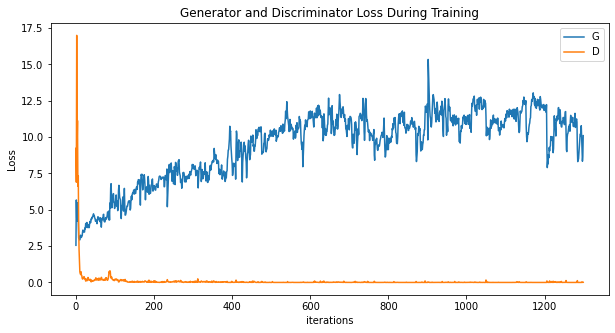

In [0]:
crnngan_deep_discr_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


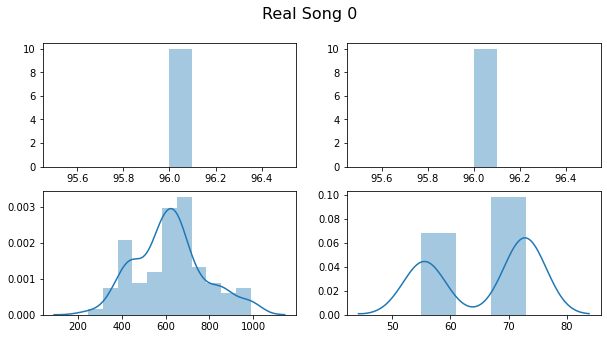

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

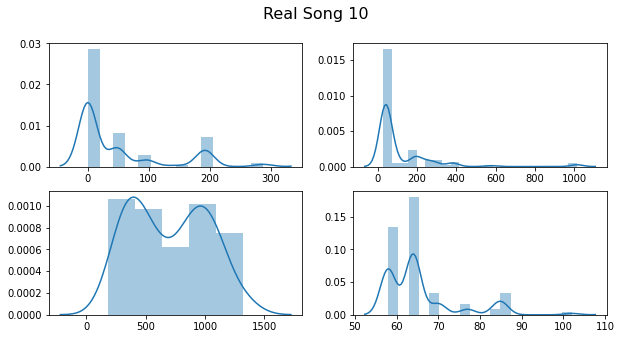

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

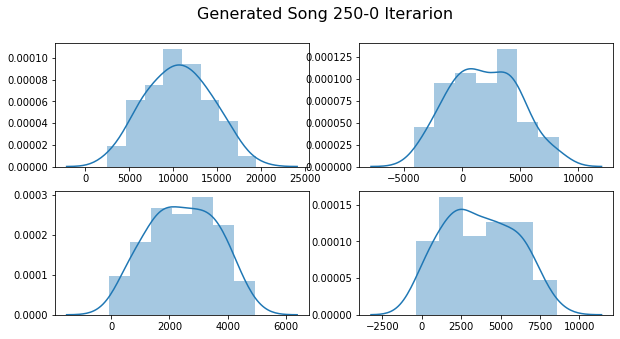

In [0]:
gen_song_250_deep_discr_complex_gen_std = crnngan_deep_discr_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

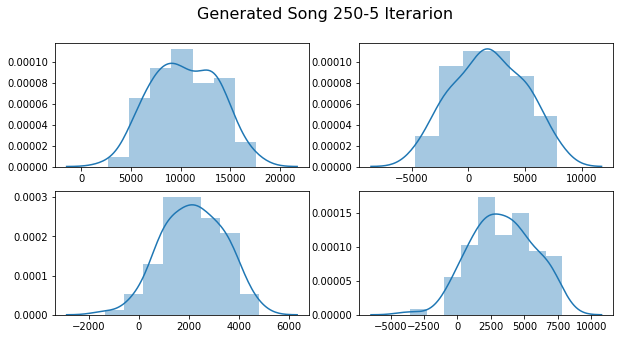

In [0]:
gen_song_250_5_deep_discr_complex_gen_std = crnngan_deep_discr_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

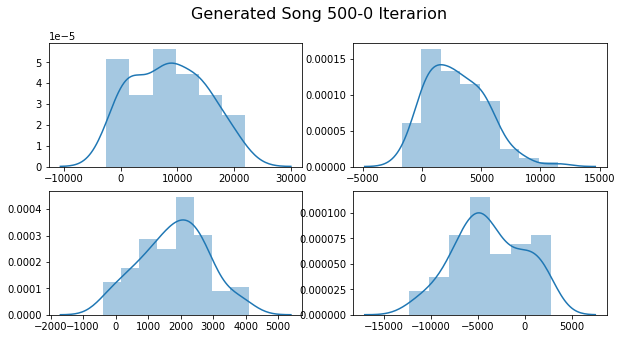

In [0]:
gen_song_500_deep_discr_complex_gen_std = crnngan_deep_discr_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

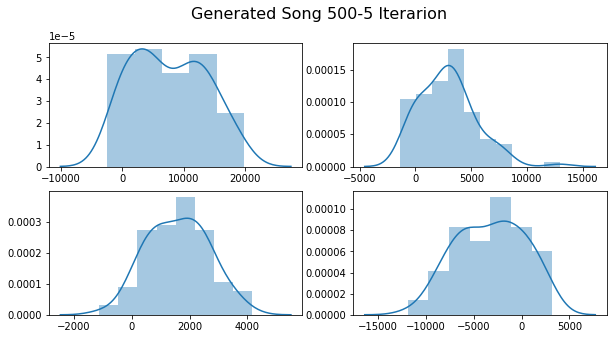

In [0]:
gen_song_500_5_deep_discr_complex_gen_std = crnngan_deep_discr_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

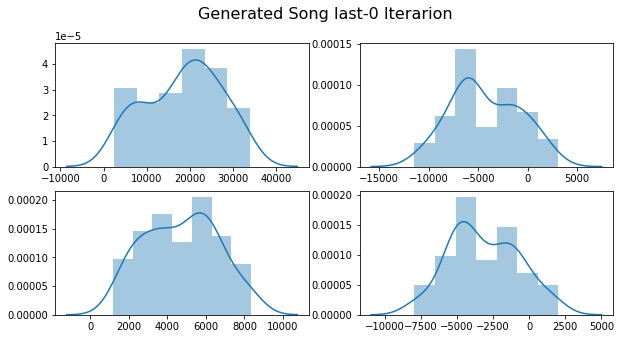

In [0]:
gen_song_last_deep_discr_complex_gen_std = crnngan_deep_discr_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

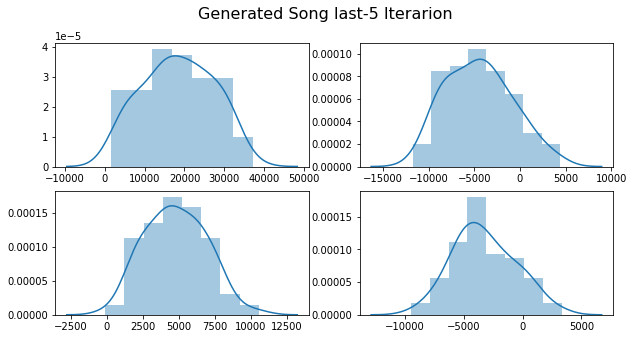

In [0]:
gen_song_last_5_deep_discr_complex_gen_std = crnngan_deep_discr_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

Again and again we keep on getting constant values...

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True

crnngan_curriculum_deep_discr_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_curriculum_deep_discr_complex_gen_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 6.0011	Loss_G: 1.9203	D(x): -2.9942	D(G(z)): -2.9945 / -0.3523
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 4.0158	Loss_G: 1.4261	D(x): -0.6490	D(G(z)): -0.7605 / -0.6092
 Time since epoch started: 0.47
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 1.7211	Loss_G: 3.9553	D(x): -0.9870	D(G(z)): -0.4768 / -0.6847
 Time since epoch started: 0.88
There are a total of 10 fake songs saved already
Epoch time: 1.08
[1/80][30]	Loss_D: 0.3511	Loss_G: 5.0307	D(x): -0.2444	D(G(z)): -0.1067 / -0.0728
 Time since epoch started: 0.20
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.1345	Loss_G: 5.0363	D(x): -0.0800	D(G(z)): -0.0545 / -0.0494
 Time since epoch started: 0.62
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.1074	Loss_G: 5.4208	D(x): -0.0444	D(G(z)): -0.0261 / -0.0677
 Time since epoch started: 1.03
There are a total of 25 fake

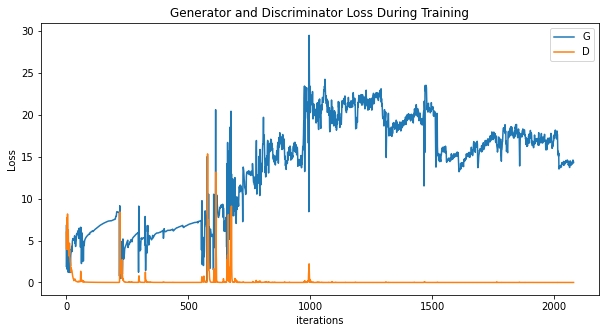

In [0]:
crnngan_curriculum_deep_discr_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


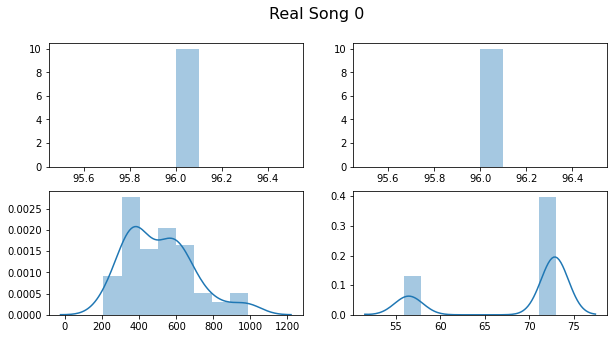

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

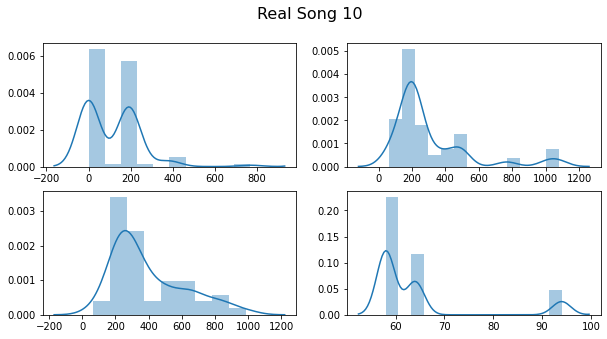

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

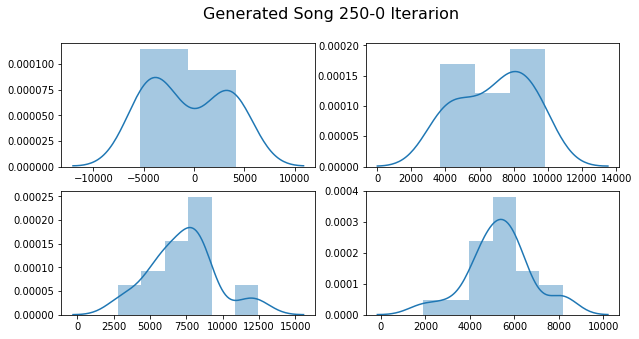

In [0]:
gen_song_250_curriculum_deep_discr_complex_gen_std = crnngan_curriculum_deep_discr_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

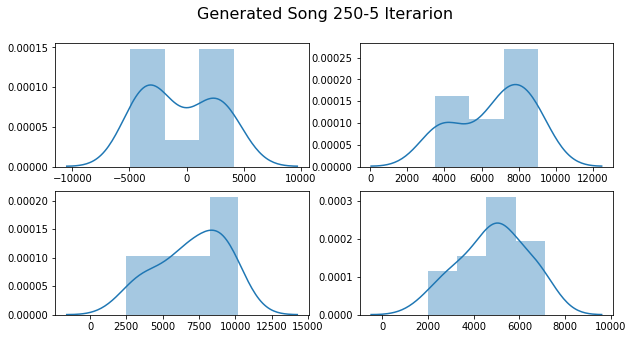

In [0]:
gen_song_250_5_curriculum_deep_discr_complex_gen_std = crnngan_curriculum_deep_discr_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

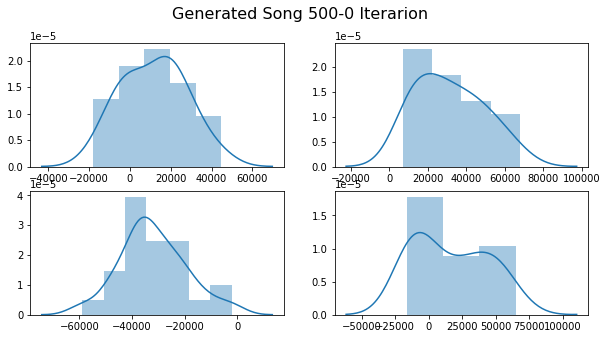

In [0]:
gen_song_500_curriculum_deep_discr_complex_gen_std = crnngan_curriculum_deep_discr_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

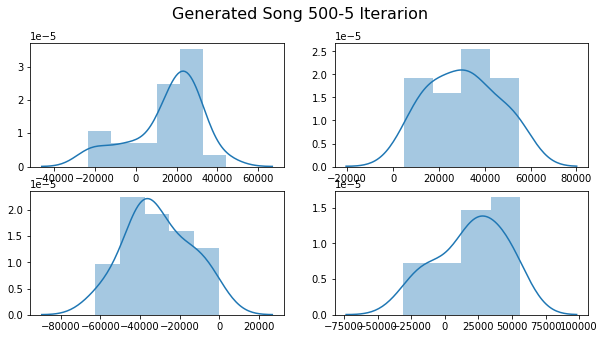

In [0]:
gen_song_500_5_curriculum_deep_discr_complex_gen_std = crnngan_curriculum_deep_discr_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

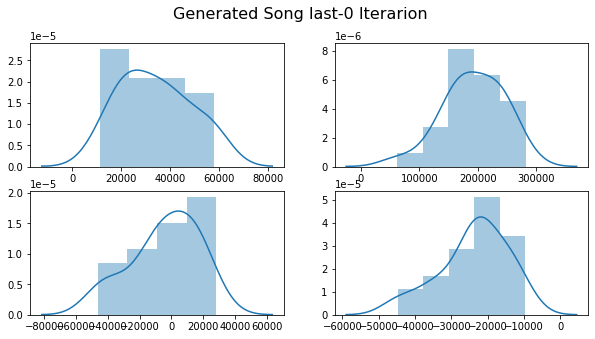

In [0]:
gen_song_last_curriculum_deep_discr_complex_gen_std = crnngan_curriculum_deep_discr_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

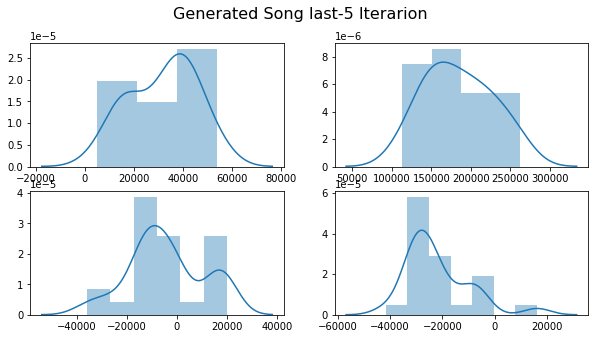

In [0]:
gen_song_last_5_curriculum_deep_discr_complex_gen_std = crnngan_curriculum_deep_discr_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_deep_discr_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_deep_discr_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_deep_discr_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_deep_discr_complex_gen_std[:,3], ax=axs[1, 1])

Again, horrible results...

### Complex Generator (3 layers deep generator)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True


crnngan_deep_gen_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_deep_gen_complex_gen_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2055	Loss_G: 5.4405	D(x): -4.5957	D(G(z)): -4.5996 / -0.0002
 Time since epoch started: 0.17
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 1.9659	Loss_G: 2.8213	D(x): -0.0338	D(G(z)): -0.0800 / -0.5838
 Time since epoch started: 1.69
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0983	Loss_G: 4.4019	D(x): -0.0111	D(G(z)): -0.0592 / -0.0346
 Time since epoch started: 3.21
There are a total of 10 fake songs saved already
Epoch time: 3.96
[1/50][30]	Loss_D: 0.1466	Loss_G: 4.6755	D(x): -0.0109	D(G(z)): -0.1307 / -0.0688
 Time since epoch started: 0.75
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.8633	Loss_G: 4.0214	D(x): -0.0696	D(G(z)): -0.7536 / -0.5722
 Time since epoch started: 2.28
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.3543	Loss_G: 4.4463	D(x): -0.0066	D(G(z)): -0.3424 / -0.1978
 Time since epoch started: 3.81
There are a total of 25 fake

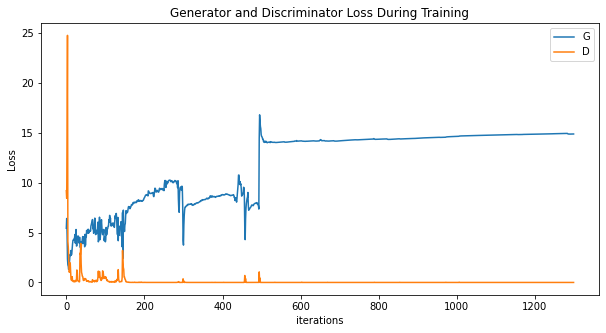

In [0]:
crnngan_deep_gen_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


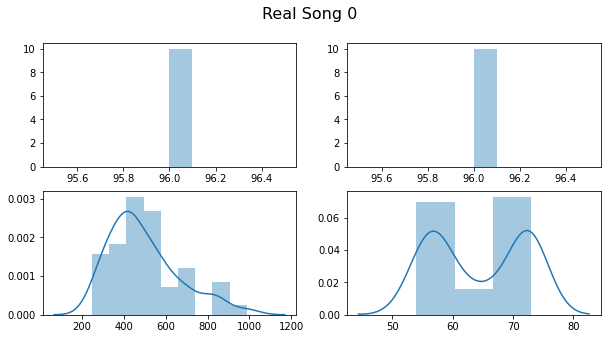

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

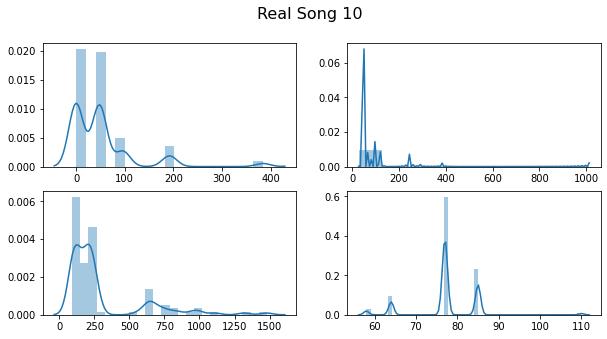

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

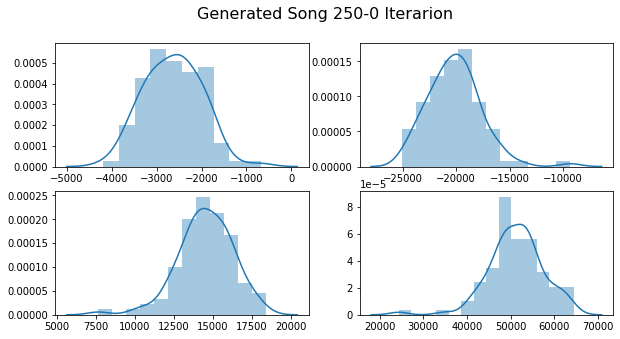

In [0]:
gen_song_250_deep_gen_complex_gen_std = crnngan_deep_gen_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

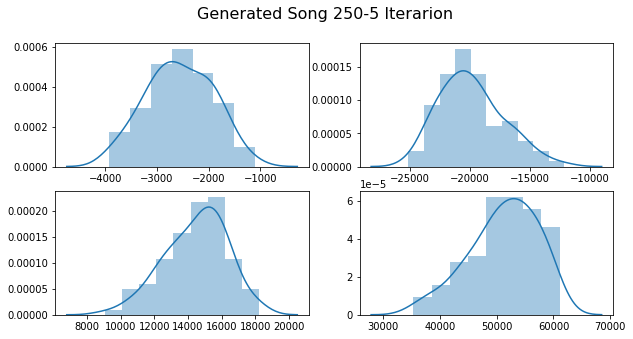

In [0]:
gen_song_250_5_deep_gen_complex_gen_std = crnngan_deep_gen_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

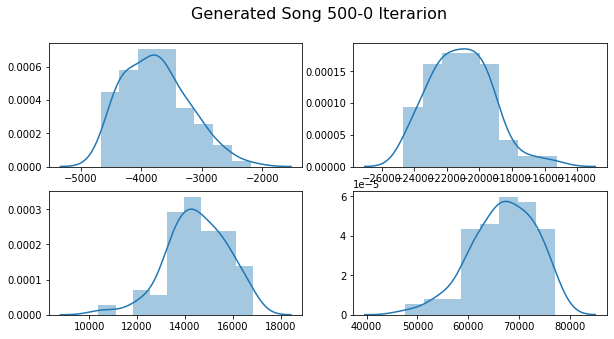

In [0]:
gen_song_500_deep_gen_complex_gen_std = crnngan_deep_gen_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

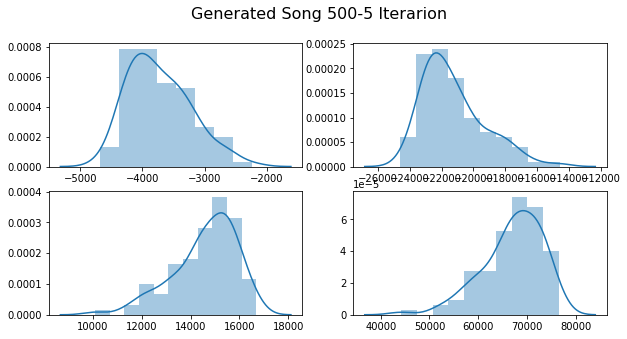

In [0]:
gen_song_500_5_deep_gen_complex_gen_std = crnngan_deep_gen_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

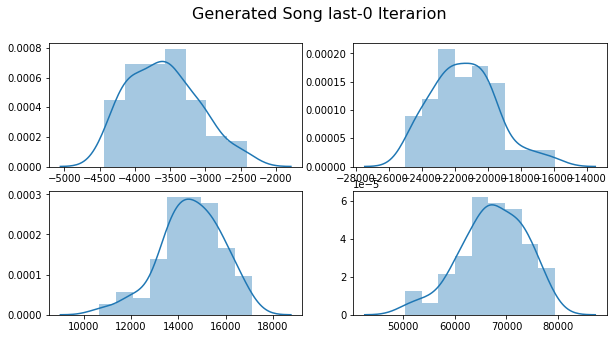

In [0]:
gen_song_last_deep_gen_complex_gen_std = crnngan_deep_gen_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

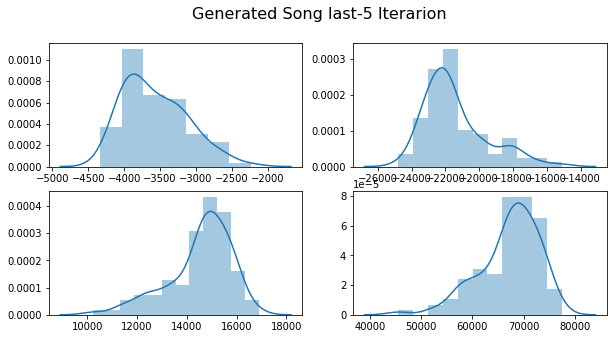

In [0]:
gen_song_last_5_deep_gen_complex_gen_std = crnngan_deep_gen_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

Again and again we keep on getting constant values...

#### Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True

crnngan_curriculum_deep_gen_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_curriculum_deep_gen_complex_gen_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9699	Loss_G: 6.4585	D(x): -2.9814	D(G(z)): -2.9815 / -0.0000
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 1.5218	Loss_G: 7.5897	D(x): -1.2604	D(G(z)): -0.1134 / -0.0806
 Time since epoch started: 0.44
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 1.0339	Loss_G: 7.0381	D(x): -1.0231	D(G(z)): -0.0026 / -0.0018
 Time since epoch started: 0.83
There are a total of 10 fake songs saved already
Epoch time: 1.02
[1/80][30]	Loss_D: 0.1445	Loss_G: 7.7538	D(x): -0.1438	D(G(z)): -0.0007 / -0.0007
 Time since epoch started: 0.19
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.0522	Loss_G: 8.5181	D(x): -0.0519	D(G(z)): -0.0003 / -0.0002
 Time since epoch started: 0.58
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.0081	Loss_G: 9.5587	D(x): -0.0080	D(G(z)): -0.0002 / -0.0001
 Time since epoch started: 0.97
There are a total of 25 fake

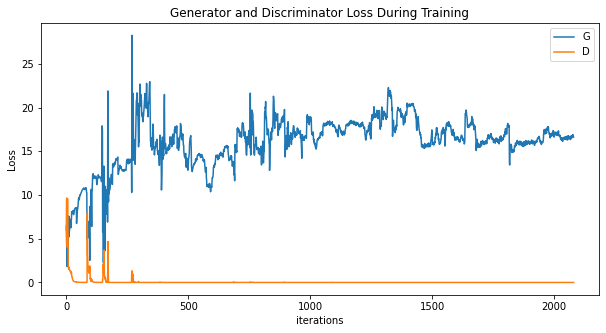

In [0]:
crnngan_curriculum_deep_gen_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


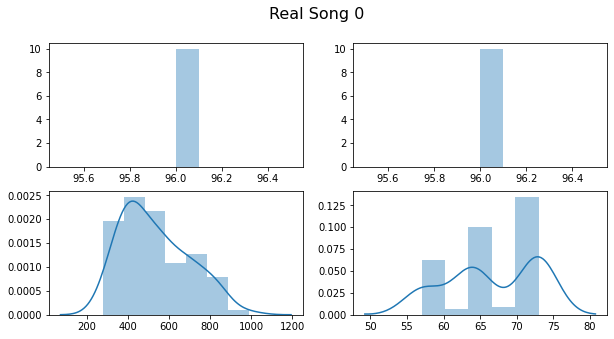

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

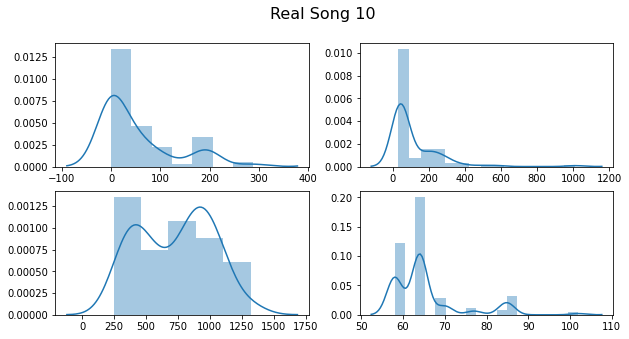

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

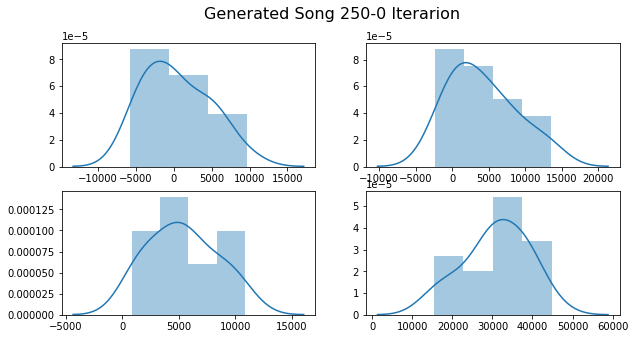

In [0]:
gen_song_250_curriculum_deep_gen_complex_gen_std = crnngan_curriculum_deep_gen_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

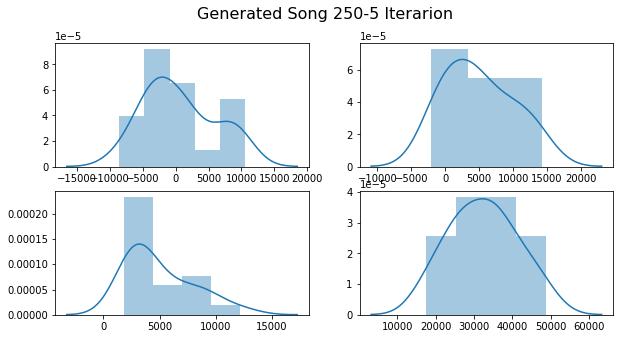

In [0]:
gen_song_250_5_curriculum_deep_gen_complex_gen_std = crnngan_curriculum_deep_gen_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

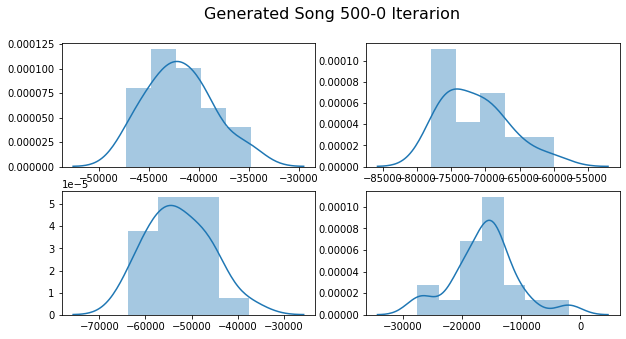

In [0]:
gen_song_500_curriculum_deep_gen_complex_gen_std = crnngan_curriculum_deep_gen_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

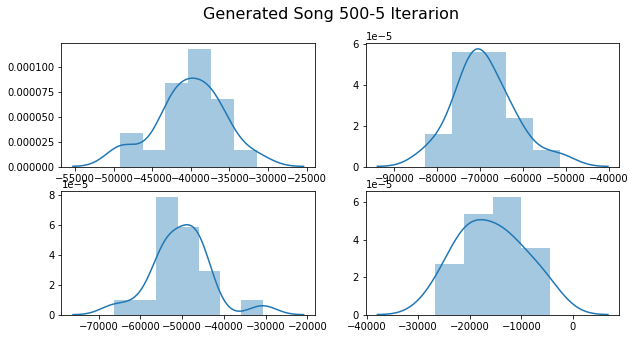

In [0]:
gen_song_500_5_curriculum_deep_gen_complex_gen_std = crnngan_curriculum_deep_gen_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

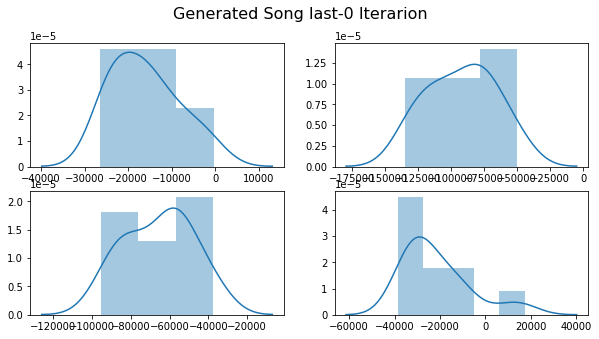

In [0]:
gen_song_last_curriculum_deep_gen_complex_gen_std = crnngan_curriculum_deep_gen_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

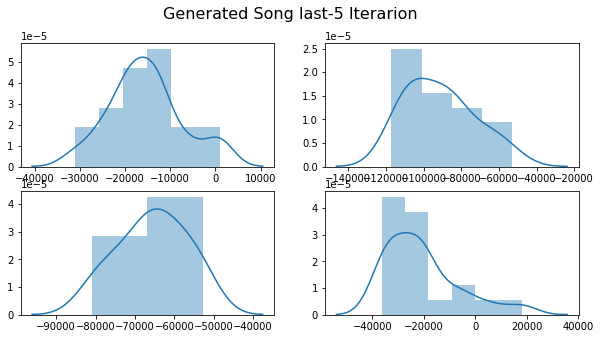

In [0]:
gen_song_last_5_curriculum_deep_gen_complex_gen_std = crnngan_curriculum_deep_gen_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_deep_gen_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_deep_gen_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_deep_gen_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_deep_gen_complex_gen_std[:,3], ax=axs[1, 1])

Again horrible distributions...

### Complex Generator (3 layers deep both)

#### No Curriculum

In [0]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True


crnngan_deep_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [0]:
crnngan_deep_complex_gen_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.1967	Loss_G: 2.4857	D(x): -4.5967	D(G(z)): -4.5967 / -0.5401
 Time since epoch started: 0.20
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 7.6965	Loss_G: 4.1369	D(x): -2.1995	D(G(z)): -0.7183 / -0.0575
 Time since epoch started: 2.00
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0054	Loss_G: 7.3267	D(x): -0.0017	D(G(z)): -0.0037 / -0.0024
 Time since epoch started: 3.82
There are a total of 10 fake songs saved already
Epoch time: 4.72
[1/50][30]	Loss_D: 0.0009	Loss_G: 8.0736	D(x): -0.0003	D(G(z)): -0.0005 / -0.0005
 Time since epoch started: 0.90
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0006	Loss_G: 8.3401	D(x): -0.0003	D(G(z)): -0.0003 / -0.0004
 Time since epoch started: 2.71
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0004	Loss_G: 8.7448	D(x): -0.0001	D(G(z)): -0.0003 / -0.0003
 Time since epoch started: 4.52
There are a total of 25 fake

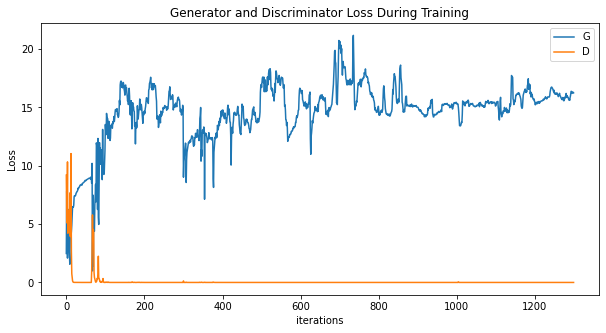

In [0]:
crnngan_deep_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


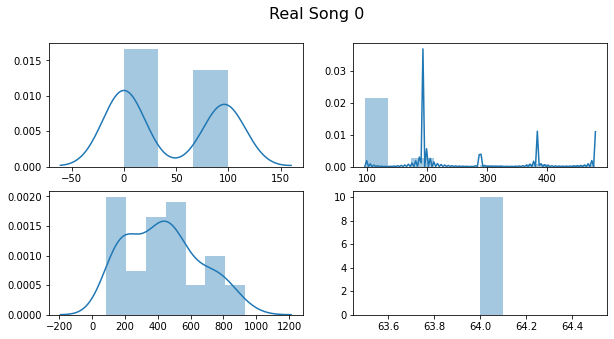

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

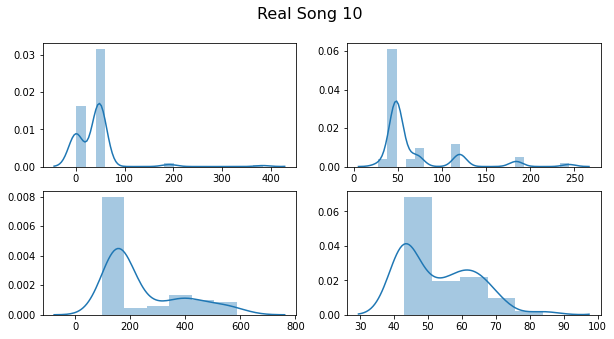

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

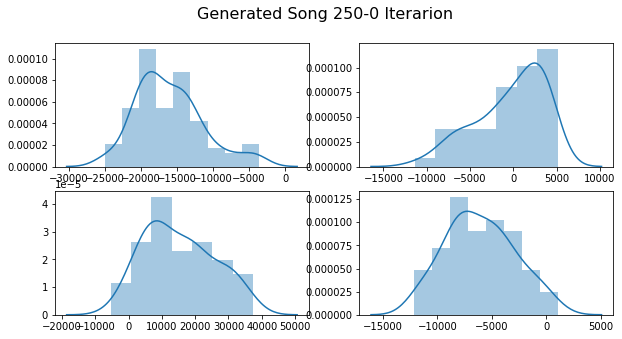

In [0]:
gen_song_250_deep_complex_gen_std = crnngan_deep_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_deep_complex_gen_std[:,3], ax=axs[1, 1])

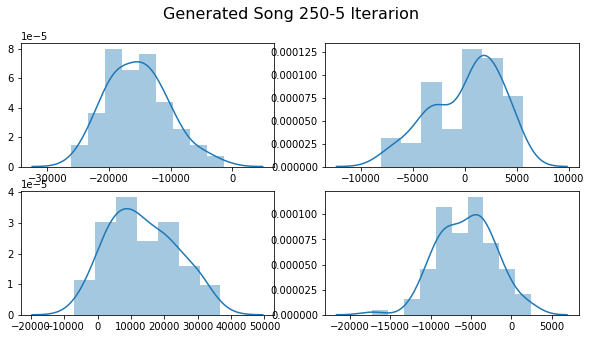

In [0]:
gen_song_250_5_deep_complex_gen_std = crnngan_deep_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_deep_complex_gen_std[:,3], ax=axs[1, 1])

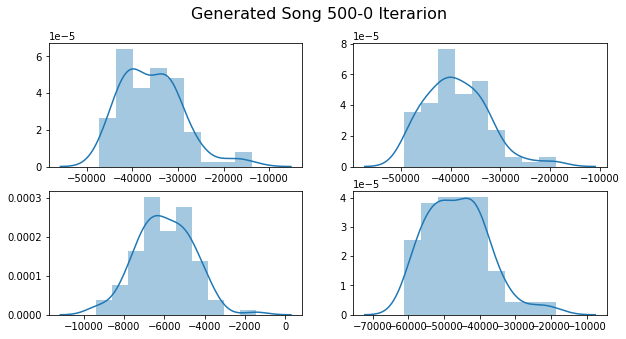

In [0]:
gen_song_500_deep_complex_gen_std = crnngan_deep_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_deep_complex_gen_std[:,3], ax=axs[1, 1])

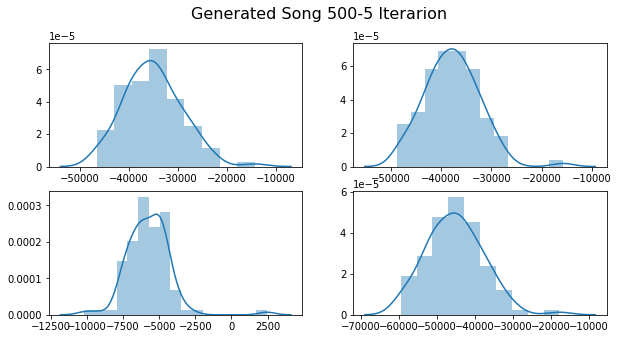

In [0]:
gen_song_500_5_deep_complex_gen_std = crnngan_deep_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_deep_complex_gen_std[:,3], ax=axs[1, 1])

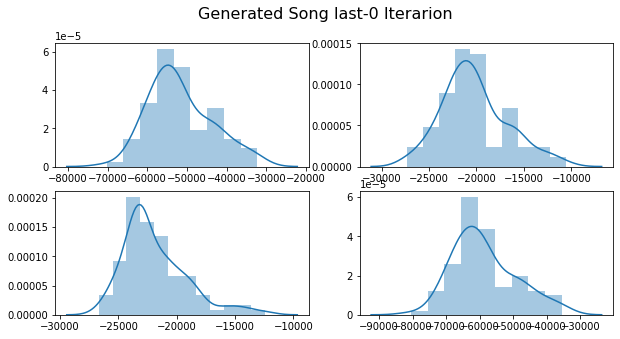

In [0]:
gen_song_last_deep_complex_gen_std = crnngan_deep_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_deep_complex_gen_std[:,3], ax=axs[1, 1])

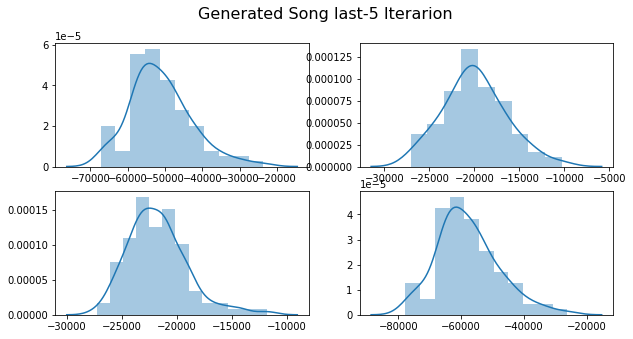

In [0]:
gen_song_last_5_deep_complex_gen_std = crnngan_deep_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_deep_complex_gen_std[:,3], ax=axs[1, 1])

Again and again we keep on getting constant values, not only that but also convergence is not very good...

#### Curriculum

In [28]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True

crnngan_curriculum_deep_complex_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator)

cuda
Complex Generator


In [29]:
crnngan_curriculum_deep_complex_gen_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9908	Loss_G: 1.8645	D(x): -2.9944	D(G(z)): -2.9946 / -0.4861
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 2.2300	Loss_G: 2.0121	D(x): -0.4377	D(G(z)): -0.6536 / -1.3230
 Time since epoch started: 0.51
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.8925	Loss_G: 4.8446	D(x): -0.4140	D(G(z)): -0.4645 / -0.2640
 Time since epoch started: 0.96
There are a total of 10 fake songs saved already
Epoch time: 1.18
[1/80][30]	Loss_D: 1.9541	Loss_G: 3.5784	D(x): -0.3580	D(G(z)): -0.3577 / -0.6436
 Time since epoch started: 0.23
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 1.2248	Loss_G: 1.8819	D(x): -0.7056	D(G(z)): -0.5150 / -0.3280
 Time since epoch started: 0.68
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.1637	Loss_G: 5.3237	D(x): -0.0633	D(G(z)): -0.1004 / -0.0693
 Time since epoch started: 1.12
There are a total of 25 fake

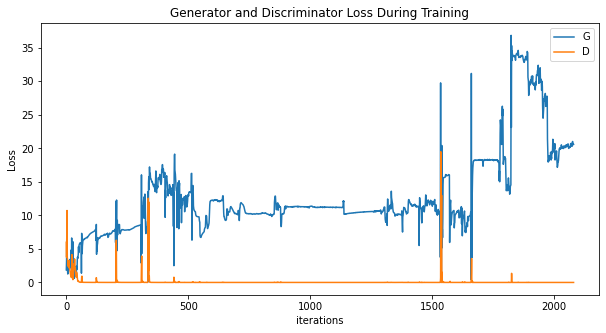

In [30]:
crnngan_curriculum_deep_complex_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


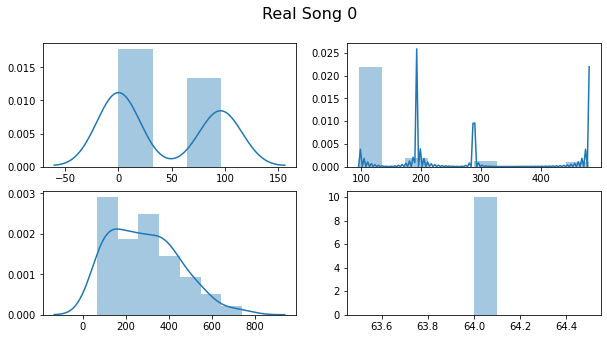

In [32]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

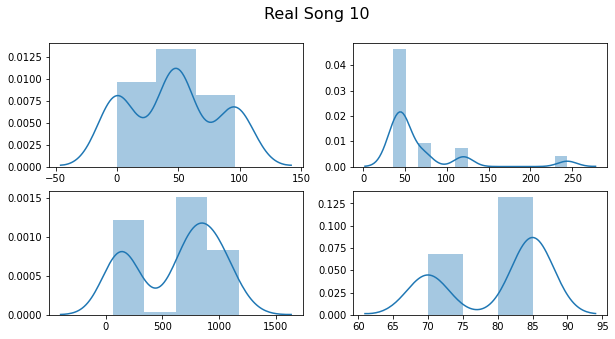

In [33]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

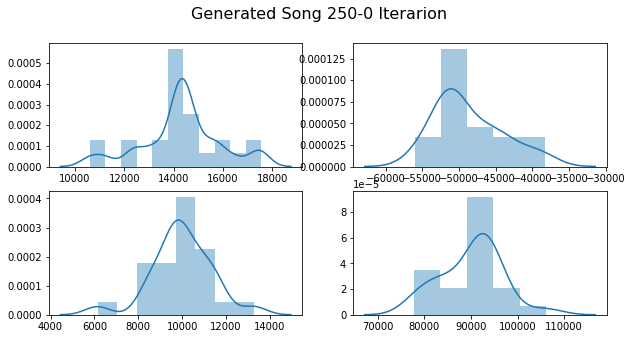

In [34]:
gen_song_250_curriculum_deep_complex_gen_std = crnngan_curriculum_deep_complex_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_deep_complex_gen_std[:,3], ax=axs[1, 1])

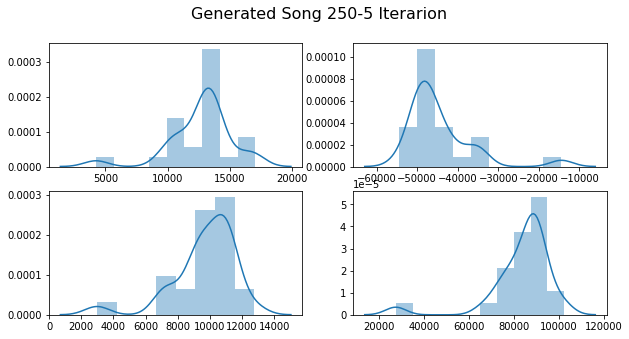

In [35]:
gen_song_250_5_curriculum_deep_complex_gen_std = crnngan_curriculum_deep_complex_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_deep_complex_gen_std[:,3], ax=axs[1, 1])

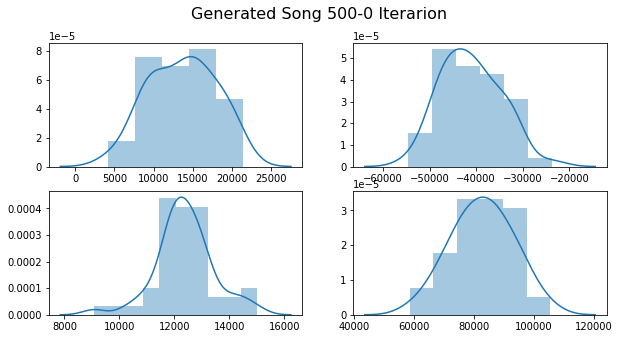

In [36]:
gen_song_500_curriculum_deep_complex_gen_std = crnngan_curriculum_deep_complex_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_deep_complex_gen_std[:,3], ax=axs[1, 1])

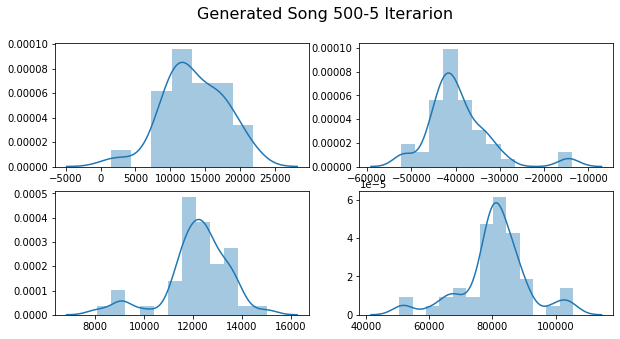

In [37]:
gen_song_500_5_curriculum_deep_complex_gen_std = crnngan_curriculum_deep_complex_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_deep_complex_gen_std[:,3], ax=axs[1, 1])

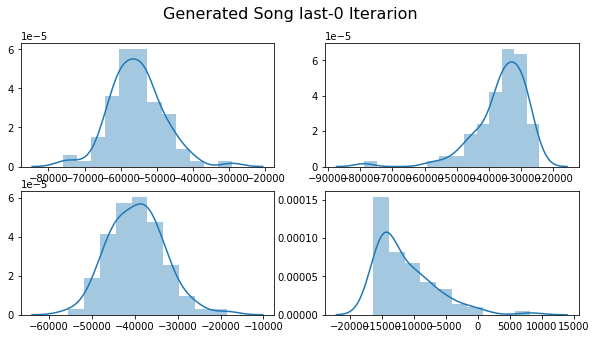

In [38]:
gen_song_last_curriculum_deep_complex_gen_std = crnngan_curriculum_deep_complex_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_deep_complex_gen_std[:,3], ax=axs[1, 1])

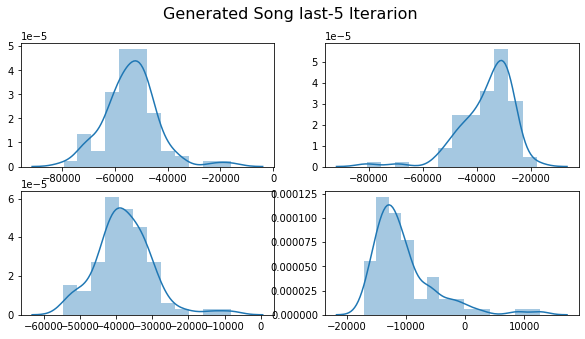

In [39]:
gen_song_last_5_curriculum_deep_complex_gen_std = crnngan_curriculum_deep_complex_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_deep_complex_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_deep_complex_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_deep_complex_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_deep_complex_gen_std[:,3], ax=axs[1, 1])

We keep on getting very bad distributions...

### Both Complex (2 layers deep both)

#### No Curriculum

In [40]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_both_complex_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [41]:
crnngan_both_complex_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.1987	Loss_G: 38.3600	D(x): -4.5975	D(G(z)): -4.5978 / 0.0000
 Time since epoch started: 0.16
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 7.5594	Loss_G: 13.7568	D(x): -0.0018	D(G(z)): -0.0001 / -0.1145
 Time since epoch started: 1.56
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0087	Loss_G: 24.6500	D(x): -0.0036	D(G(z)): -0.0051 / -0.0013
 Time since epoch started: 2.97
There are a total of 10 fake songs saved already
Epoch time: 3.67
[1/50][30]	Loss_D: 0.0001	Loss_G: 18.8234	D(x): -0.0001	D(G(z)): -0.0001 / -0.0000
 Time since epoch started: 0.70
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0001	Loss_G: 20.0763	D(x): -0.0000	D(G(z)): -0.0000 / -0.0000
 Time since epoch started: 2.11
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0002	Loss_G: 15.6797	D(x): -0.0001	D(G(z)): -0.0001 / -0.0001
 Time since epoch started: 3.51
There are a total of 25

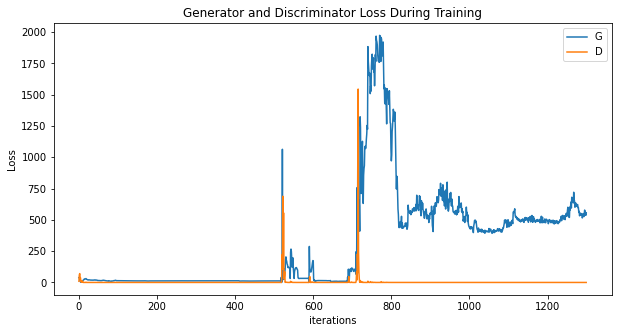

In [42]:
crnngan_both_complex_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


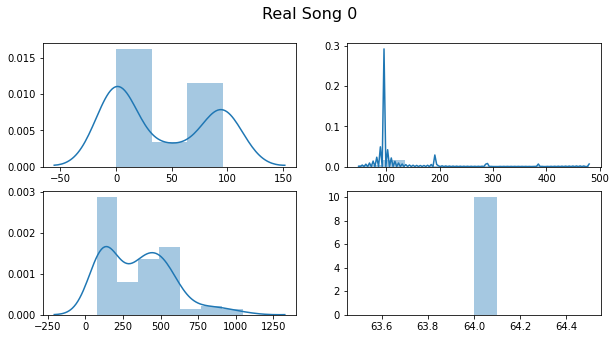

In [44]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

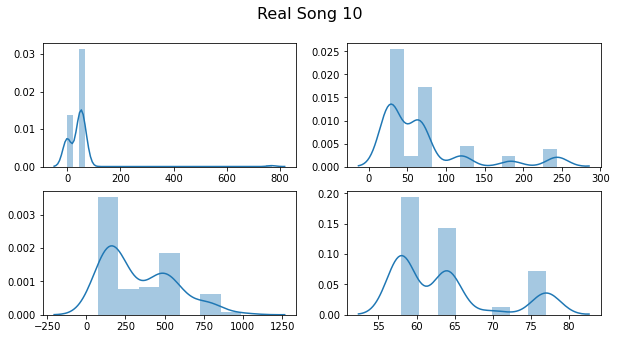

In [45]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

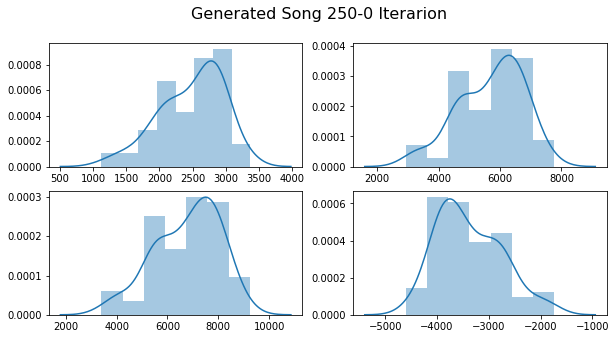

In [46]:
gen_song_250_both_complex_std = crnngan_both_complex_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_both_complex_std[:,3], ax=axs[1, 1])

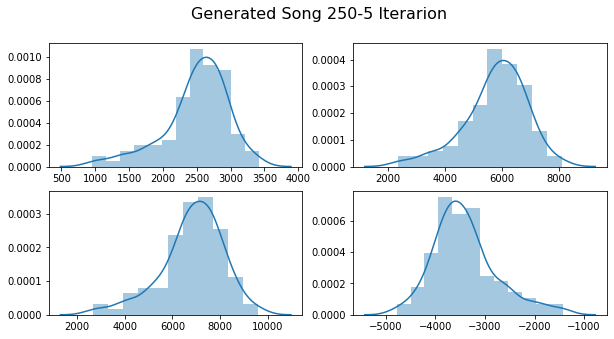

In [47]:
gen_song_250_5_both_complex_std = crnngan_both_complex_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_both_complex_std[:,3], ax=axs[1, 1])

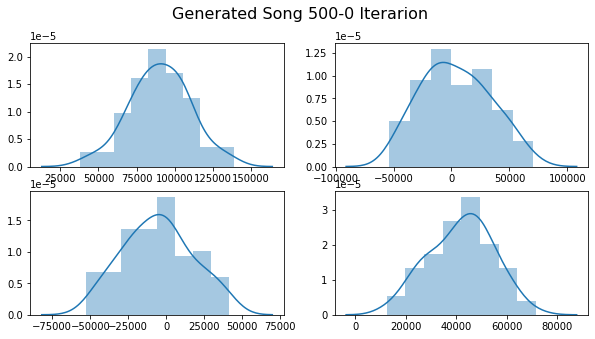

In [48]:
gen_song_500_both_complex_std = crnngan_both_complex_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_both_complex_std[:,3], ax=axs[1, 1])

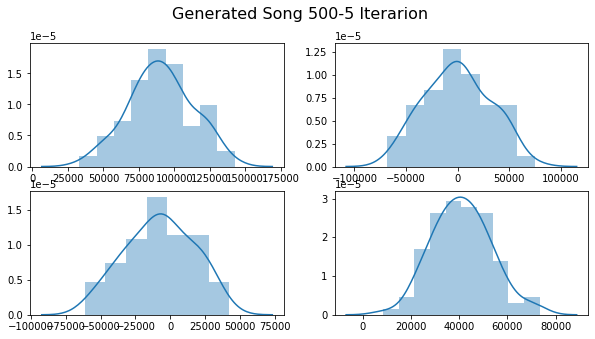

In [49]:
gen_song_500_5_both_complex_std = crnngan_both_complex_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_both_complex_std[:,3], ax=axs[1, 1])

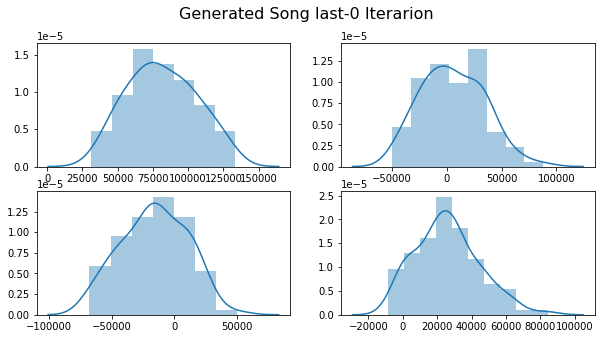

In [50]:
gen_song_last_both_complex_std = crnngan_both_complex_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_both_complex_std[:,3], ax=axs[1, 1])

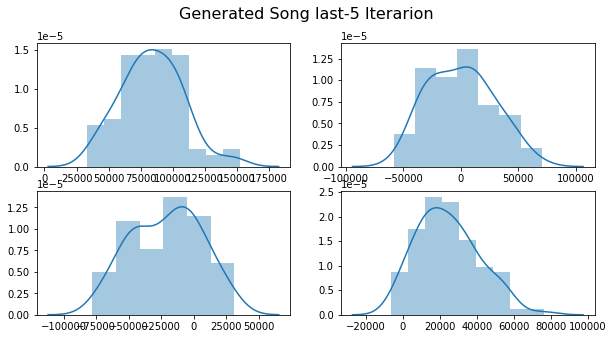

In [51]:
gen_song_last_5_both_complex_std = crnngan_both_complex_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_both_complex_std[:,3], ax=axs[1, 1])

As usual, good convergence but really bad generated values...

#### Curriculum

In [52]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_curriculum_both_complex_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [53]:
crnngan_curriculum_both_complex_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9896	Loss_G: 21.9454	D(x): -2.9918	D(G(z)): -2.9927 / 0.0000
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 29.4365	Loss_G: 15.1636	D(x): -0.4661	D(G(z)): -0.6388 / -0.2972
 Time since epoch started: 0.42
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.0517	Loss_G: 24.5594	D(x): -0.0008	D(G(z)): -0.0044 / -0.0013
 Time since epoch started: 0.77
There are a total of 10 fake songs saved already
Epoch time: 0.95
[1/80][30]	Loss_D: 0.0003	Loss_G: 25.2351	D(x): -0.0001	D(G(z)): -0.0002 / -0.0002
 Time since epoch started: 0.17
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.0002	Loss_G: 22.6698	D(x): -0.0001	D(G(z)): -0.0001 / -0.0001
 Time since epoch started: 0.53
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.0001	Loss_G: 20.8003	D(x): -0.0000	D(G(z)): -0.0001 / -0.0001
 Time since epoch started: 0.88
There are a total of 2

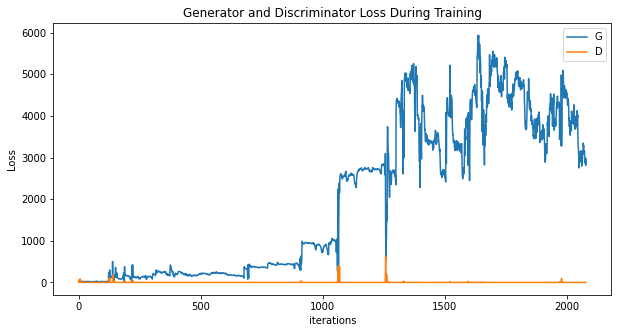

In [54]:
crnngan_curriculum_both_complex_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


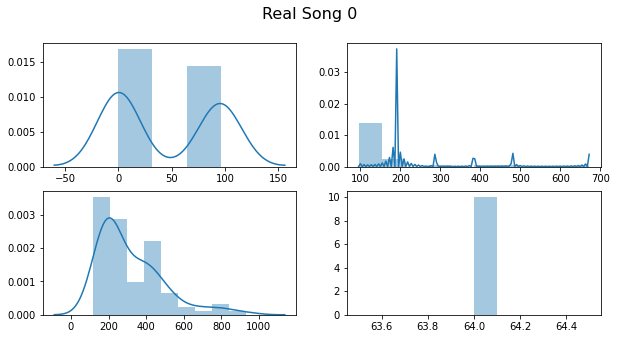

In [56]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

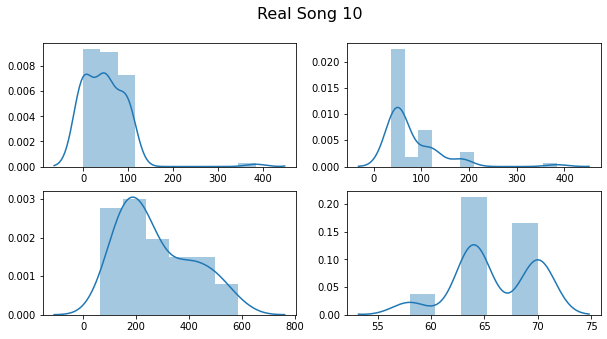

In [57]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

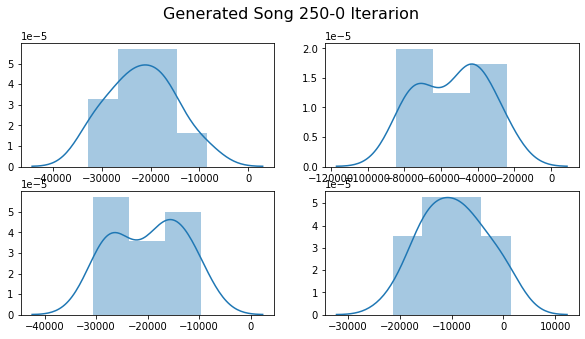

In [58]:
gen_song_250_curriculum_both_complex_std = crnngan_curriculum_both_complex_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_both_complex_std[:,3], ax=axs[1, 1])

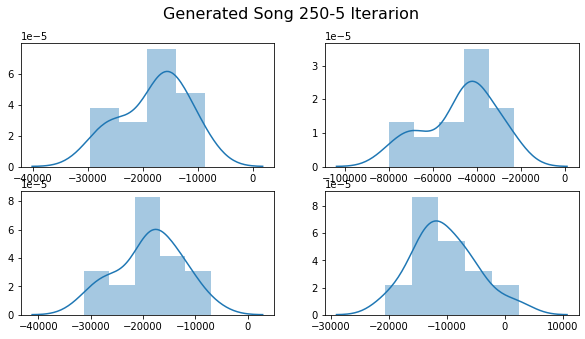

In [59]:
gen_song_250_5_curriculum_both_complex_std = crnngan_curriculum_both_complex_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_std[:,3], ax=axs[1, 1])

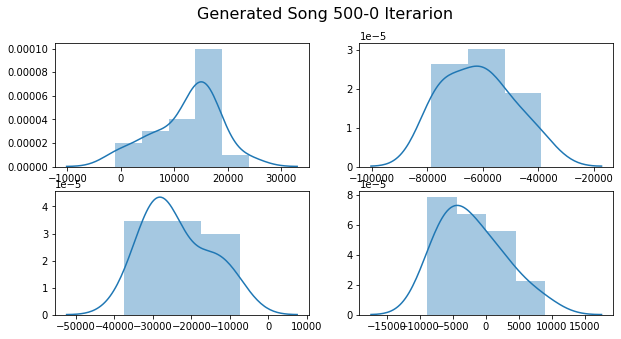

In [60]:
gen_song_500_curriculum_both_complex_std = crnngan_curriculum_both_complex_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_both_complex_std[:,3], ax=axs[1, 1])

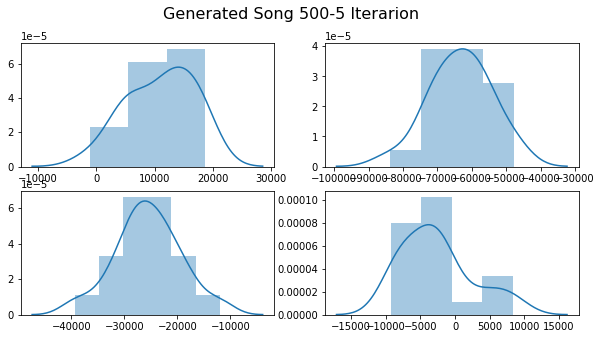

In [61]:
gen_song_500_5_curriculum_both_complex_std = crnngan_curriculum_both_complex_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_std[:,3], ax=axs[1, 1])

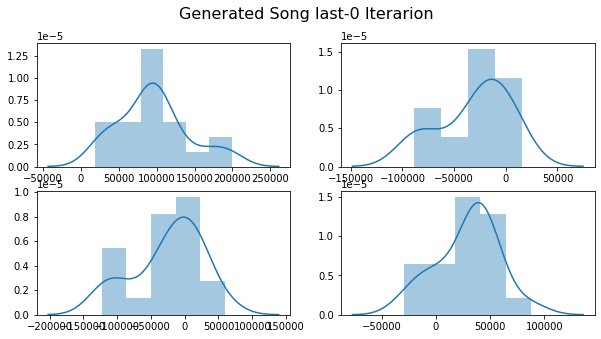

In [62]:
gen_song_last_curriculum_both_complex_std = crnngan_curriculum_both_complex_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_both_complex_std[:,3], ax=axs[1, 1])

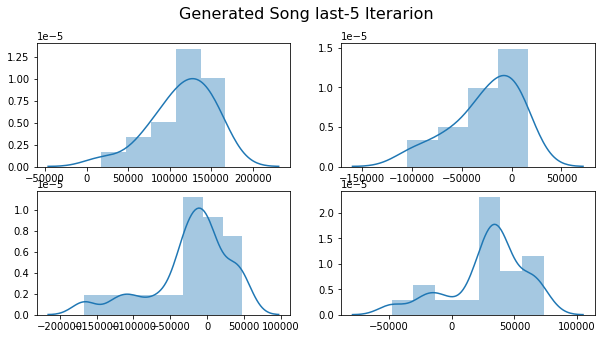

In [63]:
gen_song_last_5_curriculum_both_complex_std = crnngan_curriculum_both_complex_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_both_complex_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_both_complex_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_std[:,3], ax=axs[1, 1])

We keep on getting extreme values...

### Both Complex (3 layers deep gen)

#### No Curriculum

In [64]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_both_complex_deep_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [65]:
crnngan_both_complex_deep_gen_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2155	Loss_G: 21.8111	D(x): -4.6014	D(G(z)): -4.6031 / 0.0000
 Time since epoch started: 0.18
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 3.6398	Loss_G: 1.6901	D(x): -0.1565	D(G(z)): -1.2136 / -0.8113
 Time since epoch started: 1.77
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.9567	Loss_G: 13.7619	D(x): -0.1046	D(G(z)): -0.5250 / -0.4962
 Time since epoch started: 3.32
There are a total of 10 fake songs saved already
Epoch time: 4.10
[1/50][30]	Loss_D: 0.0140	Loss_G: 12.6836	D(x): -0.0002	D(G(z)): -0.0050 / -0.0016
 Time since epoch started: 0.78
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0011	Loss_G: 12.0756	D(x): -0.0007	D(G(z)): -0.0004 / -0.0002
 Time since epoch started: 2.34
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0020	Loss_G: 10.1572	D(x): -0.0004	D(G(z)): -0.0016 / -0.0005
 Time since epoch started: 3.91
There are a total of 25 

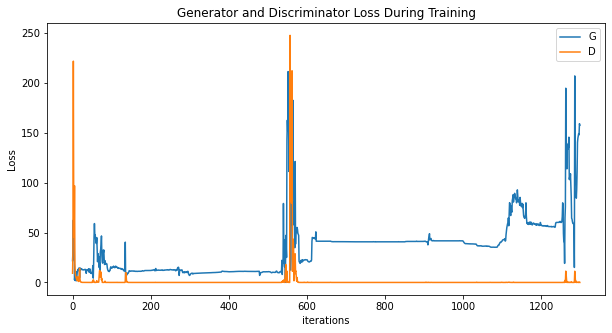

In [66]:
crnngan_both_complex_deep_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


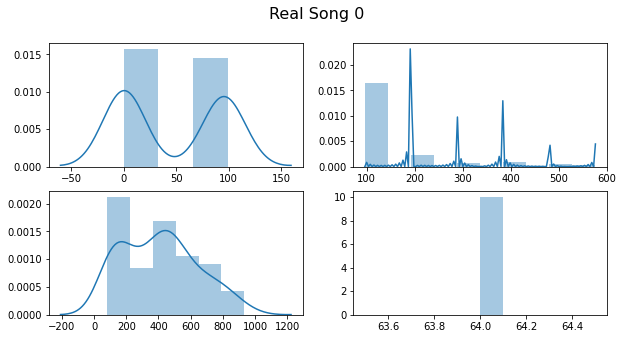

In [68]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

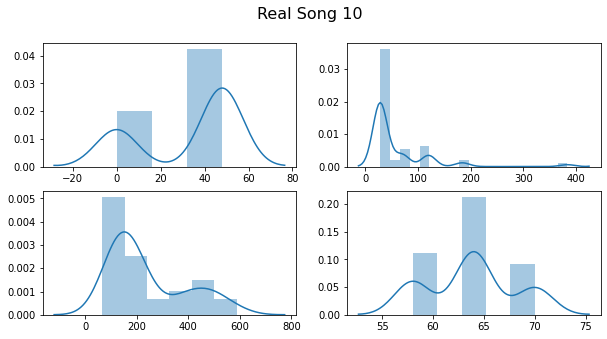

In [69]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

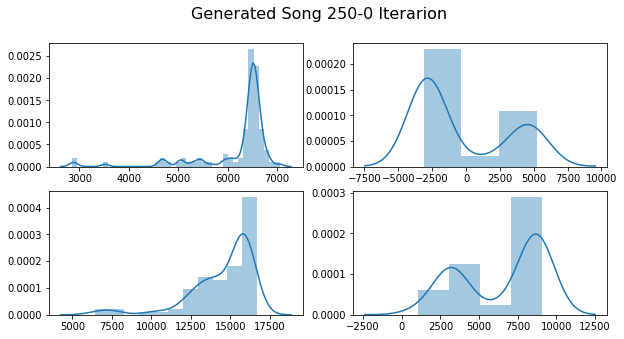

In [70]:
gen_song_250_both_complex_deep_gen_std = crnngan_both_complex_deep_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

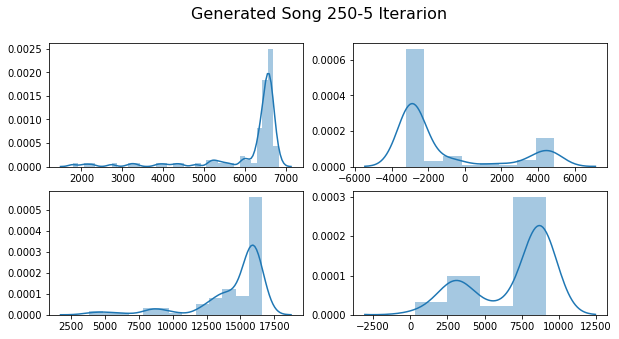

In [71]:
gen_song_250_5_both_complex_deep_gen_std = crnngan_both_complex_deep_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

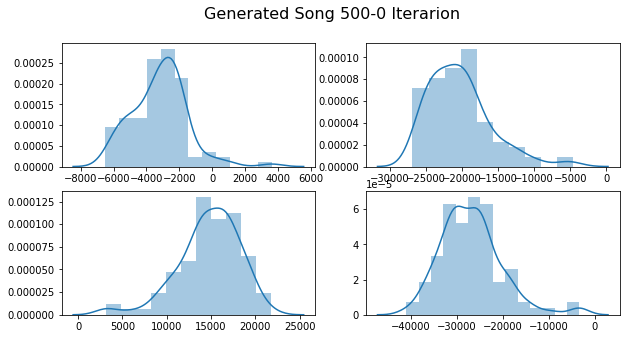

In [72]:
gen_song_500_both_complex_deep_gen_std = crnngan_both_complex_deep_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

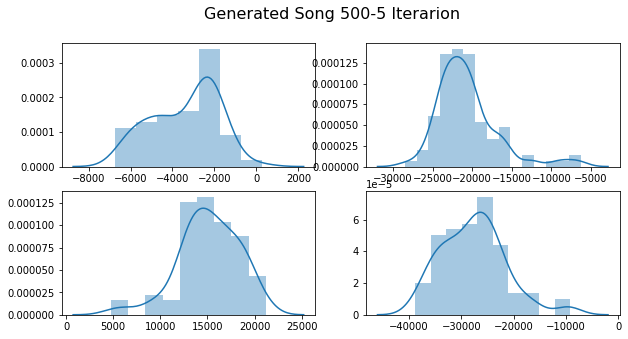

In [73]:
gen_song_500_5_both_complex_deep_gen_std = crnngan_both_complex_deep_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

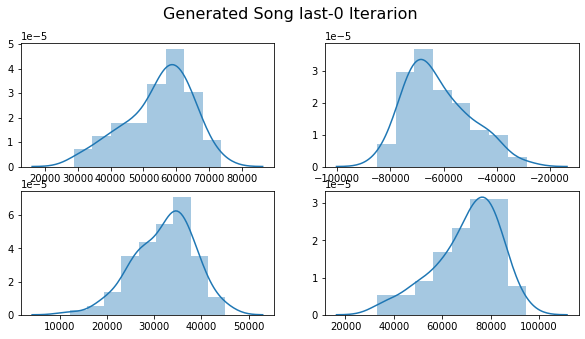

In [74]:
gen_song_last_both_complex_deep_gen_std = crnngan_both_complex_deep_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

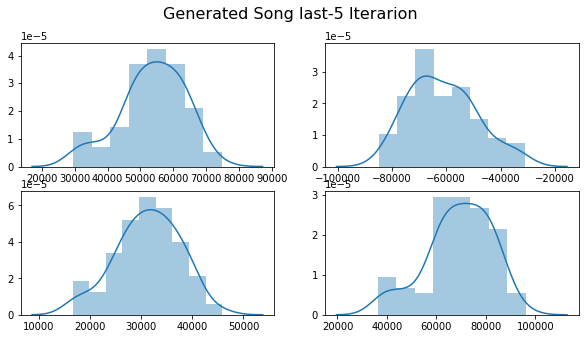

In [75]:
gen_song_last_5_both_complex_deep_gen_std = crnngan_both_complex_deep_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

As usual, good convergence but really bad generated values...

#### Curriculum

In [76]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 2
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_curriculum_both_complex_deep_gen_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [77]:
crnngan_curriculum_both_complex_deep_gen_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9855	Loss_G: 23.3464	D(x): -2.9920	D(G(z)): -2.9921 / 0.0000
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 3.1945	Loss_G: 28.9162	D(x): -0.0332	D(G(z)): -0.0045 / -0.0026
 Time since epoch started: 0.45
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 1.6348	Loss_G: 34.7984	D(x): -0.0449	D(G(z)): -0.0136 / -0.0089
 Time since epoch started: 0.85
There are a total of 10 fake songs saved already
Epoch time: 1.05
[1/80][30]	Loss_D: 0.1235	Loss_G: 21.8151	D(x): 0.0000	D(G(z)): -0.0019 / -0.0042
 Time since epoch started: 0.20
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.0000	Loss_G: 14.2035	D(x): 0.0000	D(G(z)): -0.0000 / -0.0000
 Time since epoch started: 0.59
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.0000	Loss_G: 15.1749	D(x): -0.0000	D(G(z)): -0.0000 / -0.0000
 Time since epoch started: 0.98
There are a total of 25 f

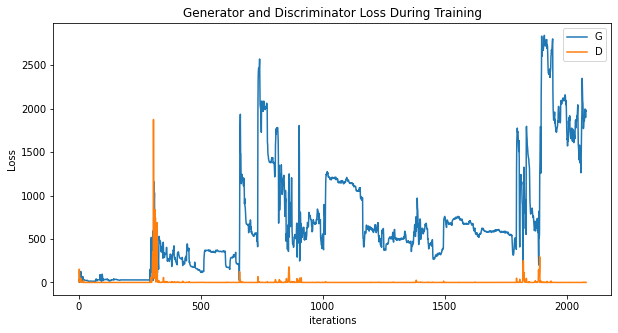

In [78]:
crnngan_curriculum_both_complex_deep_gen_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


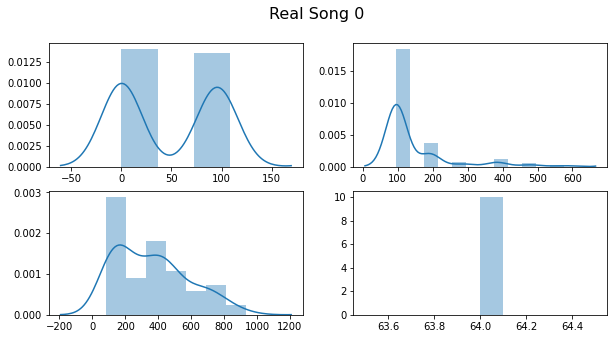

In [80]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

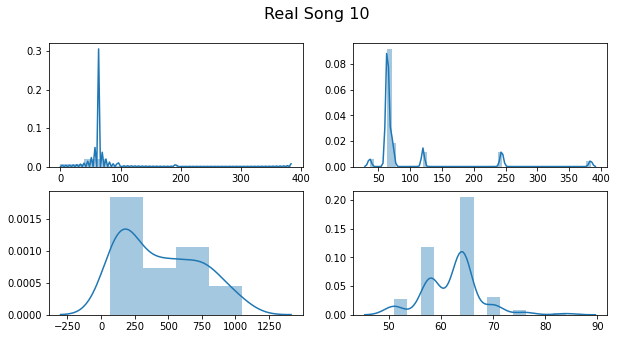

In [81]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

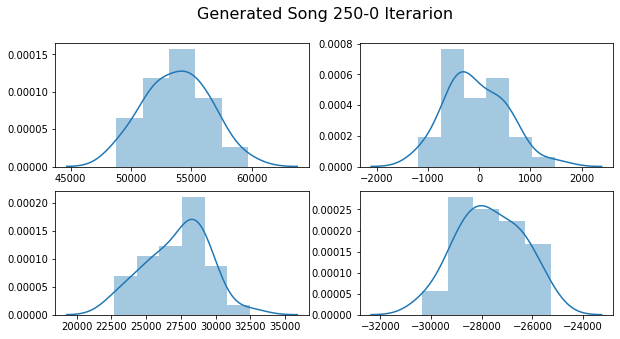

In [82]:
gen_song_250_curriculum_both_complex_deep_gen_std = crnngan_curriculum_both_complex_deep_gen_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

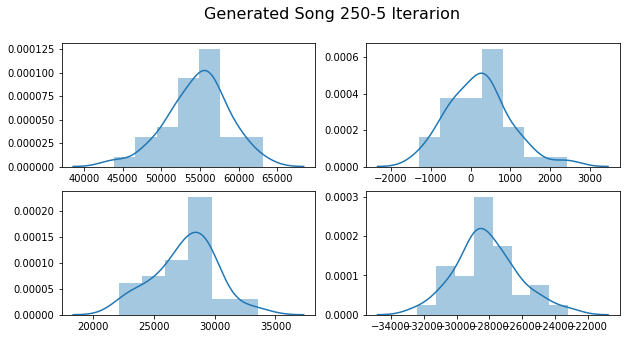

In [83]:
gen_song_250_5_curriculum_both_complex_deep_gen_std = crnngan_curriculum_both_complex_deep_gen_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

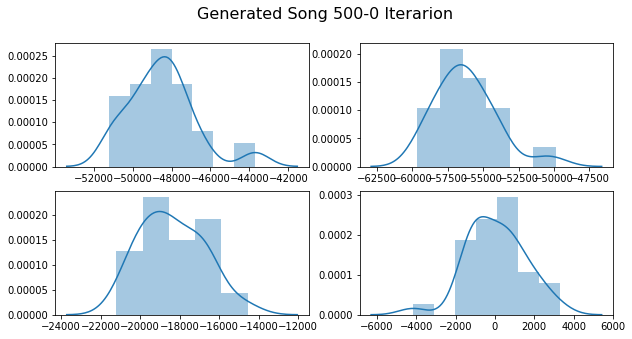

In [84]:
gen_song_500_curriculum_both_complex_deep_gen_std = crnngan_curriculum_both_complex_deep_gen_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

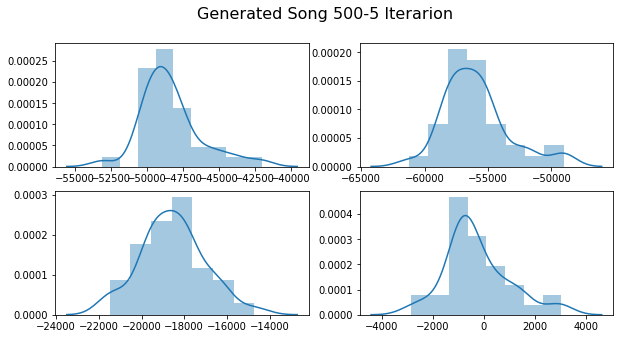

In [85]:
gen_song_500_5_curriculum_both_complex_deep_gen_std = crnngan_curriculum_both_complex_deep_gen_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

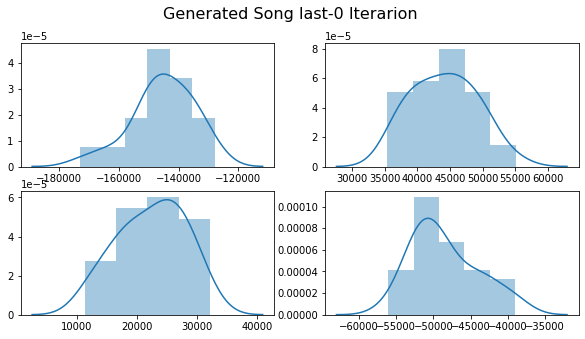

In [86]:
gen_song_last_curriculum_both_complex_deep_gen_std = crnngan_curriculum_both_complex_deep_gen_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

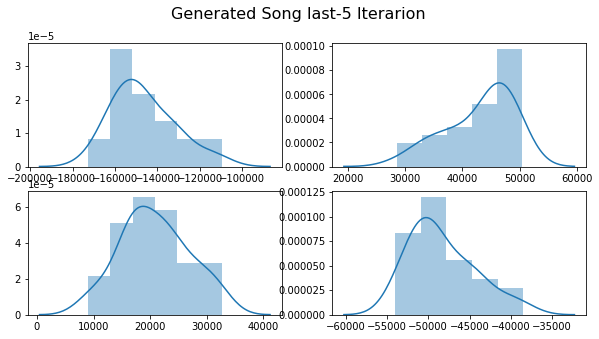

In [87]:
gen_song_last_5_curriculum_both_complex_deep_gen_std = crnngan_curriculum_both_complex_deep_gen_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_gen_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_gen_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_gen_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_gen_std[:,3], ax=axs[1, 1])

### Both Complex (3 layers deep discr)

#### No Curriculum

In [88]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_both_complex_deep_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [89]:
crnngan_both_complex_deep_discr_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2093	Loss_G: 6.7118	D(x): -4.6034	D(G(z)): -4.6036 / -0.0000
 Time since epoch started: 0.19
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 7.6198	Loss_G: 2.0098	D(x): -0.0527	D(G(z)): -0.0527 / -0.7077
 Time since epoch started: 1.91
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 4.8481	Loss_G: 2.5473	D(x): -0.4144	D(G(z)): -0.4144 / -1.2190
 Time since epoch started: 3.62
There are a total of 10 fake songs saved already
Epoch time: 4.47
[1/50][30]	Loss_D: 4.4838	Loss_G: 2.7447	D(x): -0.2457	D(G(z)): -0.2457 / -2.3691
 Time since epoch started: 0.85
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 5.7140	Loss_G: 2.7819	D(x): -0.0178	D(G(z)): -0.0178 / -2.5660
 Time since epoch started: 2.55
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 4.9926	Loss_G: 1.8388	D(x): -0.0232	D(G(z)): -0.0232 / -1.6401
 Time since epoch started: 4.27
There are a total of 25 fake

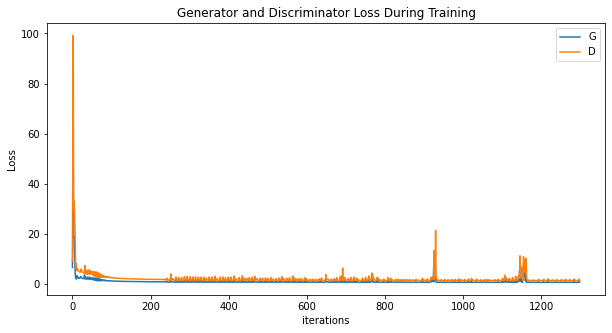

In [90]:
crnngan_both_complex_deep_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


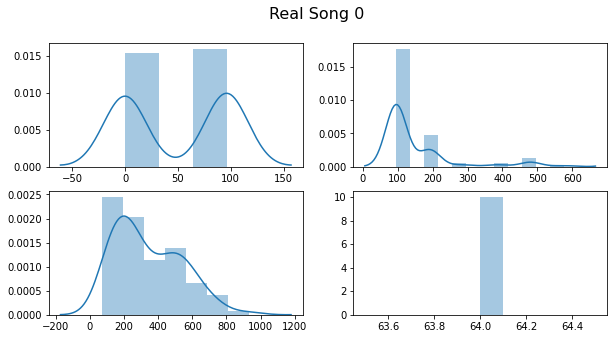

In [92]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

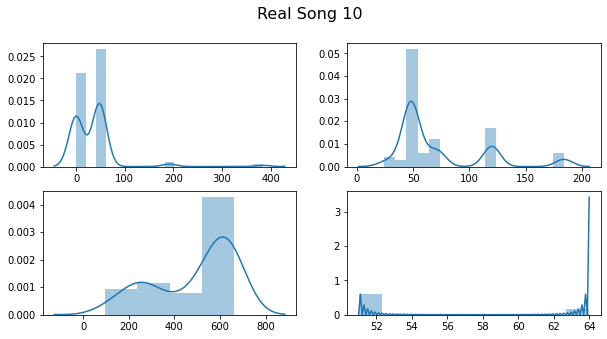

In [93]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

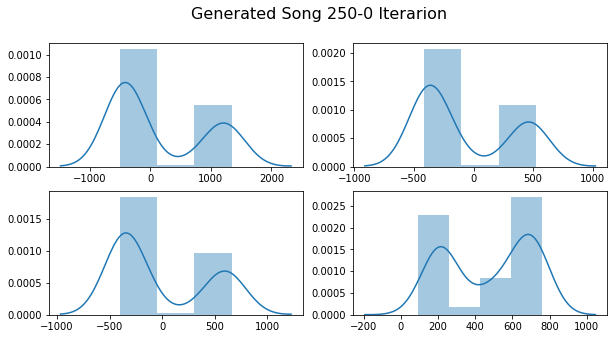

In [94]:
gen_song_250_both_complex_deep_discr_std = crnngan_both_complex_deep_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

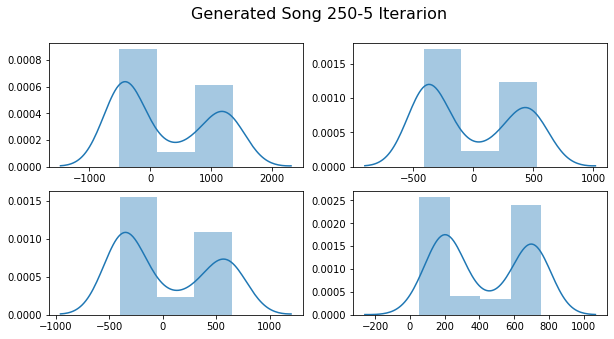

In [95]:
gen_song_250_5_both_complex_deep_discr_std = crnngan_both_complex_deep_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

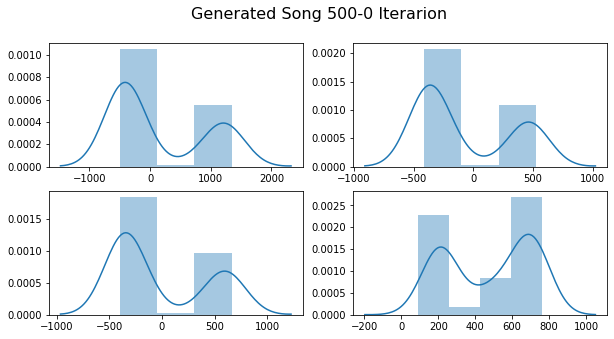

In [96]:
gen_song_500_both_complex_deep_discr_std = crnngan_both_complex_deep_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

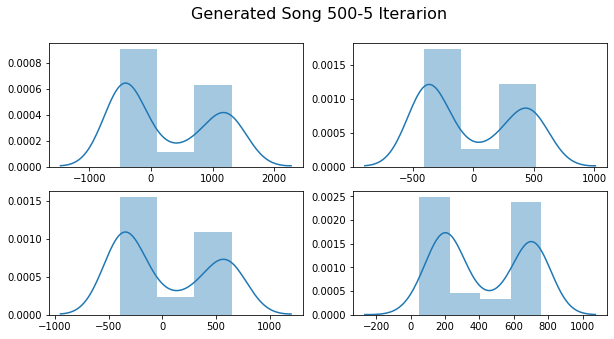

In [97]:
gen_song_500_5_both_complex_deep_discr_std = crnngan_both_complex_deep_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

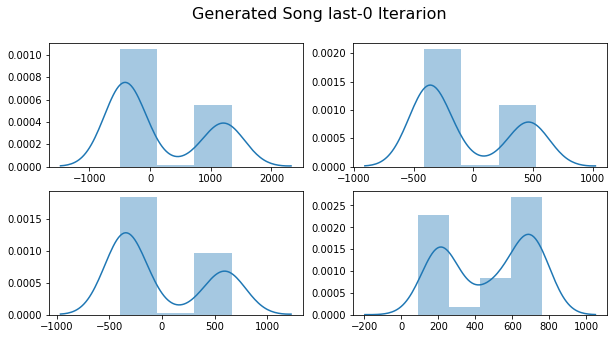

In [98]:
gen_song_last_both_complex_deep_discr_std = crnngan_both_complex_deep_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

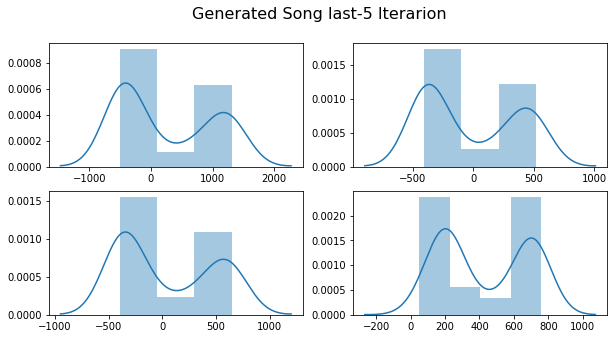

In [99]:
gen_song_last_5_both_complex_deep_discr_std = crnngan_both_complex_deep_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

Again, good convergence and really bad generated values...

#### Curriculum

In [100]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 2
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_curriculum_both_complex_deep_discr_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [101]:
crnngan_curriculum_both_complex_deep_discr_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9935	Loss_G: 6.5086	D(x): -2.9939	D(G(z)): -2.9939 / -0.0000
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 8.3086	Loss_G: 10.6007	D(x): -0.0181	D(G(z)): -0.2809 / -0.0537
 Time since epoch started: 0.48
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.9028	Loss_G: 15.7738	D(x): -0.0453	D(G(z)): -0.0027 / -0.0023
 Time since epoch started: 0.91
There are a total of 10 fake songs saved already
Epoch time: 1.12
[1/80][30]	Loss_D: 0.0575	Loss_G: 5.5924	D(x): -0.0046	D(G(z)): -0.0017 / -0.0493
 Time since epoch started: 0.21
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 0.2326	Loss_G: 13.8769	D(x): -0.0001	D(G(z)): -0.0004 / -0.0004
 Time since epoch started: 0.64
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.3070	Loss_G: 6.2946	D(x): -0.0874	D(G(z)): -0.0324 / -0.0385
 Time since epoch started: 1.06
There are a total of 25 f

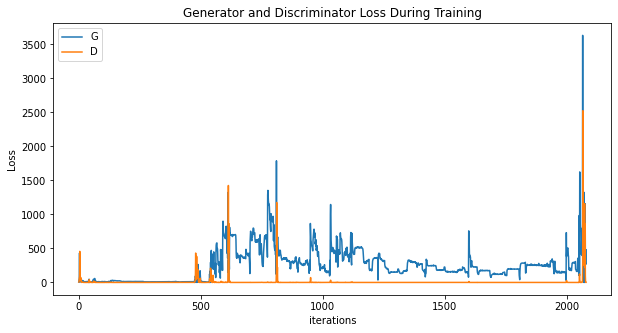

In [102]:
crnngan_curriculum_both_complex_deep_discr_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


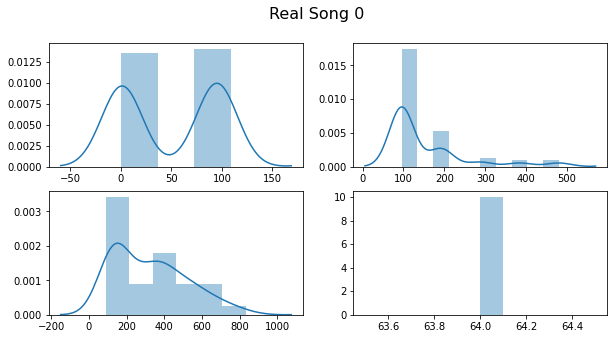

In [104]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

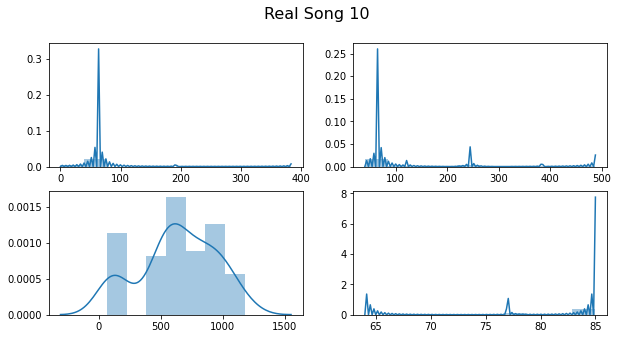

In [105]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

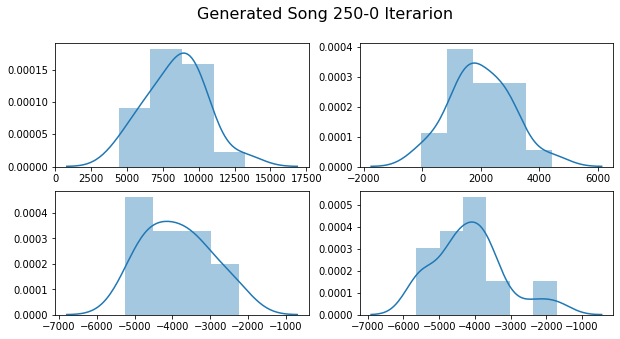

In [106]:
gen_song_250_curriculum_both_complex_deep_discr_std = crnngan_curriculum_both_complex_deep_discr_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

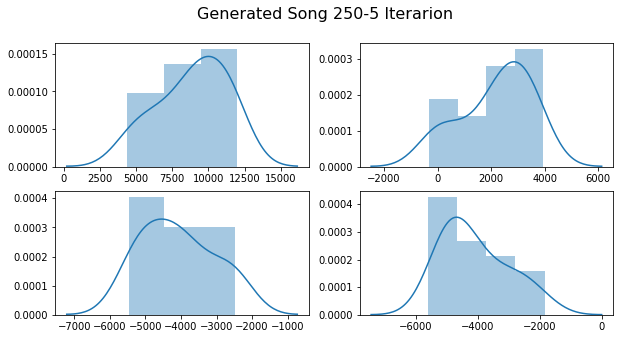

In [107]:
gen_song_250_5_curriculum_both_complex_deep_discr_std = crnngan_curriculum_both_complex_deep_discr_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

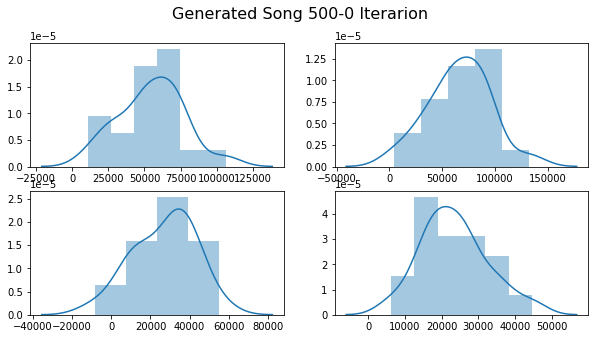

In [108]:
gen_song_500_curriculum_both_complex_deep_discr_std = crnngan_curriculum_both_complex_deep_discr_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

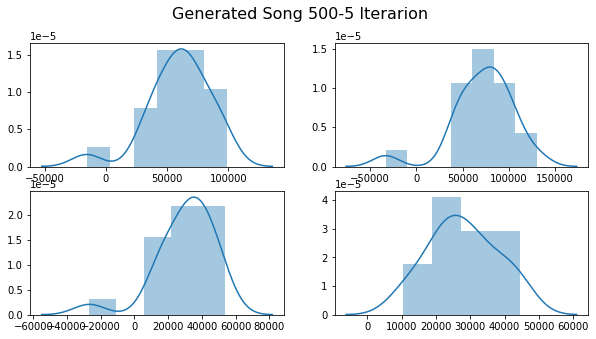

In [109]:
gen_song_500_5_curriculum_both_complex_deep_discr_std = crnngan_curriculum_both_complex_deep_discr_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

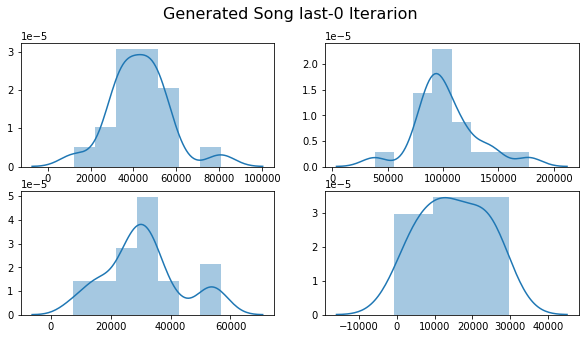

In [110]:
gen_song_last_curriculum_both_complex_deep_discr_std = crnngan_curriculum_both_complex_deep_discr_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

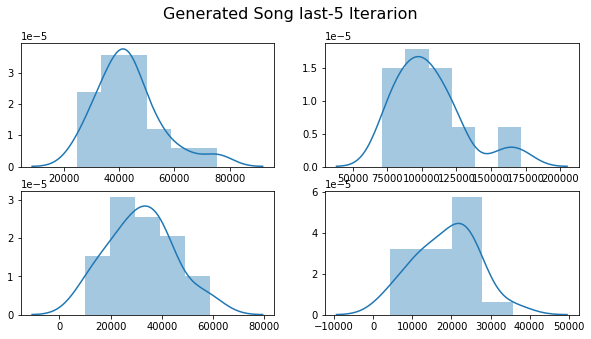

In [111]:
gen_song_last_5_curriculum_both_complex_deep_discr_std = crnngan_curriculum_both_complex_deep_discr_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_discr_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_discr_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_discr_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_discr_std[:,3], ax=axs[1, 1])

### Both Complex (3 layers deep both)

#### No Curriculum

In [112]:
# Data loader
batch_length = 100
sequence_length = 100
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 50
curriculum_learning = False
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_both_complex_deep_both_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [113]:
crnngan_both_complex_deep_both_std.trainloop(musicDataLoader)

Start training for 50 epochs
[0/50][0]	Loss_D: 9.2117	Loss_G: 4.3603	D(x): -4.6038	D(G(z)): -4.6043 / -0.0103
 Time since epoch started: 0.20
There are a total of 0 fake songs saved already
[0/50][10]	Loss_D: 8.8471	Loss_G: 234.5732	D(x): -3.3472	D(G(z)): -0.0564 / -0.0052
 Time since epoch started: 2.09
There are a total of 5 fake songs saved already
[0/50][20]	Loss_D: 0.0003	Loss_G: 88.9920	D(x): -0.0003	D(G(z)): 0.0000 / 0.0000
 Time since epoch started: 3.97
There are a total of 10 fake songs saved already
Epoch time: 4.92
[1/50][30]	Loss_D: 0.0006	Loss_G: 178.7126	D(x): -0.0006	D(G(z)): 0.0000 / 0.0000
 Time since epoch started: 0.94
There are a total of 15 fake songs saved already
[1/50][40]	Loss_D: 0.0005	Loss_G: 149.6713	D(x): -0.0005	D(G(z)): -0.0000 / -0.0000
 Time since epoch started: 2.81
There are a total of 20 fake songs saved already
[1/50][50]	Loss_D: 0.0293	Loss_G: 210.5980	D(x): -0.0003	D(G(z)): -0.0002 / -0.0002
 Time since epoch started: 4.69
There are a total of 25

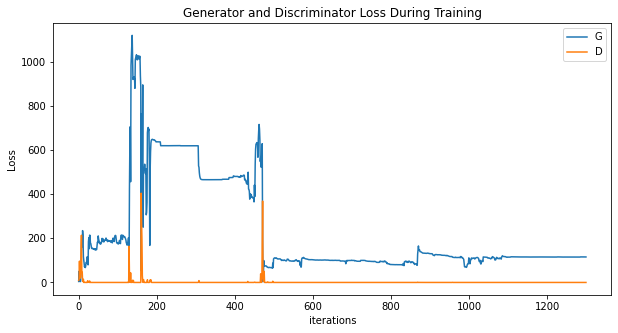

In [114]:
crnngan_both_complex_deep_both_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


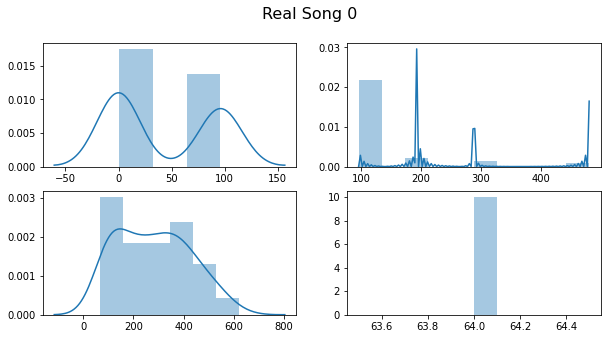

In [116]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

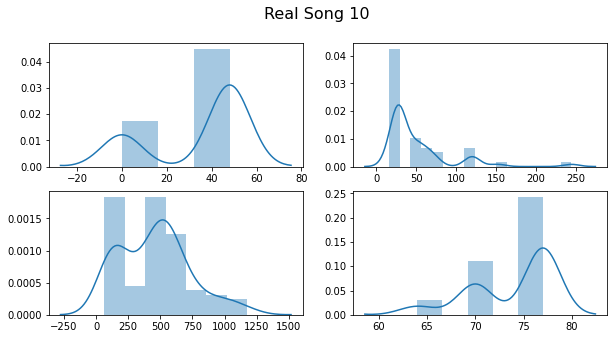

In [117]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

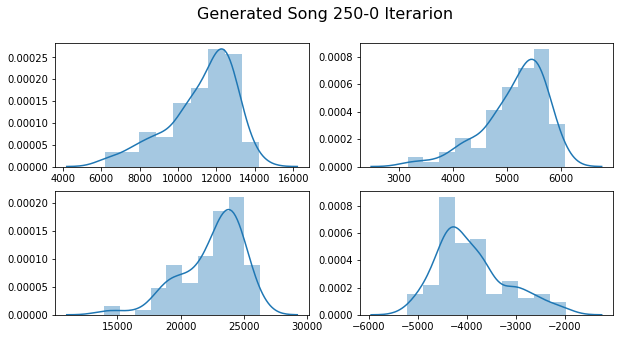

In [118]:
gen_song_250_both_complex_deep_both_std = crnngan_both_complex_deep_both_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_both_complex_deep_both_std[:,3], ax=axs[1, 1])

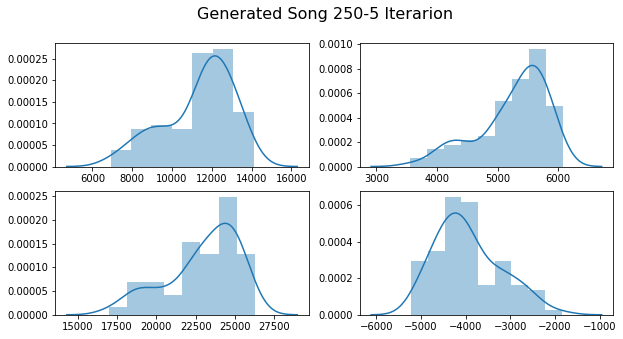

In [119]:
gen_song_250_5_both_complex_deep_both_std = crnngan_both_complex_deep_both_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_both_complex_deep_both_std[:,3], ax=axs[1, 1])

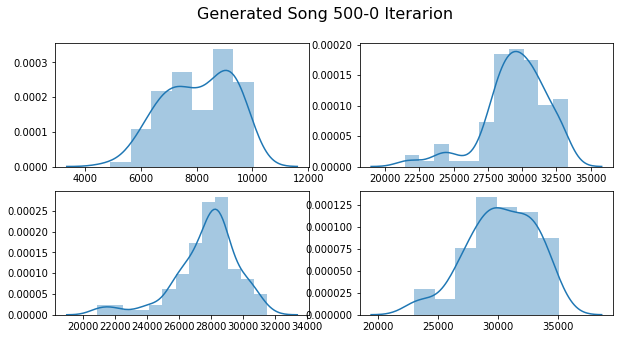

In [120]:
gen_song_500_both_complex_deep_both_std = crnngan_both_complex_deep_both_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_both_complex_deep_both_std[:,3], ax=axs[1, 1])

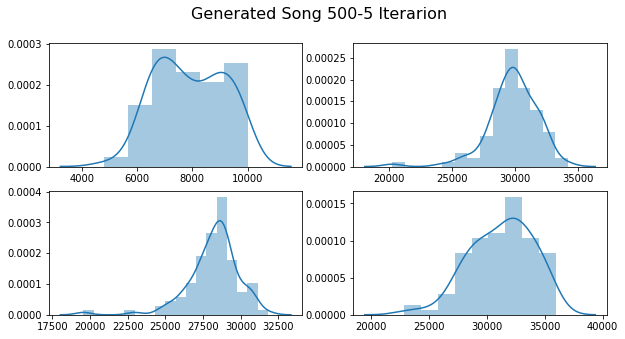

In [121]:
gen_song_500_5_both_complex_deep_both_std = crnngan_both_complex_deep_both_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_both_complex_deep_both_std[:,3], ax=axs[1, 1])

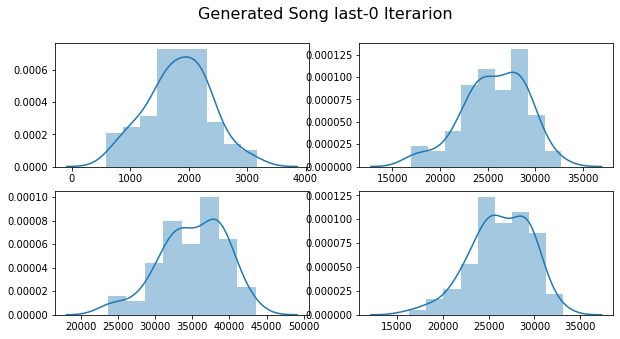

In [122]:
gen_song_last_both_complex_deep_both_std = crnngan_both_complex_deep_both_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_both_complex_deep_both_std[:,3], ax=axs[1, 1])

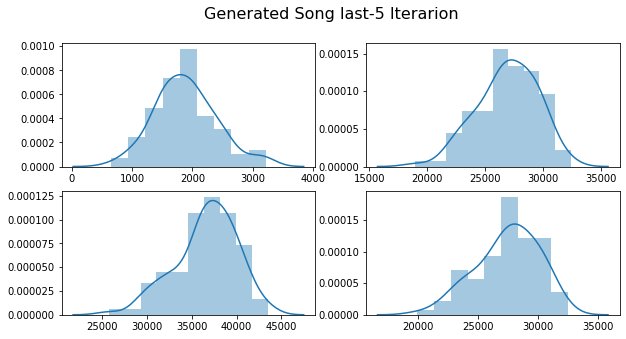

In [123]:
gen_song_last_5_both_complex_deep_both_std = crnngan_both_complex_deep_both_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_both_complex_deep_both_std[:,3], ax=axs[1, 1])

Again, good convergence and really bad generated values...

#### Curriculum

In [124]:
# Data loader
batch_length = 100
sequence_length = 20
# Generator parameters
in_channels_g = 20
out_channels_g = 4
hidden_dim_g = 350
n_layers_g = 3
# Discriminator parameters
in_channels_d = 4
out_channels_d = 2
hidden_dim_d = 350
n_layers_d = 3
# General
epochs = 80
curriculum_learning = True
G_var_threshold = 1e-3
D_var_threshold = 1e-3
max_sequence_length = 200
scale = 'standard'
scale_values = [(means[i], stds[i]) for i in range(len(means))]
complexGenerator = True
complexDiscriminator = True

crnngan_curriculum_both_complex_deep_both_std = crnngan.CRNNGAN(batch_length, sequence_length,
                 in_channels_g, out_channels_g, hidden_dim_g, n_layers_g,
                 in_channels_d, out_channels_d, hidden_dim_d, n_layers_d,
                 curriculum_learning = curriculum_learning, epochs=epochs,
                 scale=scale, scale_values=scale_values,
                 G_var_threshold=G_var_threshold, D_var_threshold=D_var_threshold,
                 max_sequence_length=max_sequence_length,
                 complexGenerator=complexGenerator, complexDiscriminator=complexDiscriminator)

cuda
Complex Generator
Complex Discriminator


In [125]:
crnngan_curriculum_both_complex_deep_both_std.trainloop(musicDataLoader)

Start training for 80 epochs
[0/80][0]	Loss_D: 5.9897	Loss_G: 10.3896	D(x): -2.9945	D(G(z)): -2.9946 / 0.0000
 Time since epoch started: 0.05
There are a total of 0 fake songs saved already
[0/80][10]	Loss_D: 1.7089	Loss_G: 7.7929	D(x): -1.3538	D(G(z)): -0.2932 / -0.3612
 Time since epoch started: 0.54
There are a total of 5 fake songs saved already
[0/80][20]	Loss_D: 0.5312	Loss_G: 15.3698	D(x): -0.1211	D(G(z)): -0.2167 / -0.8130
 Time since epoch started: 1.00
There are a total of 10 fake songs saved already
Epoch time: 1.23
[1/80][30]	Loss_D: 0.9610	Loss_G: 125.8271	D(x): -0.1781	D(G(z)): -0.3808 / -0.0877
 Time since epoch started: 0.23
There are a total of 15 fake songs saved already
[1/80][40]	Loss_D: 1.0653	Loss_G: 11.2117	D(x): -0.2834	D(G(z)): -0.0316 / -0.0027
 Time since epoch started: 0.70
There are a total of 20 fake songs saved already
[1/80][50]	Loss_D: 0.0532	Loss_G: 20.3618	D(x): -0.0100	D(G(z)): -0.0061 / -0.0004
 Time since epoch started: 1.18
There are a total of 25

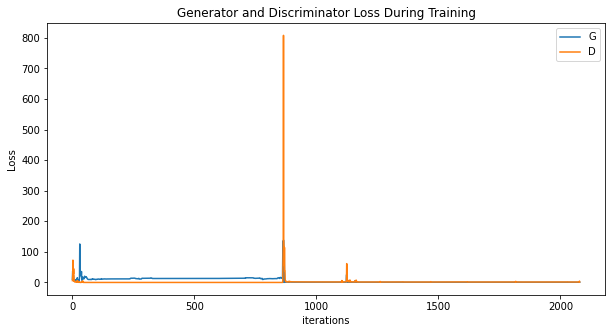

In [126]:
crnngan_curriculum_both_complex_deep_both_std.plot_losses()

In [0]:
seq_length = 100
batch_length = 100
musicDataLoader.rewind('train')
_, batch_data = musicDataLoader.get_batch(batchsize=batch_length, songlength=seq_length)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


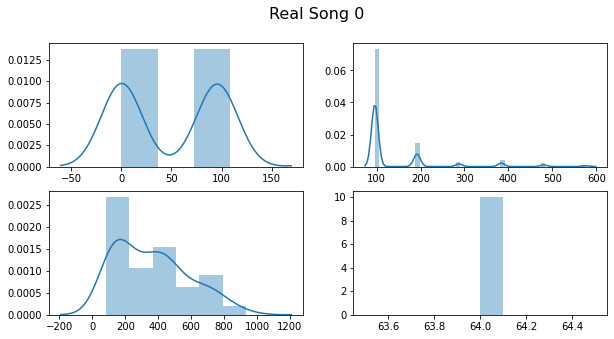

In [128]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 0 ', fontsize=16)
sns.distplot(batch_data[0,:,0], ax=axs[0, 0])
sns.distplot(batch_data[0,:,1], ax=axs[0, 1])
sns.distplot(batch_data[0,:,2], ax=axs[1, 0])
sns.distplot(batch_data[0,:,3], ax=axs[1, 1])

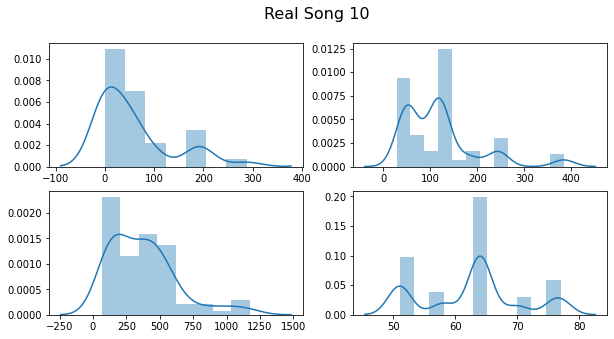

In [129]:
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Real Song 10 ', fontsize=16)
sns.distplot(batch_data[10,:,0], ax=axs[0, 0])
sns.distplot(batch_data[10,:,1], ax=axs[0, 1])
sns.distplot(batch_data[10,:,2], ax=axs[1, 0])
sns.distplot(batch_data[10,:,3], ax=axs[1, 1])

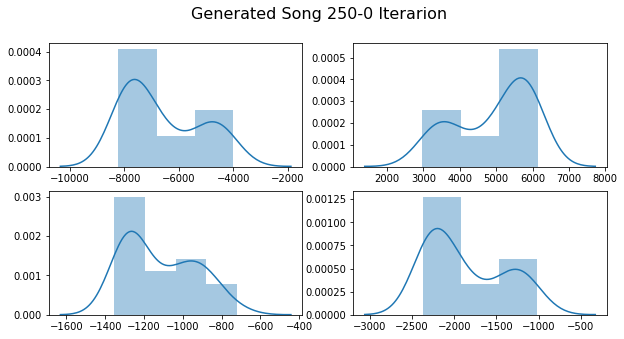

In [130]:
gen_song_250_curriculum_both_complex_deep_both_std = crnngan_curriculum_both_complex_deep_both_std.generated_songs[250][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-0 Iterarion', fontsize=16)
sns.distplot(gen_song_250_curriculum_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_curriculum_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_curriculum_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_curriculum_both_complex_deep_both_std[:,3], ax=axs[1, 1])

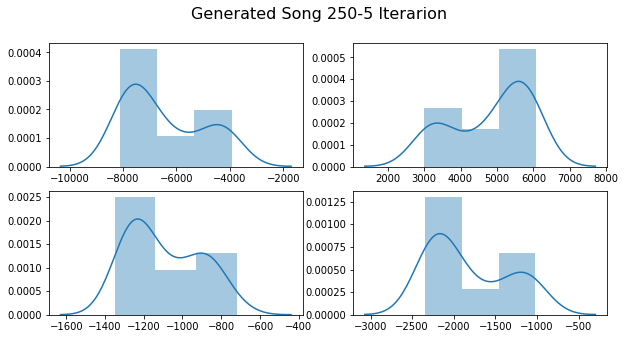

In [131]:
gen_song_250_5_curriculum_both_complex_deep_both_std = crnngan_curriculum_both_complex_deep_both_std.generated_songs[250][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 250-5 Iterarion', fontsize=16)
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_250_5_curriculum_both_complex_deep_both_std[:,3], ax=axs[1, 1])

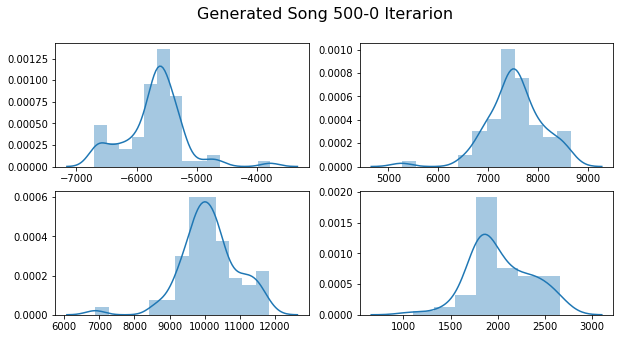

In [132]:
gen_song_500_curriculum_both_complex_deep_both_std = crnngan_curriculum_both_complex_deep_both_std.generated_songs[500][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-0 Iterarion', fontsize=16)
sns.distplot(gen_song_500_curriculum_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_curriculum_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_curriculum_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_curriculum_both_complex_deep_both_std[:,3], ax=axs[1, 1])

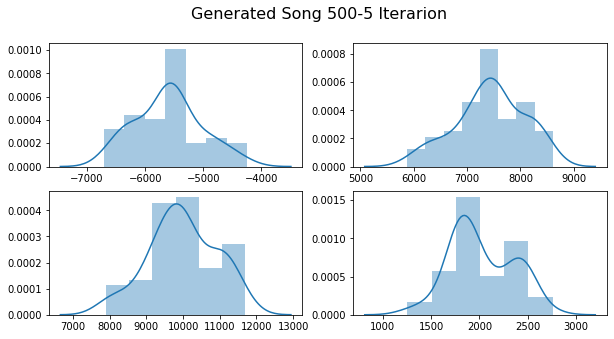

In [133]:
gen_song_500_5_curriculum_both_complex_deep_both_std = crnngan_curriculum_both_complex_deep_both_std.generated_songs[500][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song 500-5 Iterarion', fontsize=16)
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_500_5_curriculum_both_complex_deep_both_std[:,3], ax=axs[1, 1])

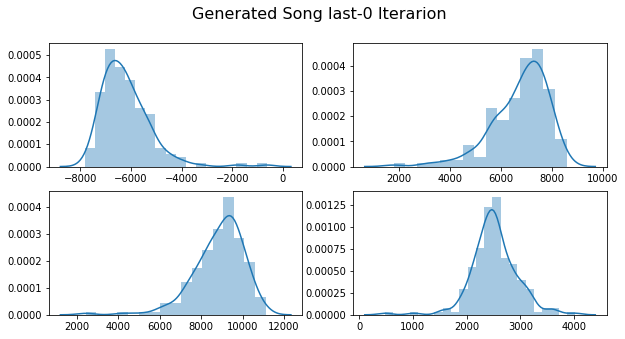

In [134]:
gen_song_last_curriculum_both_complex_deep_both_std = crnngan_curriculum_both_complex_deep_both_std.generated_songs[-1][0].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-0 Iterarion', fontsize=16)
sns.distplot(gen_song_last_curriculum_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_curriculum_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_curriculum_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_curriculum_both_complex_deep_both_std[:,3], ax=axs[1, 1])

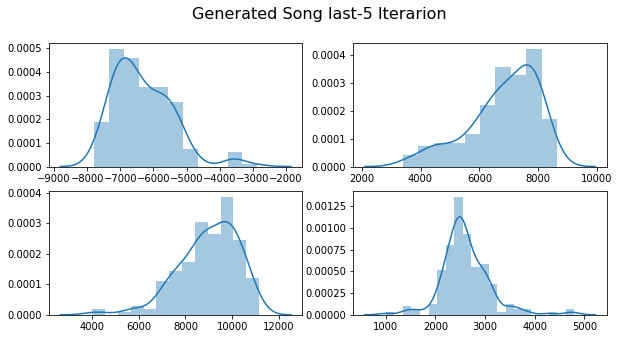

In [135]:
gen_song_last_5_curriculum_both_complex_deep_both_std = crnngan_curriculum_both_complex_deep_both_std.generated_songs[-1][5].cpu().numpy()
fig, axs = plt.subplots(2, 2, figsize=(10,5))
fig.suptitle('Generated Song last-5 Iterarion', fontsize=16)
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_both_std[:,0], ax=axs[0, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_both_std[:,1], ax=axs[0, 1])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_both_std[:,2], ax=axs[1, 0])
sns.distplot(gen_song_last_5_curriculum_both_complex_deep_both_std[:,3], ax=axs[1, 1])